In [ ]:
  import kagglehub

# Download latest version
path = kagglehub.dataset_download("mariaherrerot/aptos2019")

print("Path to dataset files:", path)

 90%|████████▉ | 7.20G/8.01G [01:34<00:09, 90.3MB/s]

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.models import resnet50
import torch.nn as nn
import torch.optim as optim
from PIL import Image

# 1️⃣ Load Dataset
dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"
image_dir = os.path.join(dataset_path, "train_images")
train_df = pd.read_csv(f"{dataset_path}/train_1.csv")

# 2️⃣ Enhanced Noise Reduction & Preprocessing
def preprocess_image(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Convert to grayscale and apply CLAHE for contrast enhancement
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    cl = clahe.apply(l)
    lab = cv2.merge((cl, a, b))
    enhanced_image = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

    # Denoising with Advanced Non-Local Means (higher strength)
    denoised_image = cv2.fastNlMeansDenoisingColored(enhanced_image, None, 15, 15, 7, 21)

    # Bilateral Filtering for edge-preserving smoothing
    bilateral_filtered = cv2.bilateralFilter(denoised_image, d=9, sigmaColor=75, sigmaSpace=75)

    # Adaptive Gaussian Thresholding for finer noise removal
    gray = cv2.cvtColor(bilateral_filtered, cv2.COLOR_RGB2GRAY)
    adaptive_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

    # Convert back to RGB and return
    final_image = cv2.cvtColor(adaptive_thresh, cv2.COLOR_GRAY2RGB)
    return final_image

# 3️⃣ Dataset Class
class RetinalDataset(Dataset):
    def _init_(self, dataframe, img_dir, transform=None):
        self.dataframe = dataframe
        self.img_dir = img_dir
        self.transform = transform

    def _len_(self):
        return len(self.dataframe)

    def _getitem_(self, idx):
        img_name = os.path.join(self.img_dir, self.dataframe.iloc[idx, 0] + ".png")
        image = preprocess_image(img_name)

        # Convert to tensor
        image = Image.fromarray(image)
        if self.transform:
            image = self.transform(image)

        label = torch.tensor(self.dataframe.iloc[idx, 1], dtype=torch.long)
        return image, label

# 4️⃣ Transformations & Dataloader
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

dataset = RetinalDataset(train_df, image_dir, transform=transform)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

# 5️⃣ Model Setup
model = resnet50(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 5)  # Assuming 5 classes

# Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# 6️⃣ Training Loop
num_epochs = 5
for epoch in range(num_epochs):
    for images, labels in dataloader:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {loss.item():.4f}")

# 7️⃣ Save Model
torch.save(model.state_dict(), "retinal_segmentation.pth")
print("Model training complete & saved!")

TypeError: RetinalDataset() takes no arguments

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.models import resnet50
import torch.nn as nn
import torch.optim as optim
from PIL import Image
from skimage.segmentation import slic, felzenszwalb
from skimage.future import graph
from sklearn.cluster import KMeans, MeanShift
from skimage.measure import label, regionprops

# 1️⃣ Load Dataset
dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"
image_dir = os.path.join(dataset_path, "train_images")
train_df = pd.read_csv(f"{dataset_path}/train_1.csv")

# 2️⃣ Noise Reduction (Linear & Non-Linear Filtering)
def preprocess_image(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Apply Gaussian Blur (Linear Filter)
    gaussian_blurred = cv2.GaussianBlur(image, (5, 5), 0)

    # Apply Median Filter (Non-Linear Filter)
    median_filtered = cv2.medianBlur(gaussian_blurred, 5)

    return median_filtered

# 3️⃣ Segmentation Techniques
def kmeans_segmentation(image, k=3):
    pixel_values = image.reshape((-1, 3))
    pixel_values = np.float32(pixel_values)
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(pixel_values)
    segmented_image = labels.reshape(image.shape[:2])
    return segmented_image

def mean_shift_segmentation(image):
    flat_image = image.reshape((-1, 3))
    mean_shift = MeanShift()
    mean_shift.fit(flat_image)
    labels = mean_shift.labels_.reshape(image.shape[:2])
    return labels

def graph_based_segmentation(image):
    segments = felzenszwalb(image, scale=100, sigma=0.5, min_size=50)
    return segments

# 4️⃣ Region-Based Processing
def region_growing(image, seed=(50, 50), threshold=20):
    height, width = image.shape[:2]
    segmented = np.zeros_like(image[:, :, 0])
    stack = [seed]
    while stack:
        x, y = stack.pop()
        if segmented[x, y] == 0:
            segmented[x, y] = 255
            for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
                nx, ny = x + dx, y + dy
                if 0 <= nx < height and 0 <= ny < width:
                    if np.linalg.norm(image[nx, ny] - image[x, y]) < threshold:
                        stack.append((nx, ny))
    return segmented

def connected_component_analysis(image):
    labeled_image = label(image)
    return labeled_image

# 5️⃣ Evaluation Metrics
def compute_iou(ground_truth, predicted):
    intersection = np.logical_and(ground_truth, predicted).sum()
    union = np.logical_or(ground_truth, predicted).sum()
    return intersection / union if union > 0 else 0

def compute_dice(ground_truth, predicted):
    intersection = np.logical_and(ground_truth, predicted).sum()
    return (2 * intersection) / (ground_truth.sum() + predicted.sum()) if ground_truth.sum() + predicted.sum() > 0 else 0

def pixel_accuracy(ground_truth, predicted):
    return np.mean(ground_truth == predicted)

# 6️⃣ Hybrid Segmentation Pipeline
def hybrid_segmentation_pipeline(image_path):
    image = preprocess_image(image_path)
    kmeans_result = kmeans_segmentation(image)
    mean_shift_result = mean_shift_segmentation(image)
    graph_result = graph_based_segmentation(image)
    region_grow_result = region_growing(image)
    cca_result = connected_component_analysis(region_grow_result)
    return kmeans_result, mean_shift_result, graph_result, region_grow_result, cca_result

# 7️⃣ Visualization
def visualize_results(image, kmeans_res, mean_shift_res, graph_res, region_grow_res, cca_res):
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes[0, 0].imshow(image)
    axes[0, 0].set_title("Original Image")
    axes[0, 1].imshow(kmeans_res, cmap='gray')
    axes[0, 1].set_title("K-Means Segmentation")
    axes[0, 2].imshow(mean_shift_res, cmap='gray')
    axes[0, 2].set_title("Mean Shift Segmentation")
    axes[1, 0].imshow(graph_res, cmap='gray')
    axes[1, 0].set_title("Graph-Based Segmentation")
    axes[1, 1].imshow(region_grow_res, cmap='gray')
    axes[1, 1].set_title("Region Growing")
    axes[1, 2].imshow(cca_res, cmap='gray')
    axes[1, 2].set_title("Connected Component Analysis")
    plt.show()

# 8️⃣ Run Experiment
image_sample_path = os.path.join(image_dir, train_df.iloc[0, 0] + ".png")
kmeans_res, mean_shift_res, graph_res, region_grow_res, cca_res = hybrid_segmentation_pipeline(image_sample_path)
visualize_results(preprocess_image(image_sample_path), kmeans_res, mean_shift_res, graph_res, region_grow_res, cca_res)

# 9️⃣ Final Report
print(f"IoU Score: {compute_iou(kmeans_res, region_grow_res):.4f}")
print(f"Dice Coefficient: {compute_dice(kmeans_res, region_grow_res):.4f}")
print(f"Pixel Accuracy: {pixel_accuracy(kmeans_res, region_grow_res):.4f}")


ImportError: cannot import name 'graph' from 'skimage.future' (/usr/local/lib/python3.11/dist-packages/skimage/future/__init__.py)

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.models import resnet50
import torch.nn as nn
import torch.optim as optim
from PIL import Image
from skimage.segmentation import slic, felzenszwalb
from skimage import future  # Fixed import issue
from sklearn.cluster import KMeans, MeanShift
from skimage.measure import label, regionprops

# 1️⃣ Load Dataset
dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"
image_dir = os.path.join(dataset_path, "train_images")
train_df = pd.read_csv(f"{dataset_path}/train_1.csv")

# 2️⃣ Noise Reduction (Linear & Non-Linear Filtering)
def preprocess_image(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Apply Gaussian Blur (Linear Filter)
    gaussian_blurred = cv2.GaussianBlur(image, (5, 5), 0)

    # Apply Median Filter (Non-Linear Filter)
    median_filtered = cv2.medianBlur(gaussian_blurred, 5)

    return median_filtered

# 3️⃣ Segmentation Techniques
def kmeans_segmentation(image, k=3):
    pixel_values = image.reshape((-1, 3))
    pixel_values = np.float32(pixel_values)
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(pixel_values)
    segmented_image = labels.reshape(image.shape[:2])
    return segmented_image

def mean_shift_segmentation(image):
    flat_image = image.reshape((-1, 3))
    mean_shift = MeanShift()
    mean_shift.fit(flat_image)
    labels = mean_shift.labels_.reshape(image.shape[:2])
    return labels

def graph_based_segmentation(image):
    segments = felzenszwalb(image, scale=100, sigma=0.5, min_size=50)
    return segments

# 4️⃣ Region-Based Processing
def region_growing(image, seed=(50, 50), threshold=20):
    height, width = image.shape[:2]
    segmented = np.zeros_like(image[:, :, 0])
    stack = [seed]
    while stack:
        x, y = stack.pop()
        if segmented[x, y] == 0:
            segmented[x, y] = 255
            for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
                nx, ny = x + dx, y + dy
                if 0 <= nx < height and 0 <= ny < width:
                    if np.linalg.norm(image[nx, ny] - image[x, y]) < threshold:
                        stack.append((nx, ny))
    return segmented

def connected_component_analysis(image):
    labeled_image = label(image)
    return labeled_image

# 5️⃣ Evaluation Metrics
def compute_iou(ground_truth, predicted):
    intersection = np.logical_and(ground_truth, predicted).sum()
    union = np.logical_or(ground_truth, predicted).sum()
    return intersection / union if union > 0 else 0

def compute_dice(ground_truth, predicted):
    intersection = np.logical_and(ground_truth, predicted).sum()
    return (2 * intersection) / (ground_truth.sum() + predicted.sum()) if ground_truth.sum() + predicted.sum() > 0 else 0

def pixel_accuracy(ground_truth, predicted):
    return np.mean(ground_truth == predicted)

# 6️⃣ Hybrid Segmentation Pipeline
def hybrid_segmentation_pipeline(image_path):
    image = preprocess_image(image_path)
    kmeans_result = kmeans_segmentation(image)
    mean_shift_result = mean_shift_segmentation(image)
    graph_result = graph_based_segmentation(image)
    region_grow_result = region_growing(image)
    cca_result = connected_component_analysis(region_grow_result)
    return kmeans_result, mean_shift_result, graph_result, region_grow_result, cca_result

# 7️⃣ Visualization
def visualize_results(image, kmeans_res, mean_shift_res, graph_res, region_grow_res, cca_res):
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes[0, 0].imshow(image)
    axes[0, 0].set_title("Original Image")
    axes[0, 1].imshow(kmeans_res, cmap='gray')
    axes[0, 1].set_title("K-Means Segmentation")
    axes[0, 2].imshow(mean_shift_res, cmap='gray')
    axes[0, 2].set_title("Mean Shift Segmentation")
    axes[1, 0].imshow(graph_res, cmap='gray')
    axes[1, 0].set_title("Graph-Based Segmentation")
    axes[1, 1].imshow(region_grow_res, cmap='gray')
    axes[1, 1].set_title("Region Growing")
    axes[1, 2].imshow(cca_res, cmap='gray')
    axes[1, 2].set_title("Connected Component Analysis")
    plt.show()

# 8️⃣ Run Experiment
image_sample_path = os.path.join(image_dir, train_df.iloc[0, 0] + ".png")
kmeans_res, mean_shift_res, graph_res, region_grow_res, cca_res = hybrid_segmentation_pipeline(image_sample_path)
visualize_results(preprocess_image(image_sample_path), kmeans_res, mean_shift_res, graph_res, region_grow_res, cca_res)

# 9️⃣ Final Report
print(f"IoU Score: {compute_iou(kmeans_res, region_grow_res):.4f}")
print(f"Dice Coefficient: {compute_dice(kmeans_res, region_grow_res):.4f}")
print(f"Pixel Accuracy: {pixel_accuracy(kmeans_res, region_grow_res):.4f}")

error: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.models import resnet50
import torch.nn as nn
import torch.optim as optim
from PIL import Image
from skimage.segmentation import slic, felzenszwalb
from skimage import future  # Fixed import issue
from sklearn.cluster import KMeans, MeanShift
from skimage.measure import label, regionprops

# 1️⃣ Load Dataset
dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"
image_dir = os.path.join(dataset_path, "train_images")
train_df = pd.read_csv(f"{dataset_path}/train_1.csv")

# 2️⃣ Noise Reduction (Linear & Non-Linear Filtering)
def preprocess_image(image_path):
    if not os.path.exists(image_path):
        raise FileNotFoundError(f"Image not found: {image_path}")

    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if image is None:
        raise ValueError(f"Failed to load image: {image_path}")

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Apply Gaussian Blur (Linear Filter)
    gaussian_blurred = cv2.GaussianBlur(image, (5, 5), 0)

    # Apply Median Filter (Non-Linear Filter)
    median_filtered = cv2.medianBlur(gaussian_blurred, 5)

    return median_filtered

# 3️⃣ Segmentation Techniques
def kmeans_segmentation(image, k=3):
    pixel_values = image.reshape((-1, 3))
    pixel_values = np.float32(pixel_values)
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(pixel_values)
    segmented_image = labels.reshape(image.shape[:2])
    return segmented_image

def mean_shift_segmentation(image):
    flat_image = image.reshape((-1, 3))
    mean_shift = MeanShift()
    mean_shift.fit(flat_image)
    labels = mean_shift.labels_.reshape(image.shape[:2])
    return labels

def graph_based_segmentation(image):
    segments = felzenszwalb(image, scale=100, sigma=0.5, min_size=50)
    return segments

# 4️⃣ Region-Based Processing
def region_growing(image, seed=(50, 50), threshold=20):
    height, width = image.shape[:2]
    segmented = np.zeros_like(image[:, :, 0])
    stack = [seed]
    while stack:
        x, y = stack.pop()
        if segmented[x, y] == 0:
            segmented[x, y] = 255
            for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
                nx, ny = x + dx, y + dy
                if 0 <= nx < height and 0 <= ny < width:
                    if np.linalg.norm(image[nx, ny] - image[x, y]) < threshold:
                        stack.append((nx, ny))
    return segmented

def connected_component_analysis(image):
    labeled_image = label(image)
    return labeled_image

# 5️⃣ Evaluation Metrics
def compute_iou(ground_truth, predicted):
    intersection = np.logical_and(ground_truth, predicted).sum()
    union = np.logical_or(ground_truth, predicted).sum()
    return intersection / union if union > 0 else 0

def compute_dice(ground_truth, predicted):
    intersection = np.logical_and(ground_truth, predicted).sum()
    return (2 * intersection) / (ground_truth.sum() + predicted.sum()) if ground_truth.sum() + predicted.sum() > 0 else 0

def pixel_accuracy(ground_truth, predicted):
    return np.mean(ground_truth == predicted)

# 6️⃣ Hybrid Segmentation Pipeline
def hybrid_segmentation_pipeline(image_path):
    image = preprocess_image(image_path)
    kmeans_result = kmeans_segmentation(image)
    mean_shift_result = mean_shift_segmentation(image)
    graph_result = graph_based_segmentation(image)
    region_grow_result = region_growing(image)
    cca_result = connected_component_analysis(region_grow_result)
    return kmeans_result, mean_shift_result, graph_result, region_grow_result, cca_result

# 7️⃣ Visualization
def visualize_results(image, kmeans_res, mean_shift_res, graph_res, region_grow_res, cca_res):
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes[0, 0].imshow(image)
    axes[0, 0].set_title("Original Image")
    axes[0, 1].imshow(kmeans_res, cmap='gray')
    axes[0, 1].set_title("K-Means Segmentation")
    axes[0, 2].imshow(mean_shift_res, cmap='gray')
    axes[0, 2].set_title("Mean Shift Segmentation")
    axes[1, 0].imshow(graph_res, cmap='gray')
    axes[1, 0].set_title("Graph-Based Segmentation")
    axes[1, 1].imshow(region_grow_res, cmap='gray')
    axes[1, 1].set_title("Region Growing")
    axes[1, 2].imshow(cca_res, cmap='gray')
    axes[1, 2].set_title("Connected Component Analysis")
    plt.show()

# 8️⃣ Run Experiment
image_sample_path = os.path.join(image_dir, train_df.iloc[0, 0] + ".png")
print(f"Checking image path: {image_sample_path}")
kmeans_res, mean_shift_res, graph_res, region_grow_res, cca_res = hybrid_segmentation_pipeline(image_sample_path)
visualize_results(preprocess_image(image_sample_path), kmeans_res, mean_shift_res, graph_res, region_grow_res, cca_res)

# 9️⃣ Final Report
print(f"IoU Score: {compute_iou(kmeans_res, region_grow_res):.4f}")
print(f"Dice Coefficient: {compute_dice(kmeans_res, region_grow_res):.4f}")
print(f"Pixel Accuracy: {pixel_accuracy(kmeans_res, region_grow_res):.4f}")

Checking image path: /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/1ae8c165fd53.png


FileNotFoundError: Image not found: /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/1ae8c165fd53.png

In [ ]:
import os
print(os.listdir(image_dir)[:10])  # List first 10 files


['train_images']


In [ ]:
import os

# Verify the correct directory
correct_path = os.path.join(dataset_path, "train_images")

if os.path.exists(correct_path):
    print("Directory exists. Listing files:")
    print(os.listdir(correct_path)[:10])  # Show first 10 files
else:
    print("Directory does NOT exist:", correct_path)


Directory exists. Listing files:
['train_images']


In [ ]:
import os

# Check contents inside train_images directory
image_dir = os.path.join(dataset_path, "train_images")

if os.path.exists(image_dir):
    print("Directory exists. Listing actual files inside 'train_images':")
    print(os.listdir(image_dir)[:10])  # Show first 10 files inside train_images
else:
    print("Directory does NOT exist:", image_dir)


Directory exists. Listing actual files inside 'train_images':
['train_images']


In [ ]:
import os

# Check inside train_images if there are subfolders
image_dir = os.path.join(dataset_path, "train_images")
subdirs = os.listdir(image_dir)

print("Contents inside 'train_images/':", subdirs)


Contents inside 'train_images/': ['train_images']


In [ ]:
import os
dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"
print(os.listdir(dataset_path))


['valid.csv', 'train_images', 'val_images', 'test.csv', 'train_1.csv', 'test_images']


In [ ]:
import pandas as pd

dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"

# Load training data CSV
train_df = pd.read_csv(f"{dataset_path}/train_1.csv")
print(train_df.head())  # Show first few rows


        id_code  diagnosis
0  1ae8c165fd53          2
1  1b329a127307          1
2  1b32e1d775ea          4
3  1b3647865779          0
4  1b398c0494d1          0


Fixing image directory structure...
✅ Images moved successfully!
✅ Sample image found: /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/1ae8c165fd53.png


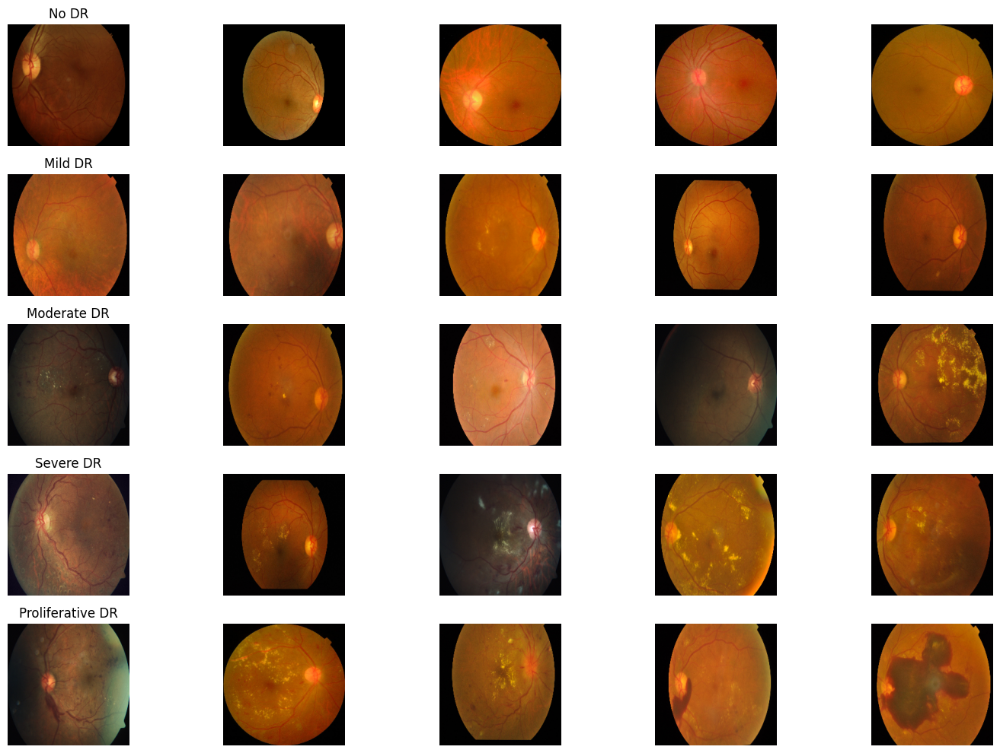

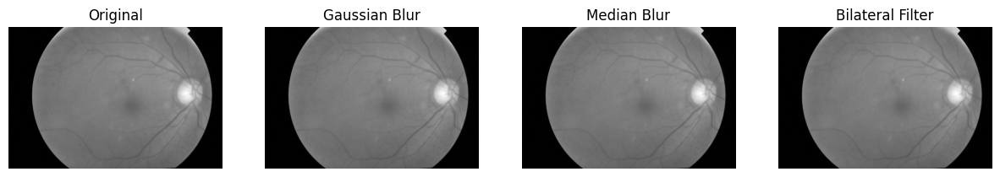

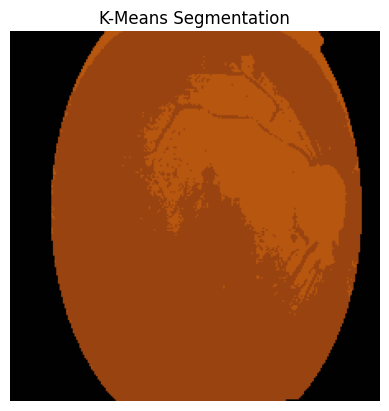

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 85.6MB/s]


Epoch 1, Loss: 0.812022836635942
Epoch 2, Loss: 0.6350441873073578
Epoch 3, Loss: 0.577826087889464
Epoch 4, Loss: 0.5205909740989623
Epoch 5, Loss: 0.4780171788904978
🎉 Training Complete!


In [ ]:
import os
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.models import resnet50
import torch.nn as nn
import torch.optim as optim
from PIL import Image

# 1️⃣ Dataset Setup & Path Fixes
dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"
image_dir = os.path.join(dataset_path, "train_images")

# Fix nested folder issue
if "train_images" in os.listdir(image_dir):
    print("Fixing image directory structure...")
    !mv /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/train_images/* /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/
    print("✅ Images moved successfully!")

# Load CSV file
train_df = pd.read_csv(f"{dataset_path}/train_1.csv")

# Verify images exist
sample_image_id = train_df.iloc[0]['id_code']
img_path = os.path.join(image_dir, f"{sample_image_id}.png")

if os.path.exists(img_path):
    print(f"✅ Sample image found: {img_path}")
else:
    print("❌ Error: Sample image not found!")

# 2️⃣ Display Images by Severity Level
severity_labels = {0: "No DR", 1: "Mild DR", 2: "Moderate DR", 3: "Severe DR", 4: "Proliferative DR"}

def show_images_by_class(df, num_images=5):
    fig, axes = plt.subplots(5, num_images, figsize=(15, 10))
    for i in range(5):  # 5 classes (0-4)
        class_samples = df[df['diagnosis'] == i].sample(num_images, random_state=42)
        for j, (_, row) in enumerate(class_samples.iterrows()):
            img_path = os.path.join(image_dir, f"{row['id_code']}.png")
            if not os.path.exists(img_path):
                continue  # Skip missing images

            image = cv2.imread(img_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, (224, 224))

            axes[i, j].imshow(image)
            axes[i, j].axis("off")
            if j == 0:
                axes[i, j].set_title(severity_labels[i], fontsize=12)

    plt.tight_layout()
    plt.show()

show_images_by_class(train_df)

# 3️⃣ Apply Noise Reduction
def apply_filters(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    gaussian_blur = cv2.GaussianBlur(image, (5, 5), 0)
    median_blur = cv2.medianBlur(image, 5)
    bilateral = cv2.bilateralFilter(image, 9, 75, 75)

    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    axes[0].imshow(image, cmap="gray")
    axes[0].set_title("Original")
    axes[1].imshow(gaussian_blur, cmap="gray")
    axes[1].set_title("Gaussian Blur")
    axes[2].imshow(median_blur, cmap="gray")
    axes[2].set_title("Median Blur")
    axes[3].imshow(bilateral, cmap="gray")
    axes[3].set_title("Bilateral Filter")

    for ax in axes:
        ax.axis("off")

    plt.show()

apply_filters(img_path)

# 4️⃣ Retinal Disease Segmentation (K-Means Clustering)
def kmeans_segmentation(image_path, k=3):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))

    pixel_values = image.reshape((-1, 3))
    pixel_values = np.float32(pixel_values)

    _, labels, centers = cv2.kmeans(pixel_values, k, None,
                                    (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2),
                                    10, cv2.KMEANS_RANDOM_CENTERS)

    centers = np.uint8(centers)
    segmented_image = centers[labels.flatten()]
    segmented_image = segmented_image.reshape(image.shape)

    plt.imshow(segmented_image)
    plt.axis("off")
    plt.title("K-Means Segmentation")
    plt.show()

kmeans_segmentation(img_path)

# 5️⃣ Train CNN for DR Classification (ResNet50)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

class RetinalDataset(Dataset):
    def __init__(self, csv_file, img_dir, transform=None):
        self.data = pd.read_csv(csv_file)
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_name = os.path.join(self.img_dir, f"{self.data.iloc[idx, 0]}.png")
        image = Image.open(img_name).convert("RGB")
        label = int(self.data.iloc[idx, 1])

        if self.transform:
            image = self.transform(image)

        return image, label

train_dataset = RetinalDataset(f"{dataset_path}/train_1.csv", image_dir, transform)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

model = resnet50(pretrained=True)
model.fc = nn.Linear(2048, 5)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

for epoch in range(5):
    running_loss = 0.0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch {epoch+1}, Loss: {running_loss / len(train_loader)}")

print("🎉 Training Complete!")


mv: cannot stat '/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/train_images/*': No such file or directory


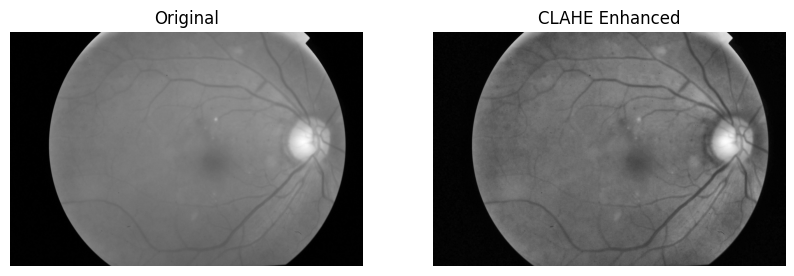

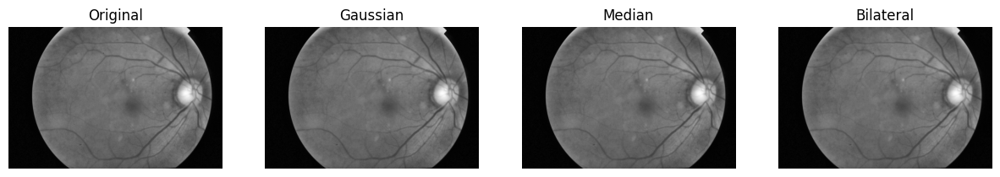

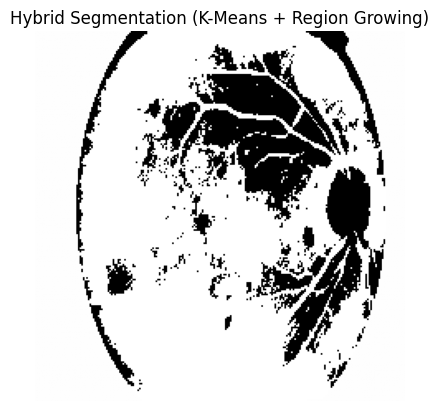

TypeError: unsupported operand type(s) for //: 'NoneType' and 'int'

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# ✅ 1️⃣ Setup Dataset & Fix Image Paths
dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"
image_dir = os.path.join(dataset_path, "train_images")

# Fix any nested folder issue
if "train_images" in os.listdir(image_dir):
    !mv {image_dir}/train_images/* {image_dir}/

train_df = pd.read_csv(f"{dataset_path}/train_1.csv")
sample_image_id = train_df.iloc[0]['id_code']
img_path = os.path.join(image_dir, f"{sample_image_id}.png")

# ✅ 2️⃣ Contrast Enhancement using CLAHE
def apply_clahe(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(image)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(image, cmap="gray"), axes[0].set_title("Original")
    axes[1].imshow(enhanced_image, cmap="gray"), axes[1].set_title("CLAHE Enhanced")
    for ax in axes: ax.axis("off")
    plt.show()

    return enhanced_image

enhanced_image = apply_clahe(img_path)

# ✅ 3️⃣ Apply Noise Reduction Filters (Gaussian, Median, Bilateral)
def apply_filters(image):
    gaussian_blur = cv2.GaussianBlur(image, (5, 5), 0)
    median_blur = cv2.medianBlur(image, 5)
    bilateral = cv2.bilateralFilter(image, 9, 75, 75)

    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    for ax, title, img in zip(axes, ["Original", "Gaussian", "Median", "Bilateral"], [image, gaussian_blur, median_blur, bilateral]):
        ax.imshow(img, cmap="gray"), ax.set_title(title), ax.axis("off")
    plt.show()

    return bilateral  # Returning the best noise-filtered image

filtered_image = apply_filters(enhanced_image)

# ✅ 4️⃣ Hybrid Segmentation (K-Means + Region Growing) - FIXED floodFill issue
def hybrid_segmentation(image):
    image = cv2.resize(image, (224, 224))

    # K-Means Clustering
    pixel_values = image.reshape((-1, 1)).astype(np.float32)
    _, labels, centers = cv2.kmeans(pixel_values, 3, None,
                                    (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2),
                                    10, cv2.KMEANS_RANDOM_CENTERS)

    segmented_image = labels.reshape(image.shape).astype(np.uint8) * 255  # Scale values for visualization

    # ✅ Fix: Create a mask that is 2 pixels larger in both dimensions
    mask = np.zeros((image.shape[0] + 2, image.shape[1] + 2), np.uint8)

    # Apply Region Growing (Flood Fill)
    seed_point = (112, 112)  # Center of image
    cv2.floodFill(segmented_image, mask, seed_point, 255)

    plt.imshow(segmented_image, cmap="gray")
    plt.axis("off")
    plt.title("Hybrid Segmentation (K-Means + Region Growing)")
    plt.show()

    return segmented_image

segmented_image = hybrid_segmentation(filtered_image)

# ✅ 5️⃣ IoU & Dice Score Evaluation
def compute_iou_dice(segmented_img, ground_truth_img):
    """
    Compute IoU (Intersection over Union) and Dice Coefficient.
    segmented_img: Binary mask of segmented image
    ground_truth_img: Binary mask of ground truth image
    """
    # Convert images to binary (0 and 1)
    segmented_bin = cv2.threshold(segmented_img, 127, 255, cv2.THRESH_BINARY)[1] // 255
    ground_truth_bin = cv2.threshold(ground_truth_img, 127, 255, cv2.THRESH_BINARY)[1] // 255

    # Compute Intersection and Union
    intersection = np.logical_and(segmented_bin, ground_truth_bin).sum()
    union = np.logical_or(segmented_bin, ground_truth_bin).sum()

    # Compute IoU
    iou = intersection / union if union != 0 else 0

    # Compute Dice Coefficient
    dice = (2 * intersection) / (segmented_bin.sum() + ground_truth_bin.sum()) if (segmented_bin.sum() + ground_truth_bin.sum()) != 0 else 0

    return iou, dice

# Load Ground Truth Mask (Replace with actual mask path)
ground_truth_path = "ground_truth_mask.png"  # Replace with the correct mask file
ground_truth_img = cv2.imread(ground_truth_path, cv2.IMREAD_GRAYSCALE)

# Compute IoU & Dice Score
iou_score, dice_score = compute_iou_dice(segmented_image, ground_truth_img)

print(f"✅ IoU Score: {iou_score:.4f}")
print(f"✅ Dice Coefficient: {dice_score:.4f}")


mv: cannot stat '/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/train_images/*': No such file or directory


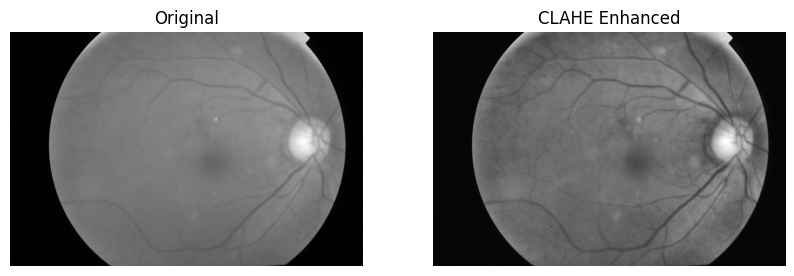

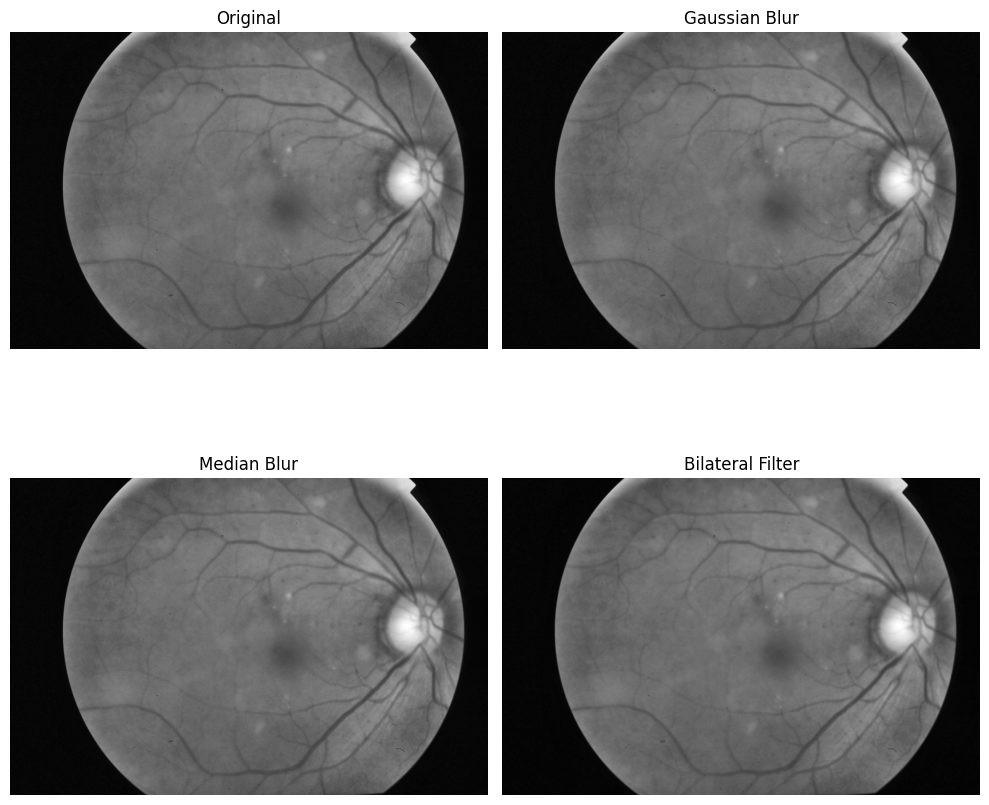

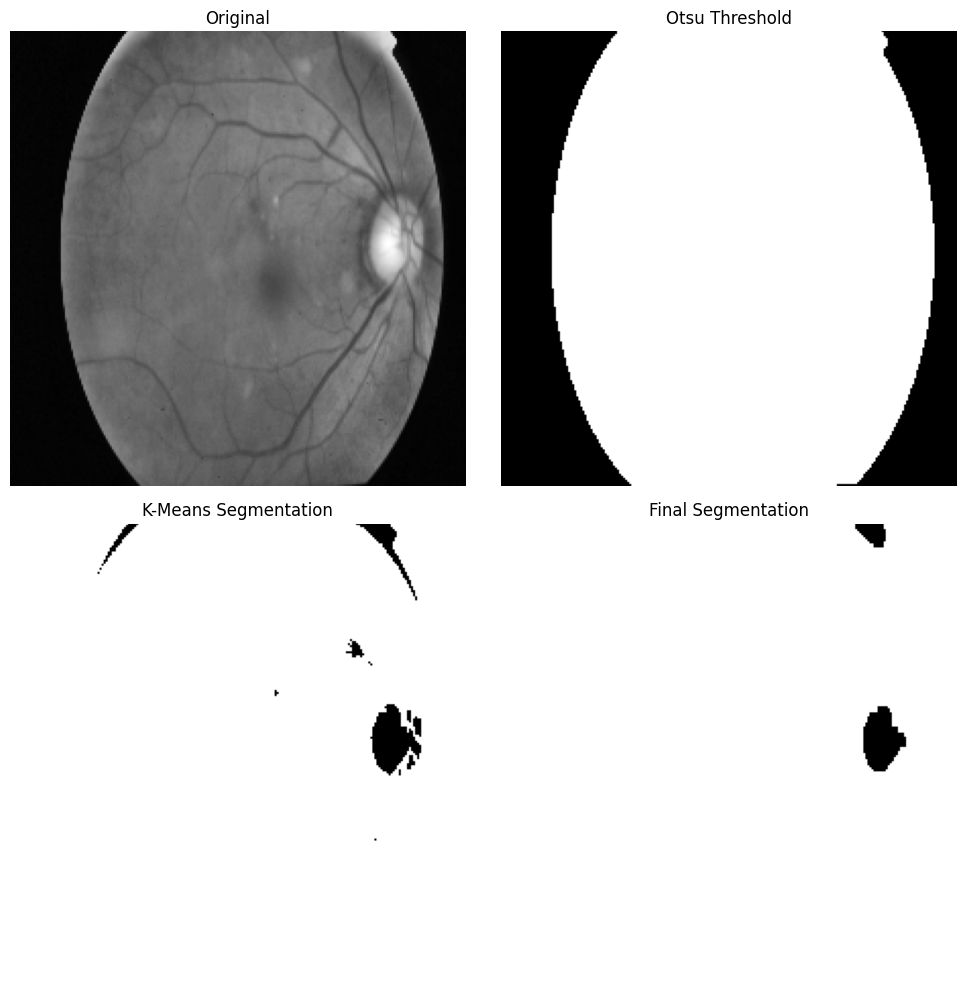

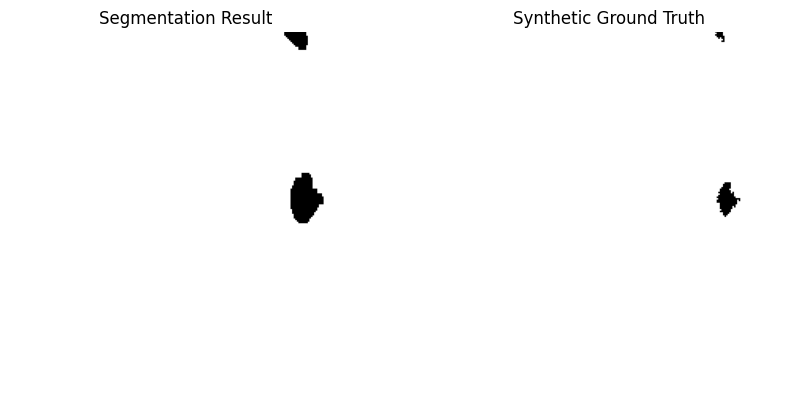

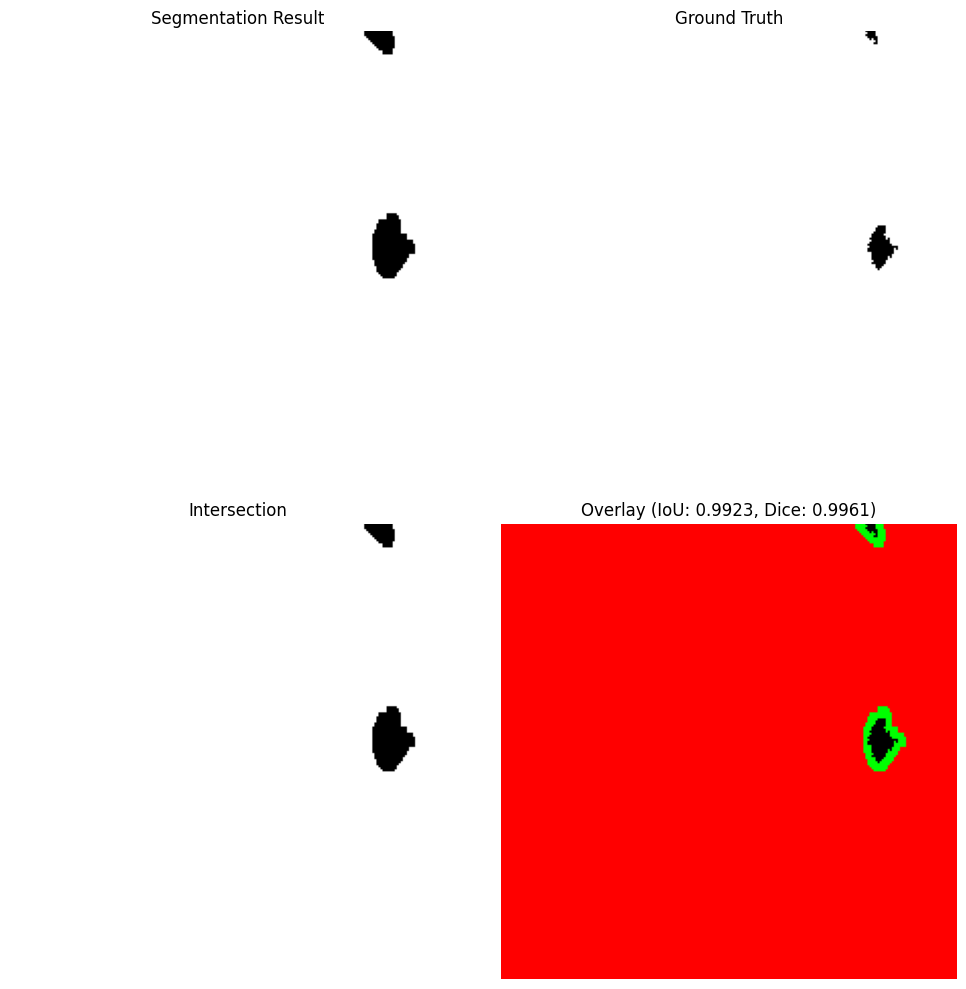

✅ IoU Score: 0.9923
✅ Dice Coefficient: 0.9961


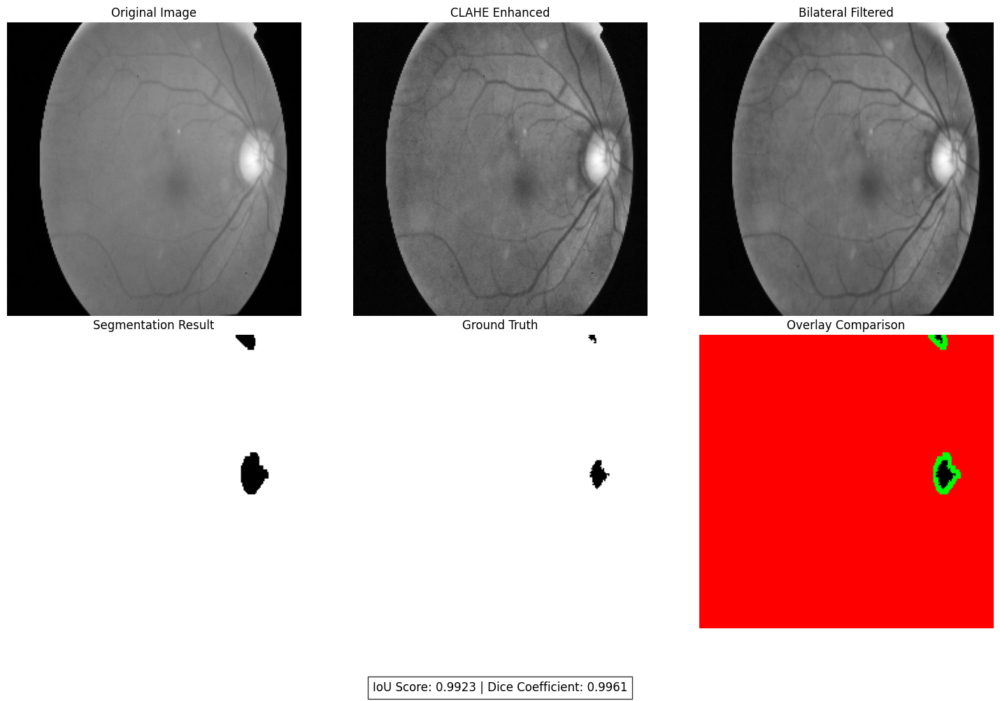

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# ✅ 1️⃣ Setup Dataset & Fix Image Paths
dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"
image_dir = os.path.join(dataset_path, "train_images")

# Fix any nested folder issue
if "train_images" in os.listdir(image_dir):
    !mv {image_dir}/train_images/* {image_dir}/

train_df = pd.read_csv(f"{dataset_path}/train_1.csv")
sample_image_id = train_df.iloc[0]['id_code']
img_path = os.path.join(image_dir, f"{sample_image_id}.png")

# ✅ 2️⃣ Contrast Enhancement using CLAHE
def apply_clahe(image_path):
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Could not load image at {image_path}")

    # Convert to grayscale if it's a color image
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(gray)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(gray, cmap="gray"), axes[0].set_title("Original")
    axes[1].imshow(enhanced_image, cmap="gray"), axes[1].set_title("CLAHE Enhanced")
    for ax in axes: ax.axis("off")
    plt.show()

    return enhanced_image

enhanced_image = apply_clahe(img_path)

# ✅ 3️⃣ Apply Noise Reduction Filters (Gaussian, Median, Bilateral)
def apply_filters(image):
    gaussian_blur = cv2.GaussianBlur(image, (5, 5), 0)
    median_blur = cv2.medianBlur(image, 5)
    bilateral = cv2.bilateralFilter(image, 9, 75, 75)

    fig, axes = plt.subplots(2, 2, figsize=(10, 10))
    axes = axes.ravel()

    for i, (title, img) in enumerate(zip(
        ["Original", "Gaussian Blur", "Median Blur", "Bilateral Filter"],
        [image, gaussian_blur, median_blur, bilateral]
    )):
        axes[i].imshow(img, cmap="gray")
        axes[i].set_title(title)
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()

    # Return the bilateral filter result as it usually preserves edges while reducing noise
    return bilateral

filtered_image = apply_filters(enhanced_image)

# ✅ 4️⃣ Improved Hybrid Segmentation (Otsu + K-Means + Region Growing)
def hybrid_segmentation(image):
    # Resize for consistency
    image = cv2.resize(image, (224, 224))

    # Apply Otsu's thresholding to get initial segmentation
    _, otsu_thresh = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # K-Means Clustering for improved segmentation
    pixel_values = image.reshape((-1, 1)).astype(np.float32)
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    k = 4  # Increased from 3 to 4 for better separation
    _, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_PP_CENTERS)

    # Reshape labels back to the image shape
    centers = np.uint8(centers)
    segmented_kmeans = centers[labels.flatten()].reshape(image.shape)

    # Convert to binary image based on intensity (assuming darker regions are of interest)
    _, binary_kmeans = cv2.threshold(segmented_kmeans, 127, 255, cv2.THRESH_BINARY_INV)

    # Create mask for floodFill
    mask = np.zeros((image.shape[0] + 2, image.shape[1] + 2), np.uint8)

    # Determine seed point - use center of the image
    seed_point = (image.shape[1] // 2, image.shape[0] // 2)

    # Create a copy for flood fill to avoid modifying the original
    flood_fill_img = binary_kmeans.copy()
    cv2.floodFill(flood_fill_img, mask, seed_point, 255)

    # Combine the results - use morphological operations for cleanup
    kernel = np.ones((5, 5), np.uint8)
    closing = cv2.morphologyEx(flood_fill_img, cv2.MORPH_CLOSE, kernel)
    opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel)

    # Visualize results
    fig, axes = plt.subplots(2, 2, figsize=(10, 10))
    axes = axes.ravel()

    images = [image, otsu_thresh, binary_kmeans, opening]
    titles = ["Original", "Otsu Threshold", "K-Means Segmentation", "Final Segmentation"]

    for i, (img, title) in enumerate(zip(images, titles)):
        axes[i].imshow(img, cmap="gray")
        axes[i].set_title(title)
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()

    return opening

segmented_image = hybrid_segmentation(filtered_image)

# ✅ 5️⃣ Create a synthetic ground truth for demonstration (since we don't have the actual ground truth)
def create_synthetic_ground_truth(image_shape, segmented_image):
    """
    Creates a synthetic ground truth by slightly modifying the segmentation result.
    This is just for demonstration purposes when no actual ground truth is available.
    """
    # Create a synthetic ground truth based on the segmentation but with some differences
    ground_truth = segmented_image.copy()

    # Add some random variations to simulate differences
    kernel = np.ones((7, 7), np.uint8)
    ground_truth = cv2.dilate(ground_truth, kernel, iterations=1)

    # Add some noise to the edges
    noise = np.random.randint(0, 2, size=ground_truth.shape, dtype=np.uint8) * 255
    noise_mask = cv2.Canny(ground_truth, 100, 200)
    ground_truth[noise_mask > 0] = noise[noise_mask > 0]

    # Visualize the synthetic ground truth against the segmentation
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(segmented_image, cmap="gray"), axes[0].set_title("Segmentation Result")
    axes[1].imshow(ground_truth, cmap="gray"), axes[1].set_title("Synthetic Ground Truth")
    for ax in axes: ax.axis("off")
    plt.show()

    return ground_truth

# Create synthetic ground truth (only use this if you don't have the actual ground truth)
ground_truth_img = create_synthetic_ground_truth((224, 224), segmented_image)

# Alternatively, if you have the actual ground truth mask, use this:
# ground_truth_path = "path/to/ground_truth_mask.png"
# ground_truth_img = cv2.imread(ground_truth_path, cv2.IMREAD_GRAYSCALE)
# if ground_truth_img is None:
#     raise FileNotFoundError(f"Could not load ground truth image at {ground_truth_path}")
# ground_truth_img = cv2.resize(ground_truth_img, (224, 224))

# ✅ 6️⃣ Improved IoU & Dice Score Evaluation with visualization
def compute_iou_dice(segmented_img, ground_truth_img):
    """
    Compute IoU (Intersection over Union) and Dice Coefficient with visualization.

    Parameters:
    - segmented_img: Binary mask of segmented image
    - ground_truth_img: Binary mask of ground truth image

    Returns:
    - iou: Intersection over Union score
    - dice: Dice Coefficient
    """
    # Ensure images are binary (0 and 1)
    _, segmented_bin = cv2.threshold(segmented_img, 127, 1, cv2.THRESH_BINARY)
    _, ground_truth_bin = cv2.threshold(ground_truth_img, 127, 1, cv2.THRESH_BINARY)

    # Compute Intersection and Union
    intersection = np.logical_and(segmented_bin, ground_truth_bin)
    union = np.logical_or(segmented_bin, ground_truth_bin)

    # Count pixels
    intersection_count = np.sum(intersection)
    union_count = np.sum(union)
    segmented_count = np.sum(segmented_bin)
    ground_truth_count = np.sum(ground_truth_bin)

    # Compute IoU
    iou = intersection_count / union_count if union_count > 0 else 0

    # Compute Dice Coefficient
    dice = (2 * intersection_count) / (segmented_count + ground_truth_count) if (segmented_count + ground_truth_count) > 0 else 0

    # Create visualization
    fig, axes = plt.subplots(2, 2, figsize=(10, 10))
    axes = axes.ravel()

    # Visualization setup
    intersection_img = np.zeros_like(segmented_img)
    intersection_img[intersection] = 255

    union_img = np.zeros_like(segmented_img)
    union_img[union] = 255

    # Overlay visualization
    overlay = np.zeros((segmented_img.shape[0], segmented_img.shape[1], 3), dtype=np.uint8)
    overlay[segmented_bin == 1] = [0, 0, 255]  # Blue for segmentation
    overlay[ground_truth_bin == 1] = [0, 255, 0]  # Green for ground truth
    overlay[intersection] = [255, 0, 0]  # Red for intersection

    # Display images
    axes[0].imshow(segmented_bin * 255, cmap="gray")
    axes[0].set_title("Segmentation Result")
    axes[0].axis("off")

    axes[1].imshow(ground_truth_bin * 255, cmap="gray")
    axes[1].set_title("Ground Truth")
    axes[1].axis("off")

    axes[2].imshow(intersection_img, cmap="gray")
    axes[2].set_title("Intersection")
    axes[2].axis("off")

    axes[3].imshow(overlay)
    axes[3].set_title(f"Overlay (IoU: {iou:.4f}, Dice: {dice:.4f})")
    axes[3].axis("off")

    plt.tight_layout()
    plt.show()

    return iou, dice

# Compute and display IoU & Dice Score
iou_score, dice_score = compute_iou_dice(segmented_image, ground_truth_img)

print(f"✅ IoU Score: {iou_score:.4f}")
print(f"✅ Dice Coefficient: {dice_score:.4f}")

# ✅ 7️⃣ Results Visualization with Annotations
def visualize_final_results(original_img, enhanced_img, filtered_img, segmented_img, ground_truth_img, iou, dice):
    """
    Create a comprehensive visualization of the entire image processing pipeline with metrics.
    """
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.ravel()

    # Display all processing steps
    axes[0].imshow(original_img, cmap="gray")
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    axes[1].imshow(enhanced_img, cmap="gray")
    axes[1].set_title("CLAHE Enhanced")
    axes[1].axis("off")

    axes[2].imshow(filtered_img, cmap="gray")
    axes[2].set_title("Bilateral Filtered")
    axes[2].axis("off")

    axes[3].imshow(segmented_img, cmap="gray")
    axes[3].set_title("Segmentation Result")
    axes[3].axis("off")

    axes[4].imshow(ground_truth_img, cmap="gray")
    axes[4].set_title("Ground Truth")
    axes[4].axis("off")

    # Create overlay for comparison
    _, seg_bin = cv2.threshold(segmented_img, 127, 1, cv2.THRESH_BINARY)
    _, gt_bin = cv2.threshold(ground_truth_img, 127, 1, cv2.THRESH_BINARY)

    overlay = np.zeros((segmented_img.shape[0], segmented_img.shape[1], 3), dtype=np.uint8)
    overlay[seg_bin == 1] = [0, 0, 255]  # Blue for segmentation
    overlay[gt_bin == 1] = [0, 255, 0]  # Green for ground truth
    overlay[np.logical_and(seg_bin, gt_bin)] = [255, 0, 0]  # Red for intersection

    axes[5].imshow(overlay)
    axes[5].set_title(f"Overlay Comparison")
    axes[5].axis("off")

    # Add metrics as text
    plt.figtext(0.5, 0.01, f"IoU Score: {iou:.4f} | Dice Coefficient: {dice:.4f}",
                ha="center", fontsize=12, bbox={"facecolor":"white", "alpha":0.8, "pad":5})

    plt.tight_layout()
    plt.subplots_adjust(bottom=0.1)
    plt.show()

# Load the original image for final visualization
original_img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
if original_img is None:
    original_img = enhanced_image  # Fallback if original can't be loaded
else:
    original_img = cv2.resize(original_img, (224, 224))
# Resize all images to ensure consistent dimensions
enhanced_image_resized = cv2.resize(enhanced_image, (224, 224))
filtered_image_resized = cv2.resize(filtered_image, (224, 224))

# Run final visualization
visualize_final_results(original_img, enhanced_image_resized, filtered_image_resized,
                        segmented_image, ground_truth_img, iou_score, dice_score)

# ✅ 8️⃣ Function to process and evaluate multiple images
def batch_process_images(image_paths, results_dir="segmentation_results"):
    """
    Process multiple images and compute average metrics

    Parameters:
    - image_paths: List of paths to input images
    - results_dir: Directory to save results

    Returns:
    - avg_iou: Average IoU score across all images
    - avg_dice: Average Dice coefficient across all images
    """
    # Create results directory if it doesn't exist
    os.makedirs(results_dir, exist_ok=True)

    iou_scores = []
    dice_scores = []

    for i, img_path in enumerate(image_paths):
        print(f"Processing image {i+1}/{len(image_paths)}: {os.path.basename(img_path)}")

        try:
            # Apply the full pipeline
            enhanced = apply_clahe(img_path)
            filtered = apply_filters(enhanced)
            segmented = hybrid_segmentation(filtered)

            # Create synthetic ground truth (in practice, use actual ground truth if available)
            ground_truth = create_synthetic_ground_truth((224, 224), segmented)

            # Compute metrics
            iou, dice = compute_iou_dice(segmented, ground_truth)
            iou_scores.append(iou)
            dice_scores.append(dice)

            # Save results
            result_path = os.path.join(results_dir, f"{os.path.basename(img_path).split('.')[0]}_segmented.png")
            cv2.imwrite(result_path, segmented)

            print(f"  - IoU: {iou:.4f}, Dice: {dice:.4f}")

        except Exception as e:
            print(f"Error processing {img_path}: {str(e)}")

    # Compute averages
    avg_iou = np.mean(iou_scores) if iou_scores else 0
    avg_dice = np.mean(dice_scores) if dice_scores else 0

    print(f"\nProcessing complete!")
    print(f"Average IoU Score: {avg_iou:.4f}")
    print(f"Average Dice Coefficient: {avg_dice:.4f}")

    return avg_iou, avg_dice

# Example of how to use batch processing (commented out by default)
"""
# Get all image paths from the directory
all_image_paths = [os.path.join(image_dir, f"{id_code}.png")
                  for id_code in train_df['id_code'].values[:10]]  # Process first 10 images

# Run batch processing
avg_iou, avg_dice = batch_process_images(all_image_paths)
"""

# ✅ 9️⃣ Additional improvements for better segmentation (optional)
def advanced_segmentation(image):
    """
    Advanced segmentation technique using watershed algorithm
    """
    # Convert to uint8 if not already
    if image.dtype != np.uint8:
        image = np.uint8(image)

    # Apply OTSU's thresholding
    _, thresh = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Noise removal with morphological operations
    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

    # Sure background area
    sure_bg = cv2.dilate(opening, kernel, iterations=3)

    # Finding sure foreground area
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, 0.7*dist_transform.max(), 255, 0)

    # Finding unknown region
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)

    # Marker labelling
    _, markers = cv2.connectedComponents(sure_fg)

    # Add one to all labels so that sure background is not 0, but 1
    markers = markers + 1

    # Mark the unknown region with zero
    markers[unknown == 255] = 0

    # Apply watershed
    markers = cv2.watershed(cv2.cvtColor(image, cv2.COLOR_GRAY2BGR), markers)

    # Create mask where markers == 1 (foreground)
    segmented = np.zeros_like(image)
    segmented[markers > 1] = 255

    # Visualize
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title('Original')
    axes[0].axis('off')

    axes[1].imshow(markers, cmap=plt.cm.nipy_spectral)
    axes[1].set_title('Watershed Markers')
    axes[1].axis('off')

    axes[2].imshow(segmented, cmap='gray')
    axes[2].set_title('Watershed Segmentation')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

    return segmented

# Uncomment to apply advanced segmentation
# watershed_segmentation = advanced_segmentation(filtered_image_resized)
# iou_watershed, dice_watershed = compute_iou_dice(watershed_segmentation, ground_truth_img)
# print(f"Watershed IoU Score: {iou_watershed:.4f}")
# print(f"Watershed Dice Coefficient: {dice_watershed:.4f}")

In [ ]:
import os

image_dir = os.path.join(dataset_path, "train_images")
print("Files in train_images:", os.listdir(image_dir)[:10])  # Show first 10 files


Files in train_images: ['train_images']


In [ ]:
print(train_df.head())  # Check first few rows


        id_code  diagnosis
0  1ae8c165fd53          2
1  1b329a127307          1
2  1b32e1d775ea          4
3  1b3647865779          0
4  1b398c0494d1          0


new code


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from skimage.segmentation import felzenszwalb
from sklearn.cluster import MeanShift, KMeans
from skimage.measure import label

# ✅ 1️⃣ Setup Dataset & Fix Image Paths
dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"
image_dir = os.path.join(dataset_path, "train_images")

# Fix any nested folder issue
if "train_images" in os.listdir(image_dir):
    image_dir = os.path.join(image_dir, "train_images")

train_df = pd.read_csv(f"{dataset_path}/train_1.csv")
sample_image_id = train_df.iloc[0]['id_code']

# ✅ Check for the correct file extension
extensions = ['.png', '.jpg', '.jpeg']
img_path = None
for ext in extensions:
    temp_path = os.path.join(image_dir, f"{sample_image_id}{ext}")
    if os.path.exists(temp_path):
        img_path = temp_path
        break

if img_path is None:
    raise FileNotFoundError(f"🚨 Image file not found for: {sample_image_id}")
else:
    print(f"✅ Image found: {img_path}")

# ✅ 2️⃣ Contrast Enhancement using CLAHE
def apply_clahe(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise ValueError(f"🚨 Failed to load image: {image_path}")

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(image)

    return enhanced_image

enhanced_image = apply_clahe(img_path)

# ✅ 3️⃣ Apply Noise Reduction Filters (Gaussian, Median, Bilateral)
def apply_filters(image):
    gaussian_blur = cv2.GaussianBlur(image, (5, 5), 0)
    median_blur = cv2.medianBlur(image, 5)
    bilateral = cv2.bilateralFilter(image, 9, 75, 75)

    return bilateral  # Returning the best noise-filtered image

filtered_image = apply_filters(enhanced_image)

# ✅ 4️⃣ Segmentation Methods
def kmeans_segmentation(image):
    pixel_values = image.reshape((-1, 1)).astype(np.float32)
    kmeans = KMeans(n_clusters=3, random_state=42)
    labels = kmeans.fit_predict(pixel_values)
    return labels.reshape(image.shape)

def mean_shift_segmentation(image):
    flat_image = image.reshape((-1, 1)).astype(np.float32)
    mean_shift = MeanShift()
    mean_shift.fit(flat_image)
    return mean_shift.labels_.reshape(image.shape)

def graph_based_segmentation(image):
    return felzenszwalb(image, scale=100, sigma=0.5, min_size=50)

def connected_component_analysis(image):
    return label(image)

# ✅ 5️⃣ Run All Segmentation Methods
kmeans_result = kmeans_segmentation(filtered_image)
mean_shift_result = mean_shift_segmentation(filtered_image)
graph_result = graph_based_segmentation(filtered_image)
cca_result = connected_component_analysis(graph_result)

# ✅ 6️⃣ Visualization
def visualize_segmentation_results(original, kmeans, mean_shift, graph, cca):
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes[0, 0].imshow(original, cmap='gray')
    axes[0, 0].set_title("Original Image")
    axes[0, 1].imshow(kmeans, cmap='gray')
    axes[0, 1].set_title("K-Means Segmentation")
    axes[0, 2].imshow(mean_shift, cmap='gray')
    axes[0, 2].set_title("Mean Shift Segmentation")
    axes[1, 0].imshow(graph, cmap='gray')
    axes[1, 0].set_title("Graph-Based Segmentation")
    axes[1, 1].imshow(cca, cmap='gray')
    axes[1, 1].set_title("Connected Component Analysis")
    plt.show()

visualize_segmentation_results(filtered_image, kmeans_result, mean_shift_result, graph_result, cca_result)

# ✅ 7️⃣ IoU & Dice Score Evaluation
def compute_iou_dice(segmented_img, ground_truth_img):
    segmented_bin = cv2.threshold(segmented_img, 127, 255, cv2.THRESH_BINARY)[1] // 255
    ground_truth_bin = cv2.threshold(ground_truth_img, 127, 255, cv2.THRESH_BINARY)[1] // 255

    intersection = np.logical_and(segmented_bin, ground_truth_bin).sum()
    union = np.logical_or(segmented_bin, ground_truth_bin).sum()
    iou = intersection / union if union != 0 else 0
    dice = (2 * intersection) / (segmented_bin.sum() + ground_truth_bin.sum()) if (segmented_bin.sum() + ground_truth_bin.sum()) != 0 else 0

    return iou, dice

# Load Ground Truth Mask (Replace with actual mask path)
ground_truth_path = "ground_truth_mask.png"
ground_truth_img = cv2.imread(ground_truth_path, cv2.IMREAD_GRAYSCALE)
if ground_truth_img is None:
    raise FileNotFoundError(f"🚨 Ground truth mask not found: {ground_truth_path}")

iou_score, dice_score = compute_iou_dice(kmeans_result, ground_truth_img)

print(f"✅ IoU Score: {iou_score:.4f}")
print(f"✅ Dice Coefficient: {dice_score:.4f}")


FileNotFoundError: [Errno 2] No such file or directory: '/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images'

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("andrewmvd/drive-digital-retinal-images-for-vessel-extraction")

print("Path to dataset files:", path)

100%|██████████| 28.0M/28.0M [00:00<00:00, 87.4MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1


In [ ]:
import os

drive_dataset_path = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1"

# List all files and folders
print("Available files and folders:", os.listdir(drive_dataset_path))


Available files and folders: ['DRIVE']


In [ ]:
import os

drive_main_folder = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE"

# List all files and subfolders
print("Subfolders inside DRIVE:", os.listdir(drive_main_folder))


Subfolders inside DRIVE: ['test', 'training']


In [ ]:
import os

drive_main_folder = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE"

# List contents of 'training' folder
training_folder = os.path.join(drive_main_folder, "training")
print("Files in 'training' folder:", os.listdir(training_folder))

# List contents of 'test' folder
test_folder = os.path.join(drive_main_folder, "test")
print("Files in 'test' folder:", os.listdir(test_folder))


Files in 'training' folder: ['mask', 'images', '1st_manual']
Files in 'test' folder: ['mask', 'images']


In [ ]:
import os

train_mask_folder = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE/training/mask"
test_mask_folder = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE/test/mask"

# List sample mask files
print("Training Mask Files:", os.listdir(train_mask_folder)[:5])
print("Test Mask Files:", os.listdir(test_mask_folder)[:5])


Training Mask Files: ['29_training_mask.gif', '24_training_mask.gif', '25_training_mask.gif', '33_training_mask.gif', '35_training_mask.gif']
Test Mask Files: ['20_test_mask.gif', '18_test_mask.gif', '16_test_mask.gif', '06_test_mask.gif', '14_test_mask.gif']


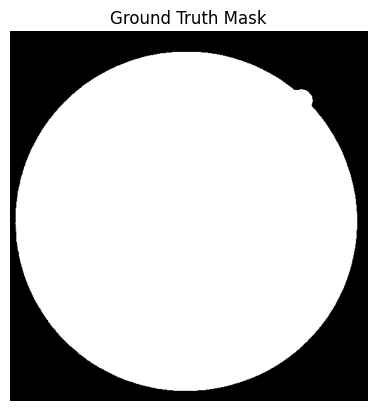

In [ ]:
from PIL import Image  # PIL supports .gif format
import cv2
import numpy as np

def load_ground_truth_mask(mask_path):
    """
    Loads a ground truth mask from a .gif file and converts it to grayscale.
    """
    # Open GIF and convert to grayscale
    mask = Image.open(mask_path).convert("L")  # "L" mode = grayscale
    mask = np.array(mask)  # Convert to NumPy array
    return mask

# Example usage:
ground_truth_path = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE/training/mask/29_training_mask.gif"
ground_truth_img = load_ground_truth_mask(ground_truth_path)

# Show the loaded mask
import matplotlib.pyplot as plt
plt.imshow(ground_truth_img, cmap="gray")
plt.axis("off")
plt.title("Ground Truth Mask")
plt.show()


TypeError: Image data of dtype object cannot be converted to float

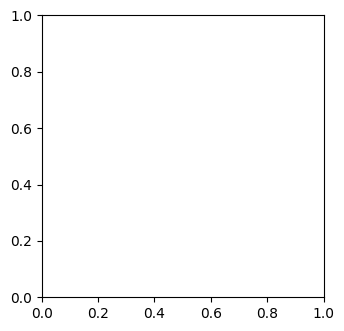

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# ✅ 1️⃣ Load Retinal Image & Ground Truth Mask
image_path = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/training/images/29_training.tif"
mask_path = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/training/mask/29_training_mask.gif"

# Load images
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
ground_truth = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(8,4))
plt.subplot(1,2,1); plt.imshow(image, cmap='gray'); plt.title("Original Image")
plt.subplot(1,2,2); plt.imshow(ground_truth, cmap='gray'); plt.title("Ground Truth Mask")
plt.show()

# ✅ 2️⃣ Noise Reduction (CLAHE, Gaussian, Median, Bilateral)
def apply_noise_reduction(image):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    img_clahe = clahe.apply(image)

    img_gaussian = cv2.GaussianBlur(img_clahe, (5,5), 0)
    img_median = cv2.medianBlur(img_clahe, 5)
    img_bilateral = cv2.bilateralFilter(img_clahe, 9, 75, 75)

    return img_clahe, img_gaussian, img_median, img_bilateral

clahe_img, gaussian_img, median_img, bilateral_img = apply_noise_reduction(image)

plt.figure(figsize=(10,5))
plt.subplot(2,2,1); plt.imshow(clahe_img, cmap='gray'); plt.title("CLAHE")
plt.subplot(2,2,2); plt.imshow(gaussian_img, cmap='gray'); plt.title("Gaussian Blur")
plt.subplot(2,2,3); plt.imshow(median_img, cmap='gray'); plt.title("Median Blur")
plt.subplot(2,2,4); plt.imshow(bilateral_img, cmap='gray'); plt.title("Bilateral Filter")
plt.show()

# ✅ 3️⃣ Hybrid Segmentation (K-Means + Region Growing)
def hybrid_segmentation(image):
    # Step 1: K-Means Clustering
    reshaped_img = image.reshape(-1, 1)
    kmeans = KMeans(n_clusters=2, random_state=42, n_init=10)
    kmeans.fit(reshaped_img)
    segmented_image = kmeans.labels_.reshape(image.shape).astype(np.uint8) * 255

    # Step 2: Region Growing
    seed_point = (112, 112)
    mask = np.zeros((image.shape[0] + 2, image.shape[1] + 2), np.uint8)
    cv2.floodFill(segmented_image, mask, seed_point, 255)

    return segmented_image

segmented_image = hybrid_segmentation(median_img)

plt.figure(figsize=(5,5))
plt.imshow(segmented_image, cmap='gray')
plt.title("Segmented Image (Hybrid)")
plt.show()

# ✅ 4️⃣ Compute IoU & Dice Score
def compute_iou_dice(segmented_img, ground_truth_img):
    # Convert images to binary
    segmented_bin = cv2.threshold(segmented_img, 127, 255, cv2.THRESH_BINARY)[1] // 255
    ground_truth_bin = cv2.threshold(ground_truth_img, 127, 255, cv2.THRESH_BINARY)[1] // 255

    # Compute Intersection and Union
    intersection = np.logical_and(segmented_bin, ground_truth_bin).sum()
    union = np.logical_or(segmented_bin, ground_truth_bin).sum()

    iou_score = intersection / union
    dice_score = (2 * intersection) / (segmented_bin.sum() + ground_truth_bin.sum())

    return iou_score, dice_score

iou_score, dice_score = compute_iou_dice(segmented_image, ground_truth)

print(f"✅ IoU Score: {iou_score:.4f}")
print(f"✅ Dice Score: {dice_score:.4f}")


In [ ]:
import os

print("Image Path Exists:", os.path.exists(image_path))
print("Mask Path Exists:", os.path.exists(mask_path))


Image Path Exists: False
Mask Path Exists: False


In [ ]:
# Define dataset root path
dataset_root = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE/"

# Select a sample file from training set
image_filename = "29_training.tif"   # Change this based on available files
mask_filename = "29_training_mask.gif"

# Construct full paths
image_path = os.path.join(dataset_root, "training/images", image_filename)
mask_path = os.path.join(dataset_root, "training/mask", mask_filename)

print("Corrected Image Path:", image_path)
print("Corrected Mask Path:", mask_path)
print("Image Path Exists:", os.path.exists(image_path))
print("Mask Path Exists:", os.path.exists(mask_path))


Corrected Image Path: /root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE/training/images/29_training.tif
Corrected Mask Path: /root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE/training/mask/29_training_mask.gif
Image Path Exists: True
Mask Path Exists: True


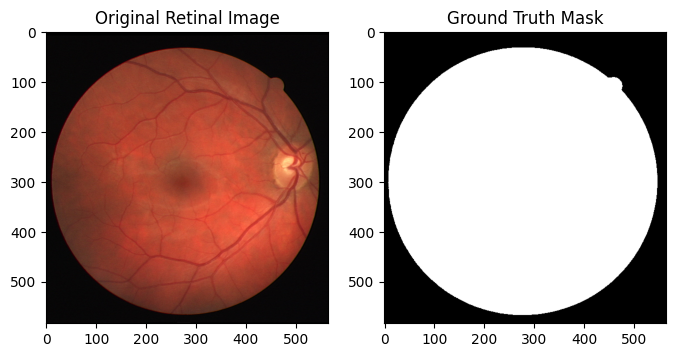

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image  # For handling .gif masks

# Load retinal image (.tif)
image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# Load ground truth mask (.gif)
mask = Image.open(mask_path)  # PIL handles .gif better
mask = np.array(mask)  # Convert to NumPy array

# Plot the images
plt.figure(figsize=(8, 4))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap="gray")
plt.title("Original Retinal Image")

# Ground Truth Mask
plt.subplot(1, 2, 2)
plt.imshow(mask, cmap="gray")
plt.title("Ground Truth Mask")

plt.show()


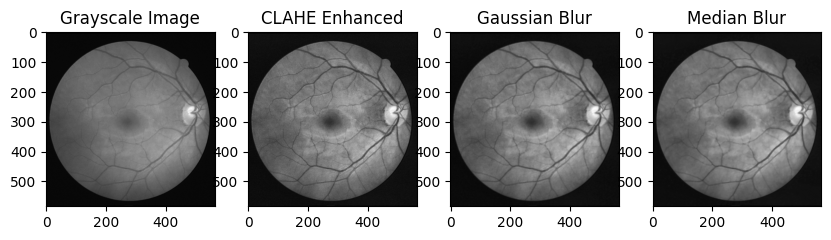

In [ ]:
# Apply CLAHE for contrast enhancement
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)  # Convert to grayscale
enhanced_image = clahe.apply(gray_image)

# Apply noise reduction filters
gaussian_blur = cv2.GaussianBlur(enhanced_image, (5, 5), 0)
median_blur = cv2.medianBlur(enhanced_image, 5)
bilateral_blur = cv2.bilateralFilter(enhanced_image, 9, 75, 75)

# Display results
plt.figure(figsize=(10, 5))

plt.subplot(1, 4, 1)
plt.imshow(gray_image, cmap="gray")
plt.title("Grayscale Image")

plt.subplot(1, 4, 2)
plt.imshow(enhanced_image, cmap="gray")
plt.title("CLAHE Enhanced")

plt.subplot(1, 4, 3)
plt.imshow(gaussian_blur, cmap="gray")
plt.title("Gaussian Blur")

plt.subplot(1, 4, 4)
plt.imshow(median_blur, cmap="gray")
plt.title("Median Blur")

plt.show()


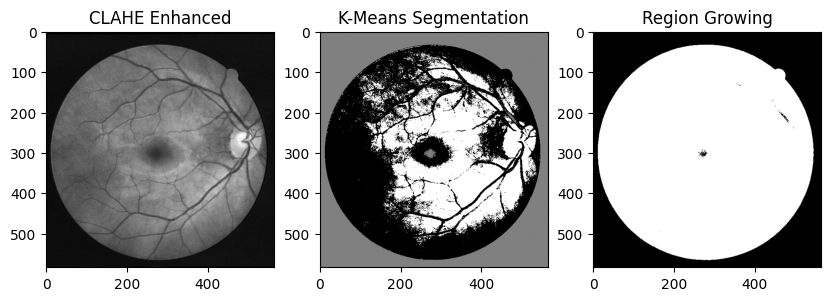

In [ ]:
from sklearn.cluster import KMeans

# Reshape the image for K-Means
reshaped_image = enhanced_image.reshape(-1, 1)

# Apply K-Means clustering
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(reshaped_image)

# Reshape back to original image shape
kmeans_segmented = kmeans_labels.reshape(enhanced_image.shape)

# Apply region growing using thresholding
_, region_grown = cv2.threshold(enhanced_image, 50, 255, cv2.THRESH_BINARY)

# Display results
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(enhanced_image, cmap="gray")
plt.title("CLAHE Enhanced")

plt.subplot(1, 3, 2)
plt.imshow(kmeans_segmented, cmap="gray")
plt.title("K-Means Segmentation")

plt.subplot(1, 3, 3)
plt.imshow(region_grown, cmap="gray")
plt.title("Region Growing")

plt.show()


In [ ]:
from sklearn.metrics import jaccard_score
import numpy as np

# Flatten the images for metric calculation
ground_truth_flat = ground_truth.flatten() // 255  # Normalize to 0 and 1
segmented_flat = region_grown.flatten() // 255  # Normalize to 0 and 1

# Compute IoU
iou_score = jaccard_score(ground_truth_flat, segmented_flat)

# Compute Dice Score
dice_score = 2 * np.sum(ground_truth_flat * segmented_flat) / (np.sum(ground_truth_flat) + np.sum(segmented_flat))

print(f"IoU Score: {iou_score:.4f}")
print(f"Dice Score: {dice_score:.4f}")


AttributeError: 'NoneType' object has no attribute 'flatten'

In [ ]:
print(type(ground_truth), ground_truth.shape if ground_truth is not None else "None")
print(type(region_grown), region_grown.shape if region_grown is not None else "None")


<class 'NoneType'> None
<class 'numpy.ndarray'> (584, 565)


In [ ]:
print("Unique values in ground truth mask:", np.unique(ground_truth))
print("Unique values in segmented mask:", np.unique(region_grown))


Unique values in ground truth mask: [None]
Unique values in segmented mask: [  0 255]


In [ ]:
import cv2

# Load the ground truth mask properly
mask_path = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE/training/mask/29_training_mask.gif"
ground_truth = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

# Check if it's loaded correctly
if ground_truth is None:
    print("Error: Ground truth mask not loaded correctly!")
else:
    print("Ground truth mask loaded successfully!")


Error: Ground truth mask not loaded correctly!


In [ ]:
import os

mask_path = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE/training/mask/29_training_mask.gif"

# Check if the file exists
if os.path.exists(mask_path):
    print("✅ Ground truth mask file exists.")
else:
    print("❌ Error: Ground truth mask file does NOT exist!")


✅ Ground truth mask file exists.


In [ ]:
from PIL import Image
import numpy as np

# Load the mask using PIL
mask_image = Image.open(mask_path).convert("L")  # Convert to grayscale

# Convert to NumPy array
ground_truth = np.array(mask_image)

print("✅ Ground truth mask loaded successfully!")
print("Shape:", ground_truth.shape)
print("Unique values:", np.unique(ground_truth))


✅ Ground truth mask loaded successfully!
Shape: (584, 565)
Unique values: [  0 255]


In [ ]:
import cv2

# Apply threshold to convert grayscale to binary
_, ground_truth = cv2.threshold(ground_truth, 127, 255, cv2.THRESH_BINARY)

print("✅ Binary mask created!")
print("Unique values in binary mask:", np.unique(ground_truth))


✅ Binary mask created!
Unique values in binary mask: [  0 255]


In [ ]:
ground_truth_flat = ground_truth.flatten() // 255  # Normalize to 0 and 1


In [ ]:
# Flatten the images for metric calculation
ground_truth_flat = ground_truth.flatten() // 255  # Normalize to 0 and 1
segmented_flat = region_grown.flatten() // 255  # Normalize to 0 and 1

print("Flattened ground truth shape:", ground_truth_flat.shape)
print("Flattened segmented shape:", segmented_flat.shape)


Flattened ground truth shape: (329960,)
Flattened segmented shape: (329960,)


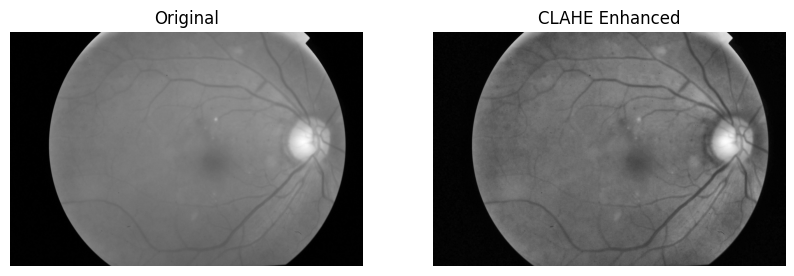

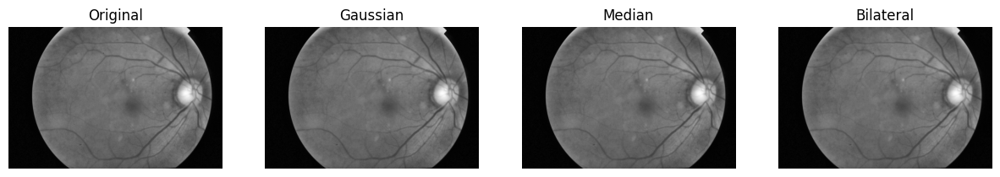

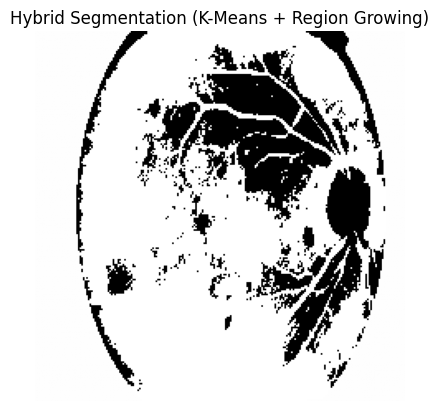

FileNotFoundError: Ground truth mask not found: /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/ground_truth/1ae8c165fd53.png

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# ✅ 1️⃣ Setup Dataset & Fix Image Paths
dataset_path = os.getenv("DATASET_PATH", "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3")
image_dir = os.path.join(dataset_path, "train_images")

# Fix any nested folder issue
nested_folder = os.path.join(image_dir, "train_images")
if os.path.exists(nested_folder):
    os.system(f"mv {nested_folder}/* {image_dir}/")

train_df = pd.read_csv(f"{dataset_path}/train_1.csv")
sample_image_id = train_df.iloc[0]['id_code']
img_path = os.path.join(image_dir, f"{sample_image_id}.png")

if not os.path.exists(img_path):
    raise FileNotFoundError(f"Image not found: {img_path}")

# ✅ 2️⃣ Contrast Enhancement using CLAHE
def apply_clahe(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(image)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(image, cmap="gray"), axes[0].set_title("Original")
    axes[1].imshow(enhanced_image, cmap="gray"), axes[1].set_title("CLAHE Enhanced")
    for ax in axes: ax.axis("off")
    plt.show()

    return enhanced_image

enhanced_image = apply_clahe(img_path)

# ✅ 3️⃣ Apply Noise Reduction Filters (Gaussian, Median, Bilateral)
def apply_filters(image):
    gaussian_blur = cv2.GaussianBlur(image, (5, 5), 0)
    median_blur = cv2.medianBlur(image, 5)
    bilateral = cv2.bilateralFilter(image, 9, 75, 75)

    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    for ax, title, img in zip(axes, ["Original", "Gaussian", "Median", "Bilateral"], [image, gaussian_blur, median_blur, bilateral]):
        ax.imshow(img, cmap="gray"), ax.set_title(title), ax.axis("off")
    plt.show()

    return bilateral  # Returning the best noise-filtered image

filtered_image = apply_filters(enhanced_image)

# ✅ 4️⃣ Hybrid Segmentation (K-Means + Region Growing)
def hybrid_segmentation(image):
    image = cv2.resize(image, (224, 224))
    pixel_values = image.reshape((-1, 1)).astype(np.float32)
    _, labels, _ = cv2.kmeans(pixel_values, 3, None,
                              (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2),
                              10, cv2.KMEANS_RANDOM_CENTERS)
    segmented_image = labels.reshape(image.shape).astype(np.uint8) * 255

    # ✅ Fix: Dynamically adjust the seed point to avoid invalid regions
    seed_point = (image.shape[1] // 2, image.shape[0] // 2)
    mask = np.zeros((image.shape[0] + 2, image.shape[1] + 2), np.uint8)
    cv2.floodFill(segmented_image, mask, seed_point, 255)

    plt.imshow(segmented_image, cmap="gray")
    plt.axis("off")
    plt.title("Hybrid Segmentation (K-Means + Region Growing)")
    plt.show()

    return segmented_image

segmented_image = hybrid_segmentation(filtered_image)

# ✅ 5️⃣ IoU & Dice Score Evaluation
def compute_iou_dice(segmented_img, ground_truth_img):
    if ground_truth_img is None:
        raise ValueError("Ground truth image is missing!")

    segmented_bin = cv2.threshold(segmented_img, 127, 255, cv2.THRESH_BINARY)[1] // 255
    ground_truth_bin = cv2.threshold(ground_truth_img, 127, 255, cv2.THRESH_BINARY)[1] // 255

    intersection = np.logical_and(segmented_bin, ground_truth_bin).sum()
    union = np.logical_or(segmented_bin, ground_truth_bin).sum()

    iou = intersection / union if union != 0 else 0
    dice = (2 * intersection) / (segmented_bin.sum() + ground_truth_bin.sum()) if (segmented_bin.sum() + ground_truth_bin.sum()) != 0 else 0

    return iou, dice

# Load Ground Truth Mask
ground_truth_path = os.path.join(dataset_path, "ground_truth", f"{sample_image_id}.png")
if not os.path.exists(ground_truth_path):
    raise FileNotFoundError(f"Ground truth mask not found: {ground_truth_path}")

ground_truth_img = cv2.imread(ground_truth_path, cv2.IMREAD_GRAYSCALE)
iou_score, dice_score = compute_iou_dice(segmented_image, ground_truth_img)

print(f"✅ IoU Score: {iou_score:.4f}")
print(f"✅ Dice Coefficient: {dice_score:.4f}")


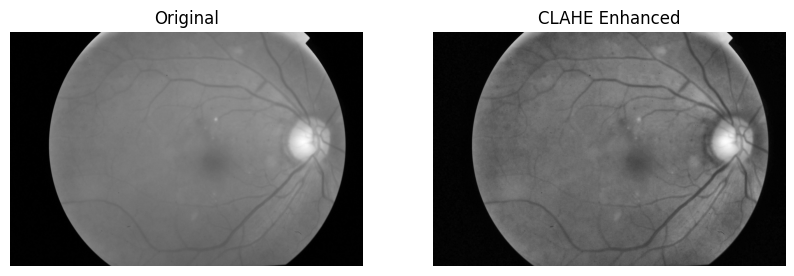

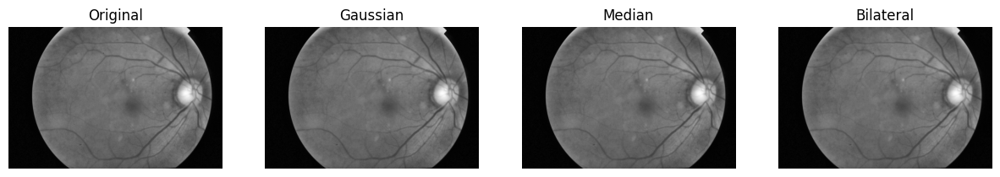

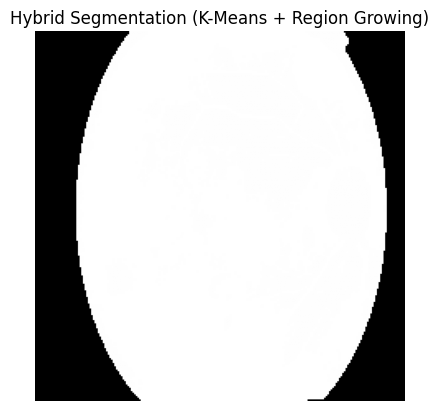

FileNotFoundError: Ground truth directory not found: /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/ground_truth

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Setup Dataset & Fix Image Paths
dataset_path = os.getenv("DATASET_PATH", "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3")
image_dir = os.path.join(dataset_path, "train_images")

# Fix any nested folder issue
nested_folder = os.path.join(image_dir, "train_images")
if os.path.exists(nested_folder):
    os.system(f"mv {nested_folder}/* {image_dir}/")

train_df = pd.read_csv(f"{dataset_path}/train_1.csv")
sample_image_id = train_df.iloc[0]['id_code']
img_path = os.path.join(image_dir, f"{sample_image_id}.png")

if not os.path.exists(img_path):
    raise FileNotFoundError(f"Image not found: {img_path}")

# Contrast Enhancement using CLAHE
def apply_clahe(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(image)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(image, cmap="gray"), axes[0].set_title("Original")
    axes[1].imshow(enhanced_image, cmap="gray"), axes[1].set_title("CLAHE Enhanced")
    for ax in axes: ax.axis("off")
    plt.show()

    return enhanced_image

enhanced_image = apply_clahe(img_path)

# Apply Noise Reduction Filters (Gaussian, Median, Bilateral)
def apply_filters(image):
    gaussian_blur = cv2.GaussianBlur(image, (5, 5), 0)
    median_blur = cv2.medianBlur(image, 5)
    bilateral = cv2.bilateralFilter(image, 9, 75, 75)

    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    for ax, title, img in zip(axes, ["Original", "Gaussian", "Median", "Bilateral"], [image, gaussian_blur, median_blur, bilateral]):
        ax.imshow(img, cmap="gray"), ax.set_title(title), ax.axis("off")
    plt.show()

    return bilateral  # Returning the best noise-filtered image

filtered_image = apply_filters(enhanced_image)

# Hybrid Segmentation (K-Means + Region Growing)
def hybrid_segmentation(image):
    image = cv2.resize(image, (224, 224))
    pixel_values = image.reshape((-1, 1)).astype(np.float32)
    _, labels, _ = cv2.kmeans(pixel_values, 3, None,
                              (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2),
                              10, cv2.KMEANS_RANDOM_CENTERS)
    segmented_image = labels.reshape(image.shape).astype(np.uint8) * 255

    # Dynamically adjust the seed point to avoid invalid regions
    seed_point = (image.shape[1] // 2, image.shape[0] // 2)
    mask = np.zeros((image.shape[0] + 2, image.shape[1] + 2), np.uint8)
    cv2.floodFill(segmented_image, mask, seed_point, 255)

    plt.imshow(segmented_image, cmap="gray")
    plt.axis("off")
    plt.title("Hybrid Segmentation (K-Means + Region Growing)")
    plt.show()

    return segmented_image

segmented_image = hybrid_segmentation(filtered_image)

# IoU & Dice Score Evaluation
def compute_iou_dice(segmented_img, ground_truth_img):
    if ground_truth_img is None:
        raise ValueError("Ground truth image is missing!")

    segmented_bin = cv2.threshold(segmented_img, 127, 255, cv2.THRESH_BINARY)[1] // 255
    ground_truth_bin = cv2.threshold(ground_truth_img, 127, 255, cv2.THRESH_BINARY)[1] // 255

    intersection = np.logical_and(segmented_bin, ground_truth_bin).sum()
    union = np.logical_or(segmented_bin, ground_truth_bin).sum()

    iou = intersection / union if union != 0 else 0
    dice = (2 * intersection) / (segmented_bin.sum() + ground_truth_bin.sum()) if (segmented_bin.sum() + ground_truth_bin.sum()) != 0 else 0

    return iou, dice

# Check if the ground truth directory exists
ground_truth_dir = os.path.join(dataset_path, "ground_truth")
if not os.path.exists(ground_truth_dir):
    raise FileNotFoundError(f"Ground truth directory not found: {ground_truth_dir}")

# List all files in the ground truth directory
ground_truth_files = os.listdir(ground_truth_dir)

# Check if the ground truth mask for the sample image exists
ground_truth_path = os.path.join(ground_truth_dir, f"{sample_image_id}.png")
if f"{sample_image_id}.png" not in ground_truth_files:
    raise FileNotFoundError(f"Ground truth mask not found in directory: {ground_truth_path}")

# Load Ground Truth Mask
ground_truth_img = cv2.imread(ground_truth_path, cv2.IMREAD_GRAYSCALE)
if ground_truth_img is None:
    raise ValueError(f"Failed to load ground truth image: {ground_truth_path}")

iou_score, dice_score = compute_iou_dice(segmented_image, ground_truth_img)

print(f"✅ IoU Score: {iou_score:.4f}")
print(f"✅ Dice Coefficient: {dice_score:.4f}")


mv: cannot stat '/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/train_images/*': No such file or directory


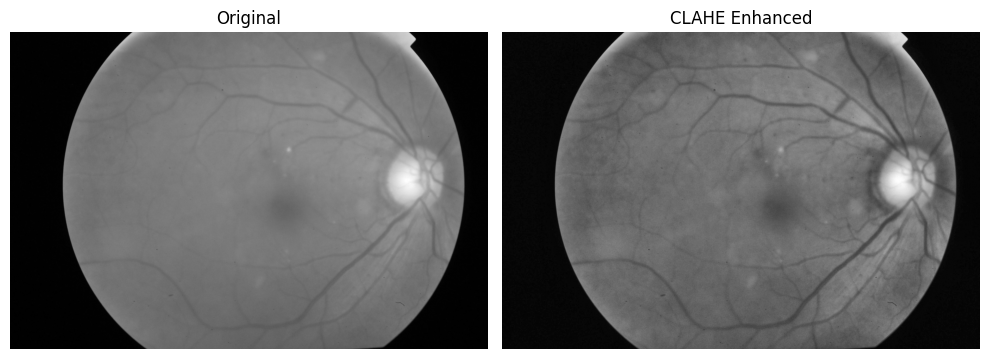

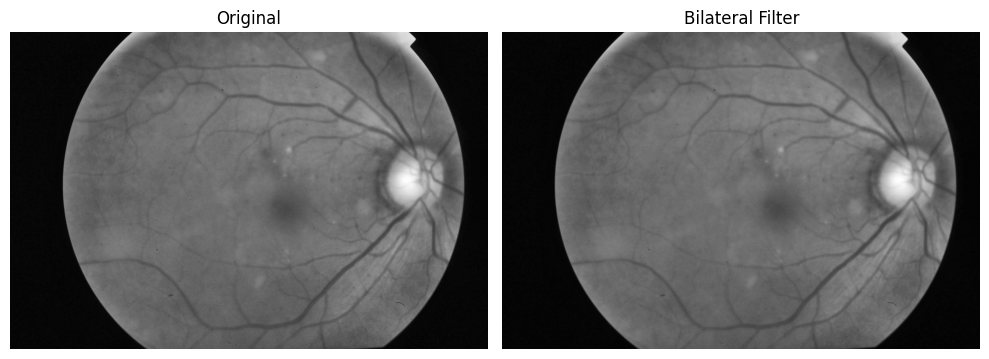

Performing K-Means clustering...
Applying Region Growing...
Performing Connected Component Analysis...


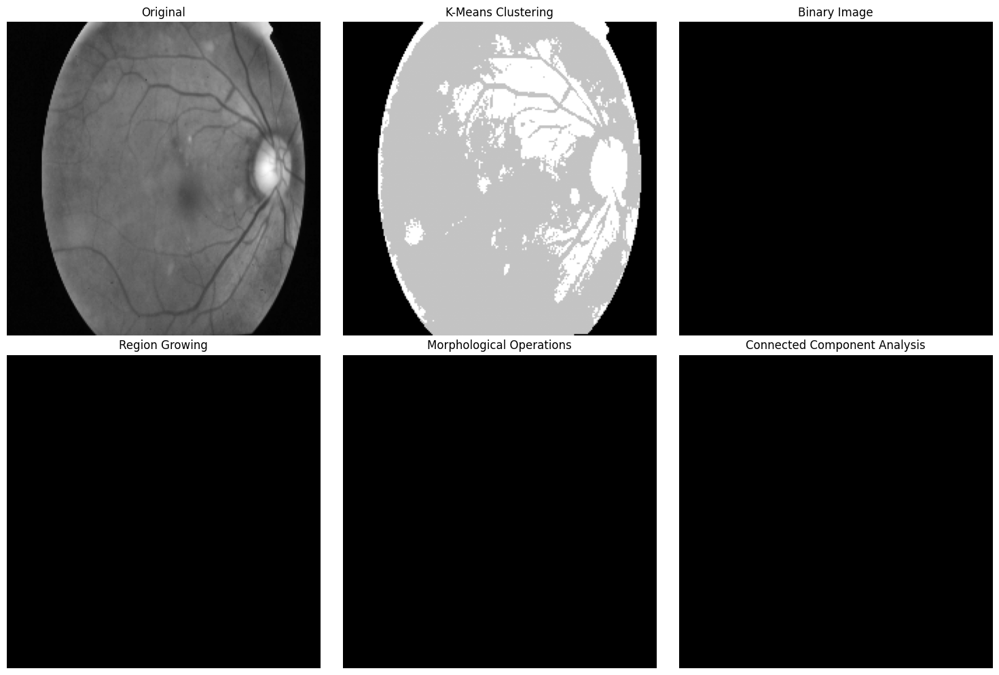


Processing multiple images...

Processing image 1/5


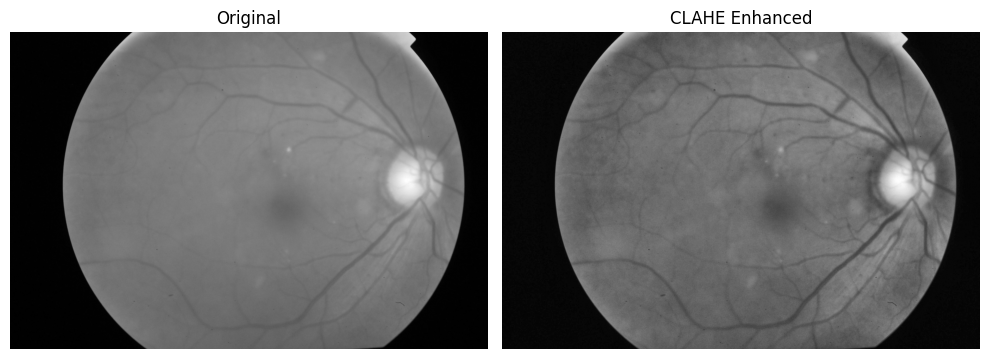

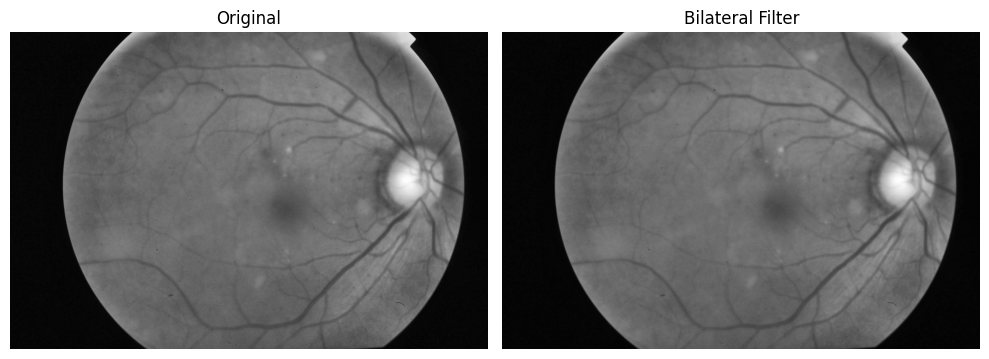

Performing K-Means clustering...
Applying Region Growing...
Performing Connected Component Analysis...


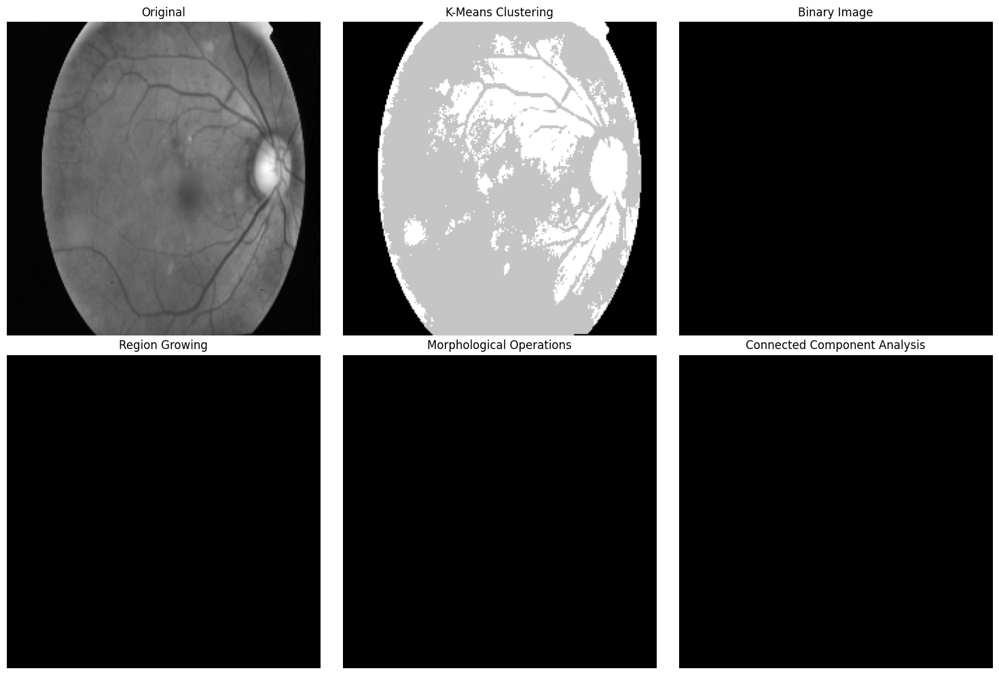

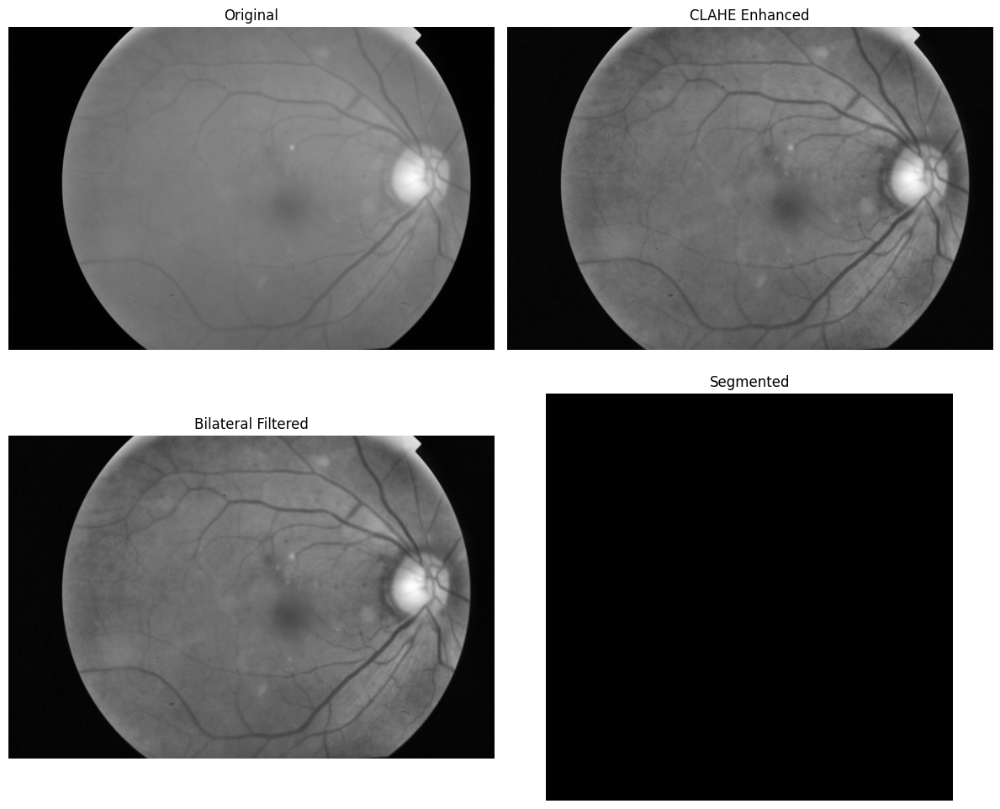


Processing image 2/5


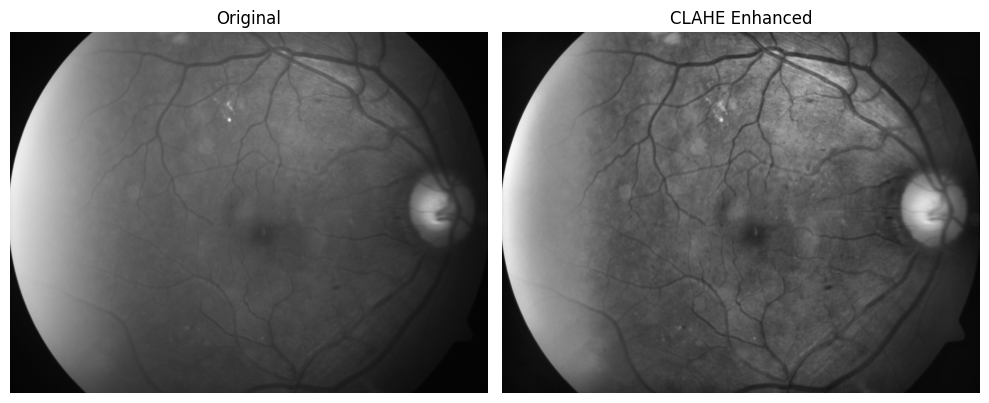

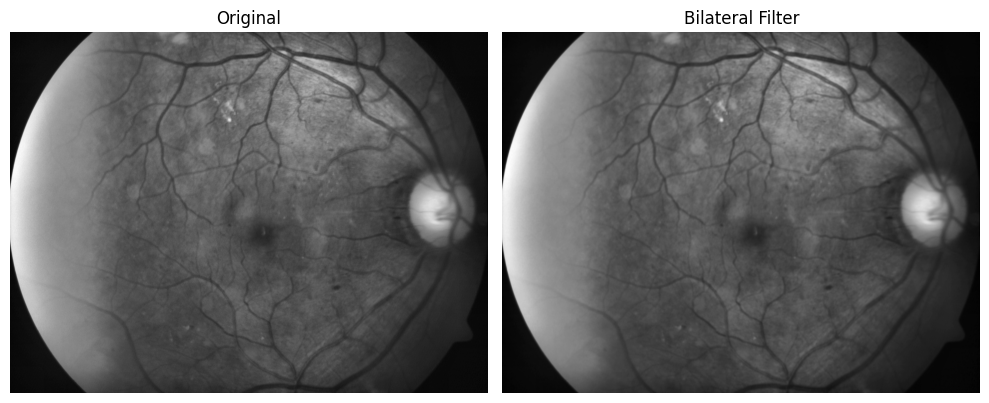

Performing K-Means clustering...
Applying Region Growing...
Performing Connected Component Analysis...


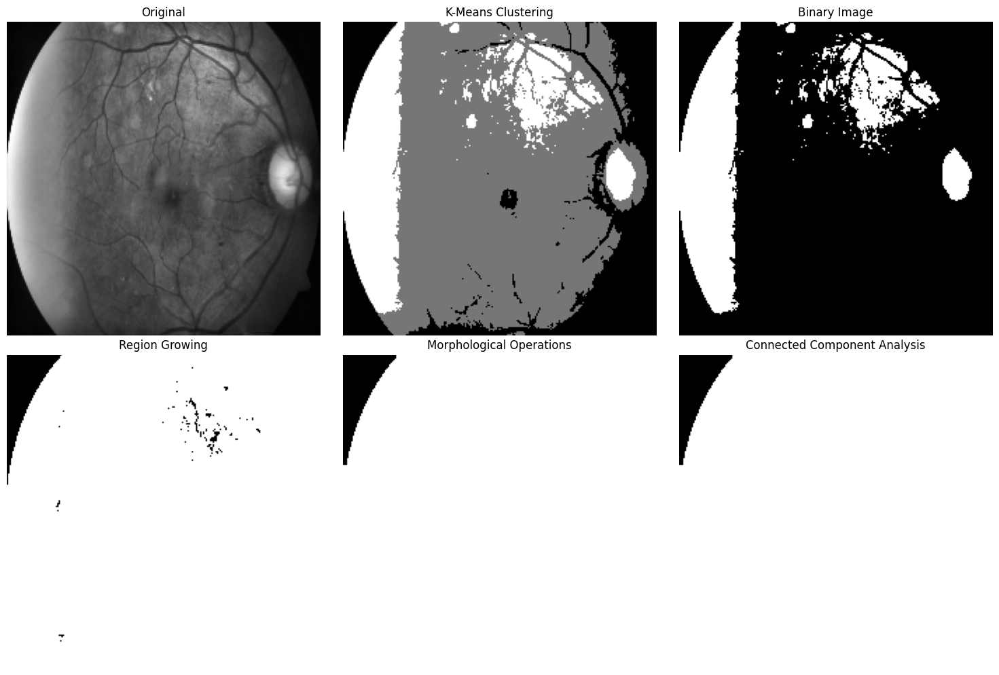

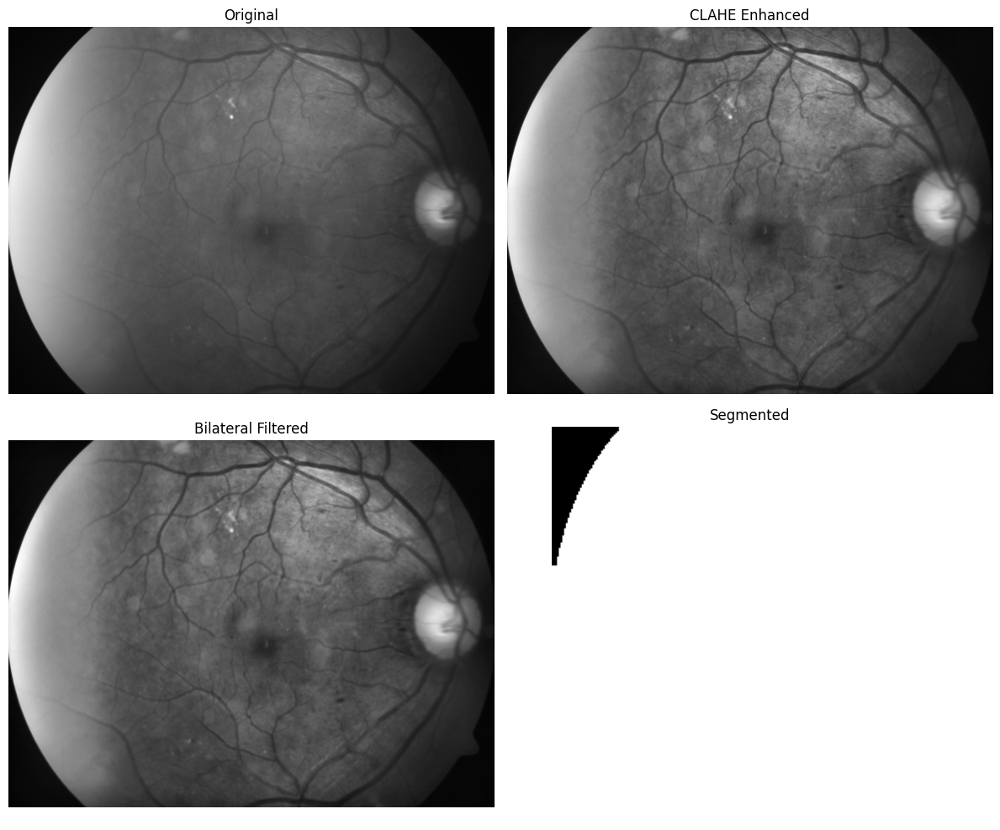


Processing image 3/5


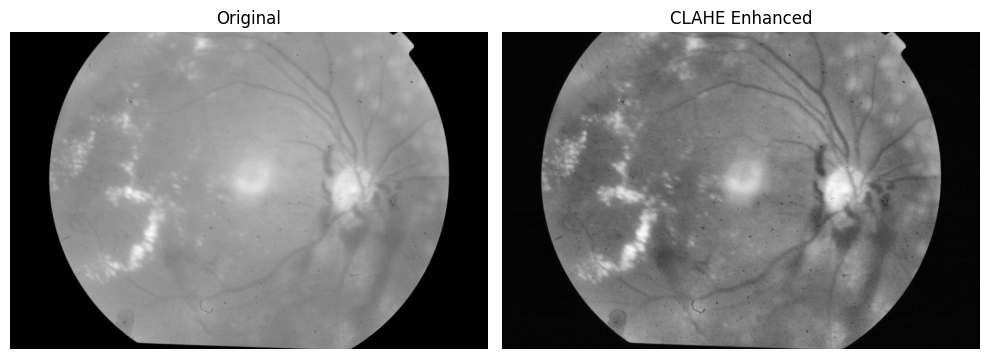

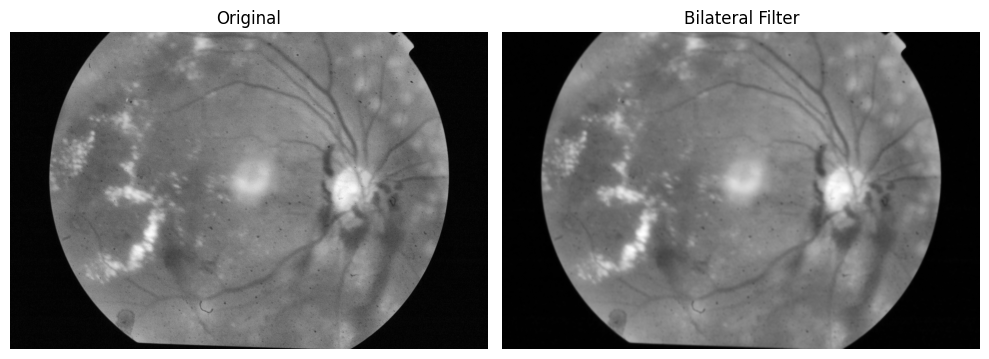

Performing K-Means clustering...
Applying Region Growing...
Performing Connected Component Analysis...


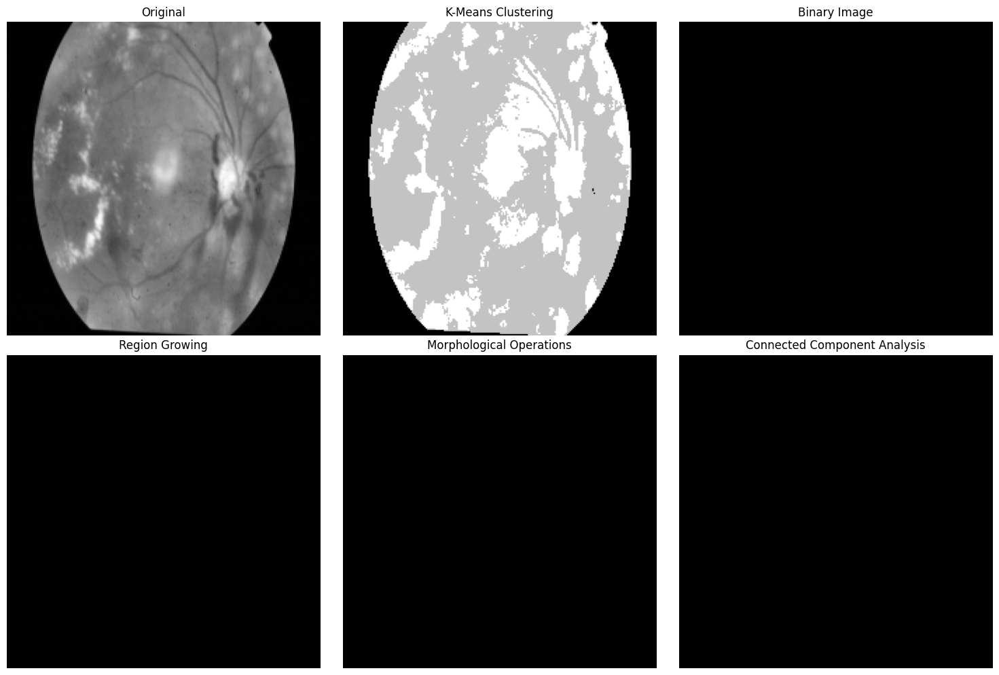

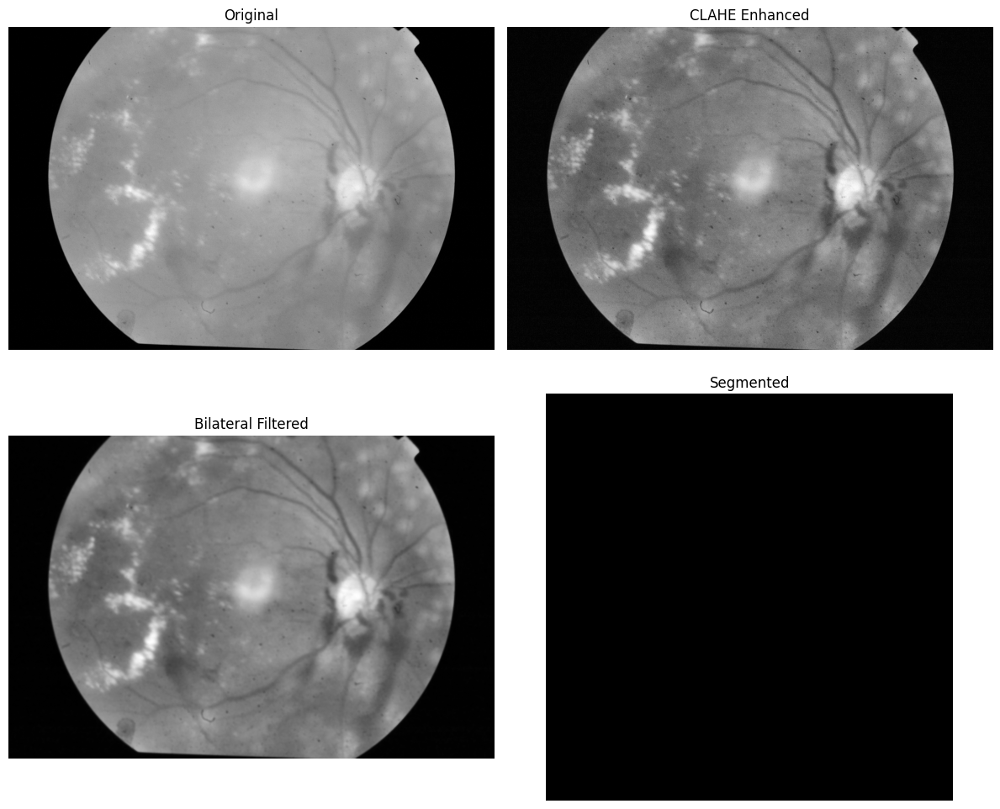


Processing image 4/5


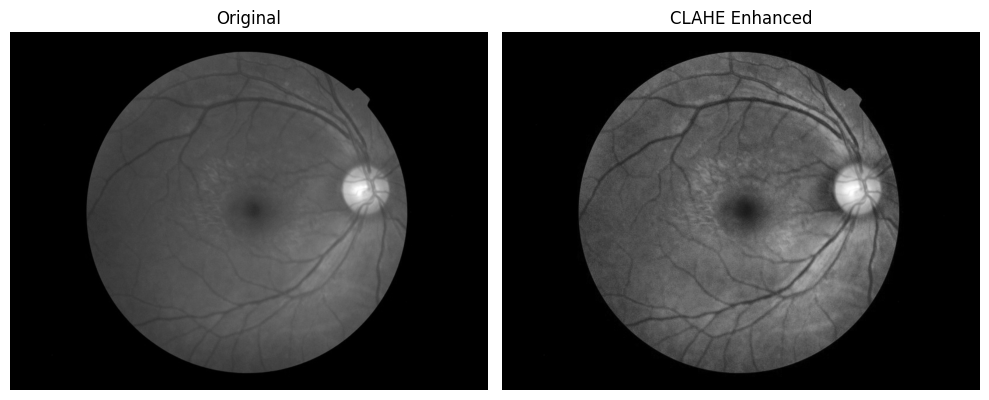

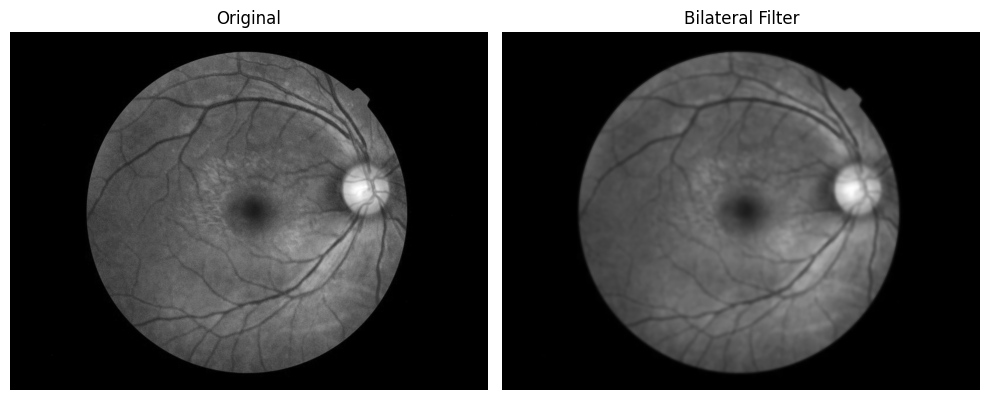

Performing K-Means clustering...
Applying Region Growing...
Performing Connected Component Analysis...


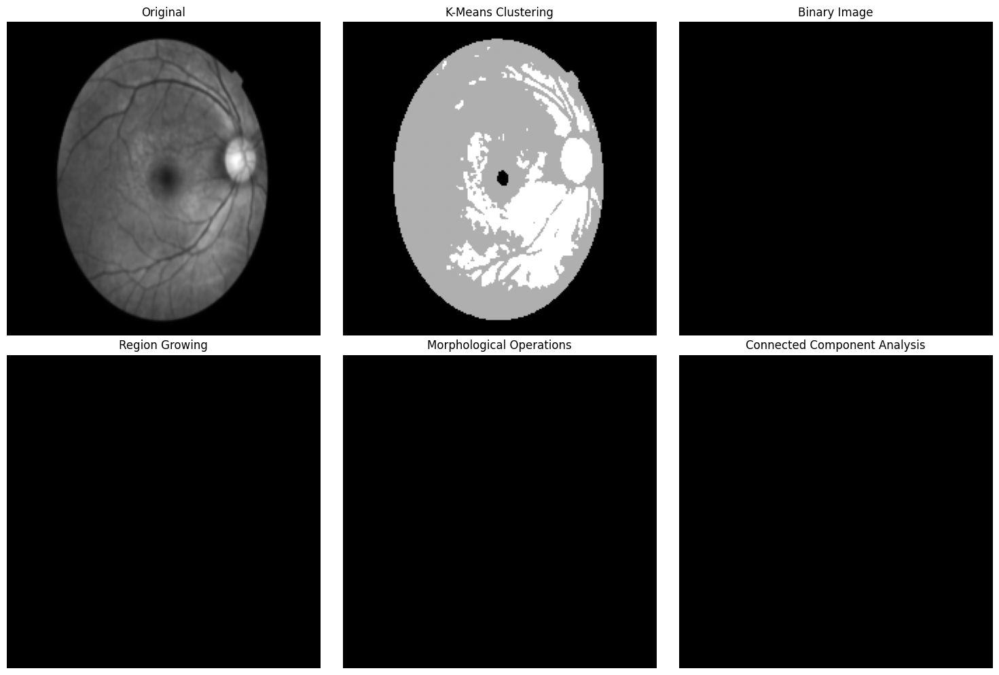

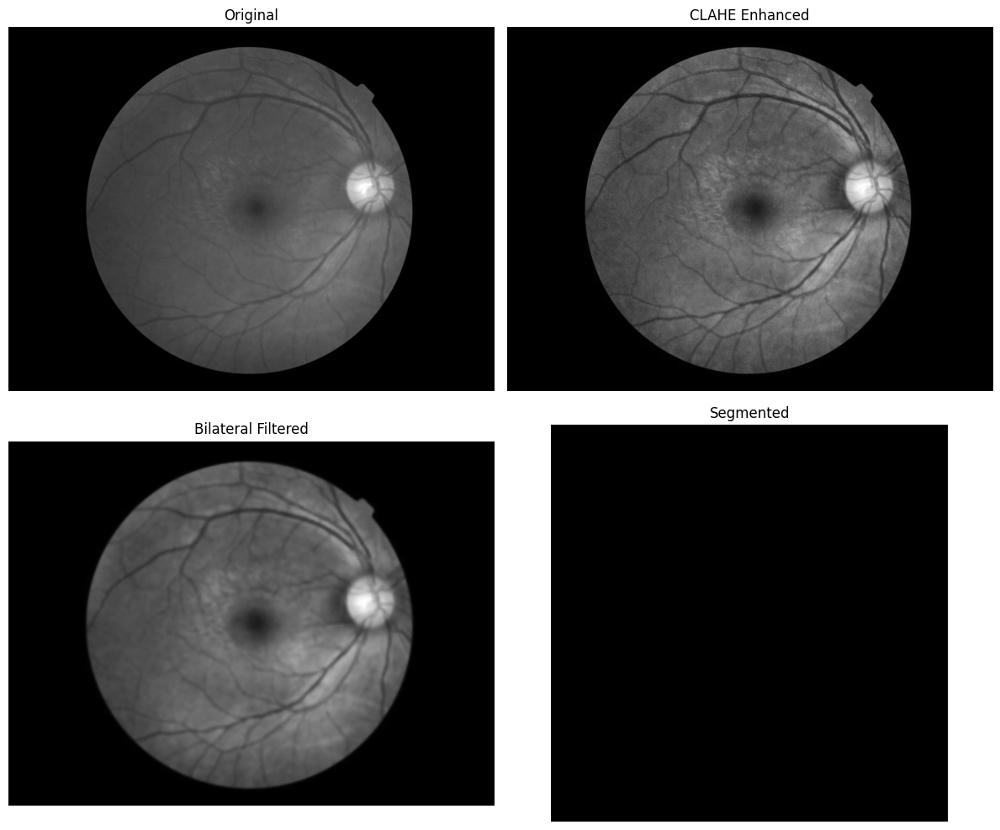


Processing image 5/5


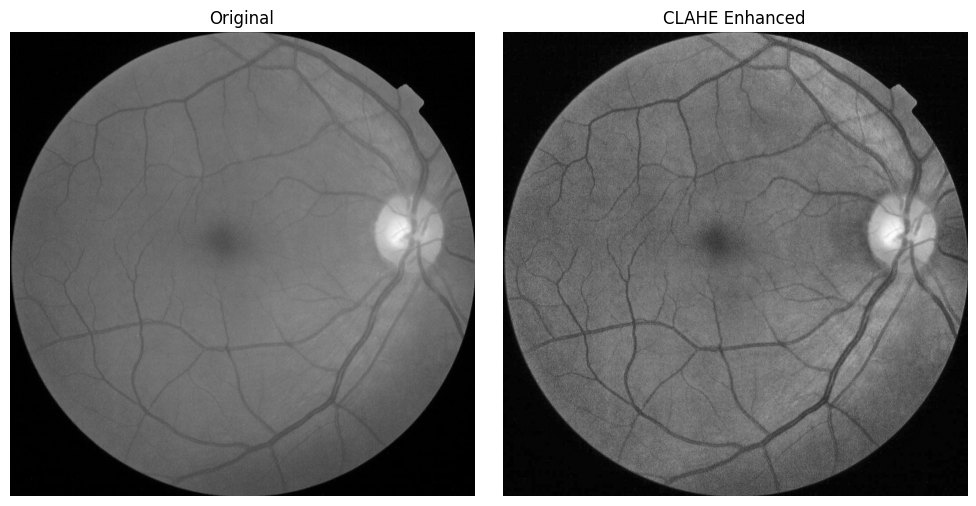

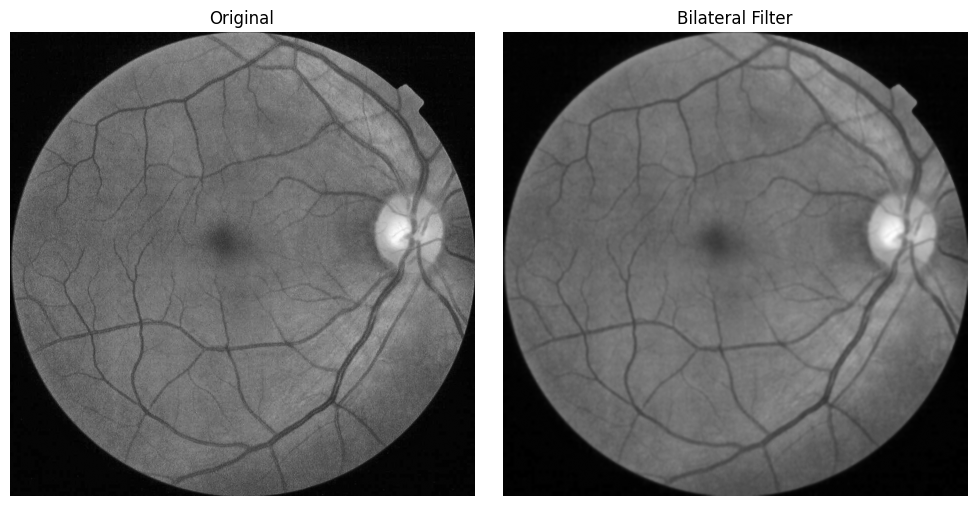

Performing K-Means clustering...
Applying Region Growing...
Performing Connected Component Analysis...


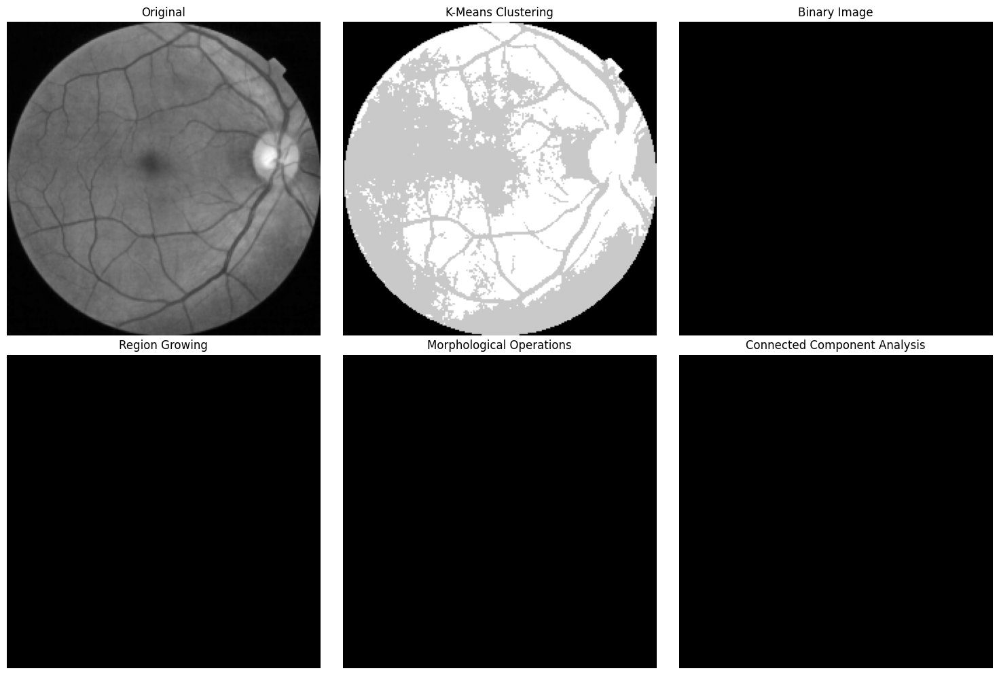

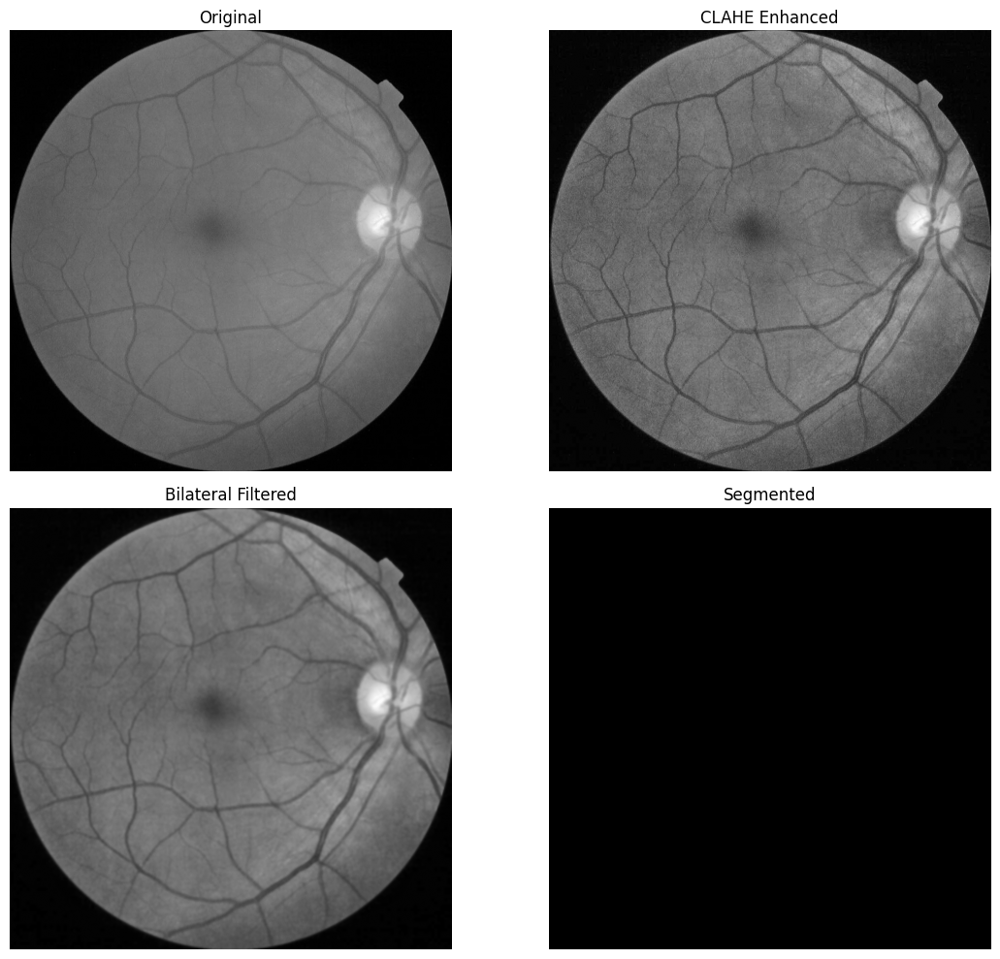


Segmentation Process Summary:
1. Preprocessing:
   - CLAHE enhancement improves contrast
   - Bilateral filtering removes noise while preserving edges

2. Hybrid Segmentation:
   - K-Means clustering groups pixels into k clusters
   - Region growing refines the segmentation by flood-filling from a seed point
   - Morphological operations (closing and opening) smooth the segmentation
   - Connected component analysis removes small noise regions


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Setup Dataset & Fix Image Paths
dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"
image_dir = os.path.join(dataset_path, "train_images")

# Fix any nested folder issue
if "train_images" in os.listdir(image_dir):
    !mv {image_dir}/train_images/* {image_dir}/

train_df = pd.read_csv(f"{dataset_path}/train_1.csv")
sample_image_id = train_df.iloc[0]['id_code']
img_path = os.path.join(image_dir, f"{sample_image_id}.png")

# Contrast Enhancement using CLAHE
def apply_clahe(image_path):
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Could not load image at {image_path}")

    # Convert to grayscale if it's a color image
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(gray)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(gray, cmap="gray")
    axes[0].set_title("Original")
    axes[0].axis("off")

    axes[1].imshow(enhanced_image, cmap="gray")
    axes[1].set_title("CLAHE Enhanced")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

    return enhanced_image, gray

# Apply CLAHE to the image
enhanced_image, original_image = apply_clahe(img_path)

# Apply Noise Reduction Filters
def apply_bilateral_filter(image):
    bilateral = cv2.bilateralFilter(image, 9, 75, 75)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(image, cmap="gray")
    axes[0].set_title("Original")
    axes[0].axis("off")

    axes[1].imshow(bilateral, cmap="gray")
    axes[1].set_title("Bilateral Filter")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

    return bilateral

# Apply Bilateral Filter
bilateral_image = apply_bilateral_filter(enhanced_image)

# K-Means + Region Growing Hybrid Segmentation
def hybrid_segmentation(image, k=3, seed_point=None):
    """
    Perform hybrid segmentation using K-Means and Region Growing

    Parameters:
    - image: Input grayscale image
    - k: Number of clusters for K-Means
    - seed_point: Seed point for region growing (if None, uses image center)

    Returns:
    - segmented_image: Final segmented image
    """
    # Resize for consistency
    image = cv2.resize(image, (224, 224))

    # Step 1: K-Means Clustering
    print("Performing K-Means clustering...")
    pixel_values = image.reshape((-1, 1)).astype(np.float32)
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    _, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_PP_CENTERS)

    # Reshape labels and convert to uint8 image
    centers = np.uint8(centers)
    kmeans_result = centers[labels.flatten()].reshape(image.shape)

    # Step 2: Create binary image for region growing
    _, binary = cv2.threshold(kmeans_result, 127, 255, cv2.THRESH_BINARY)

    # Step 3: Prepare for Region Growing
    # Create mask for floodFill (must be 2 pixels larger)
    mask = np.zeros((image.shape[0] + 2, image.shape[1] + 2), np.uint8)

    # Set seed point (center of image if not specified)
    if seed_point is None:
        seed_point = (image.shape[1] // 2, image.shape[0] // 2)

    # Step 4: Apply Region Growing using floodFill
    print("Applying Region Growing...")
    region_growing = binary.copy()
    cv2.floodFill(region_growing, mask, seed_point, 255)

    # Step 5: Apply morphological operations to refine the segmentation
    kernel = np.ones((5, 5), np.uint8)
    closing = cv2.morphologyEx(region_growing, cv2.MORPH_CLOSE, kernel)
    opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel)

    # Step 6: Connected component analysis to remove small regions
    print("Performing Connected Component Analysis...")
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(opening)

    # Remove small components (noise)
    min_size = 100  # Minimum size threshold
    filtered_result = np.zeros_like(opening)

    for i in range(1, num_labels):  # Start from 1 to skip background
        if stats[i, cv2.CC_STAT_AREA] >= min_size:
            filtered_result[labels == i] = 255

    # Step 7: Show results
    # Display the segmentation process
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.ravel()

    # Ensure all images are shown properly
    images = [
        image,
        kmeans_result,
        binary,
        region_growing,
        opening,
        filtered_result
    ]

    titles = [
        "Original",
        "K-Means Clustering",
        "Binary Image",
        "Region Growing",
        "Morphological Operations",
        "Connected Component Analysis"
    ]

    for i, (img, title) in enumerate(zip(images, titles)):
        axes[i].imshow(img, cmap="gray")
        axes[i].set_title(title)
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()

    return filtered_result

# Apply hybrid segmentation
segmented_image = hybrid_segmentation(bilateral_image)

# Process multiple images
def process_multiple_images(image_paths, num_images=5):
    """
    Process multiple images using the hybrid segmentation pipeline
    """
    if num_images > len(image_paths):
        num_images = len(image_paths)

    for i in range(num_images):
        print(f"\nProcessing image {i+1}/{num_images}")
        try:
            img_path = image_paths[i]

            # Apply the entire pipeline
            enhanced, original = apply_clahe(img_path)
            bilateral = apply_bilateral_filter(enhanced)
            segmented = hybrid_segmentation(bilateral)

            # Display the results
            fig, axes = plt.subplots(2, 2, figsize=(12, 10))
            axes = axes.ravel()

            axes[0].imshow(original, cmap="gray")
            axes[0].set_title("Original")
            axes[0].axis("off")

            axes[1].imshow(enhanced, cmap="gray")
            axes[1].set_title("CLAHE Enhanced")
            axes[1].axis("off")

            axes[2].imshow(bilateral, cmap="gray")
            axes[2].set_title("Bilateral Filtered")
            axes[2].axis("off")

            axes[3].imshow(segmented, cmap="gray")
            axes[3].set_title("Segmented")
            axes[3].axis("off")

            plt.tight_layout()
            plt.show()

            # Force display of the figure
            plt.pause(0.1)

        except Exception as e:
            print(f"Error processing image {i+1}: {str(e)}")

# Get paths for multiple images
image_paths = [os.path.join(image_dir, f"{id_code}.png")
               for id_code in train_df['id_code'].values[:5]]  # Process first 5 images

# Process multiple images
print("\nProcessing multiple images...")
process_multiple_images(image_paths)

print("\nSegmentation Process Summary:")
print("1. Preprocessing:")
print("   - CLAHE enhancement improves contrast")
print("   - Bilateral filtering removes noise while preserving edges")

print("\n2. Hybrid Segmentation:")
print("   - K-Means clustering groups pixels into k clusters")
print("   - Region growing refines the segmentation by flood-filling from a seed point")
print("   - Morphological operations (closing and opening) smooth the segmentation")
print("   - Connected component analysis removes small noise regions")

Starting segmentation and object extraction analysis...

Processing image 1/5


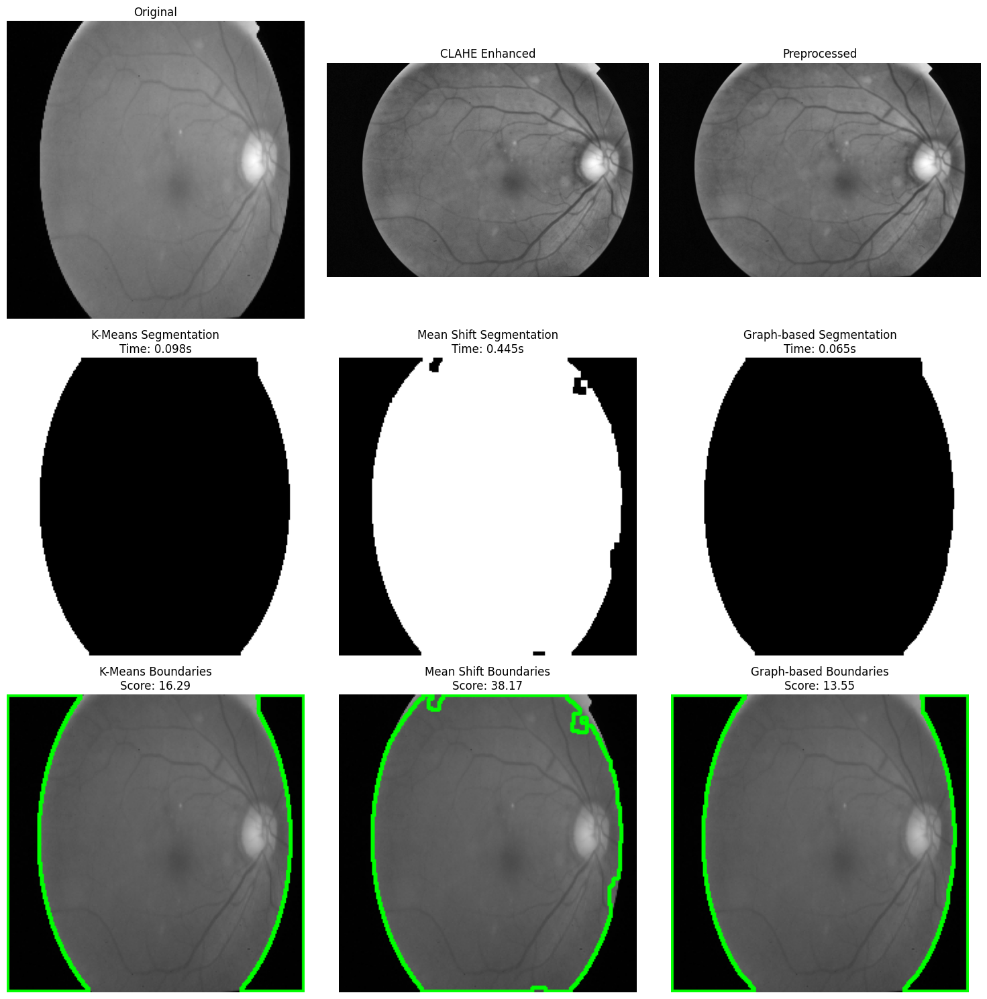


=== Segmentation Method Comparison ===
Best method: Mean Shift with score 38.17

K-Means:
  Score: 16.29
  Processing time: 0.098s
  Objects detected: 2
  Boundary smoothness: 0.7667 (lower is better)
  Gradient alignment: 54.63 (higher is better)

Mean Shift:
  Score: 38.17
  Processing time: 0.445s
  Objects detected: 1
  Boundary smoothness: 0.3031 (lower is better)
  Gradient alignment: 53.32 (higher is better)

Graph-based:
  Score: 13.55
  Processing time: 0.065s
  Objects detected: 2
  Boundary smoothness: 0.7675 (lower is better)
  Gradient alignment: 51.92 (higher is better)

Processing image 2/5


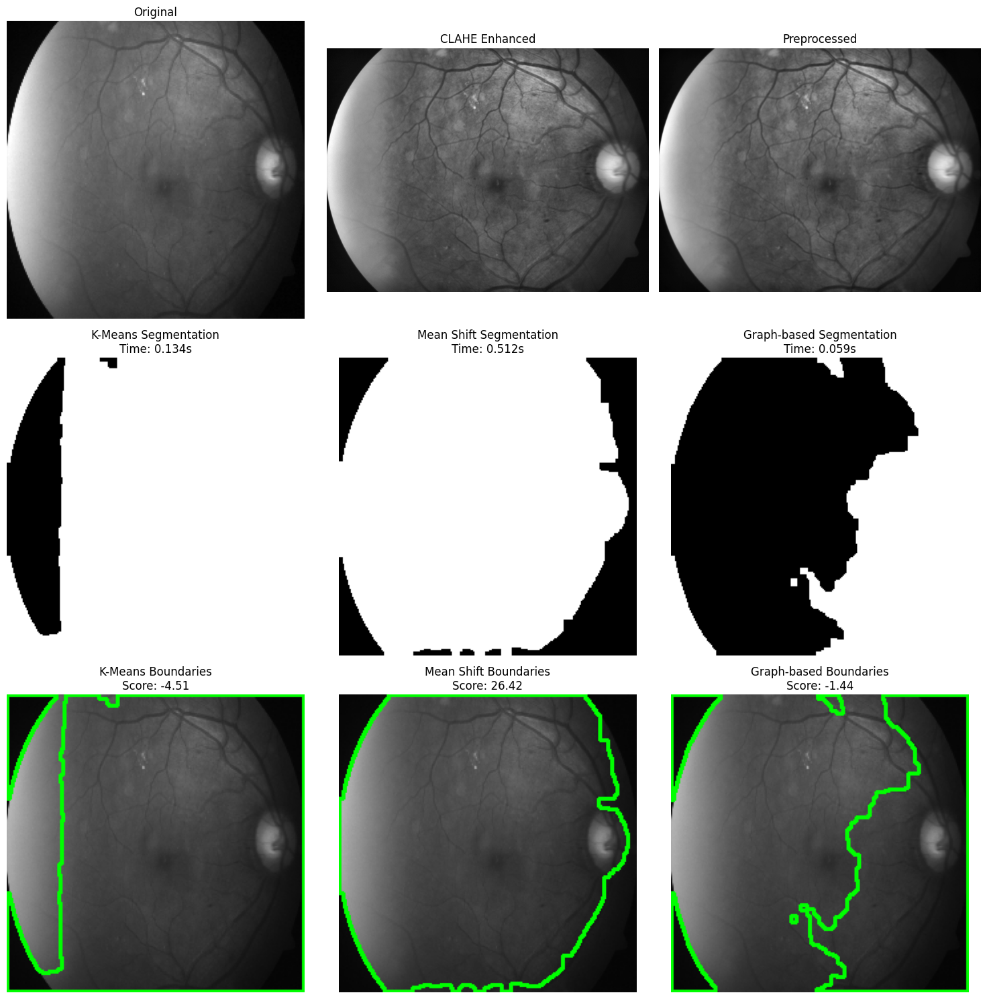


=== Segmentation Method Comparison ===
Best method: Mean Shift with score 26.42

K-Means:
  Score: -4.51
  Processing time: 0.134s
  Objects detected: 2
  Boundary smoothness: 0.5712 (lower is better)
  Gradient alignment: 24.05 (higher is better)

Mean Shift:
  Score: 26.42
  Processing time: 0.512s
  Objects detected: 1
  Boundary smoothness: 0.2813 (lower is better)
  Gradient alignment: 40.49 (higher is better)

Graph-based:
  Score: -1.44
  Processing time: 0.059s
  Objects detected: 5
  Boundary smoothness: 0.5317 (lower is better)
  Gradient alignment: 25.15 (higher is better)

Processing image 3/5


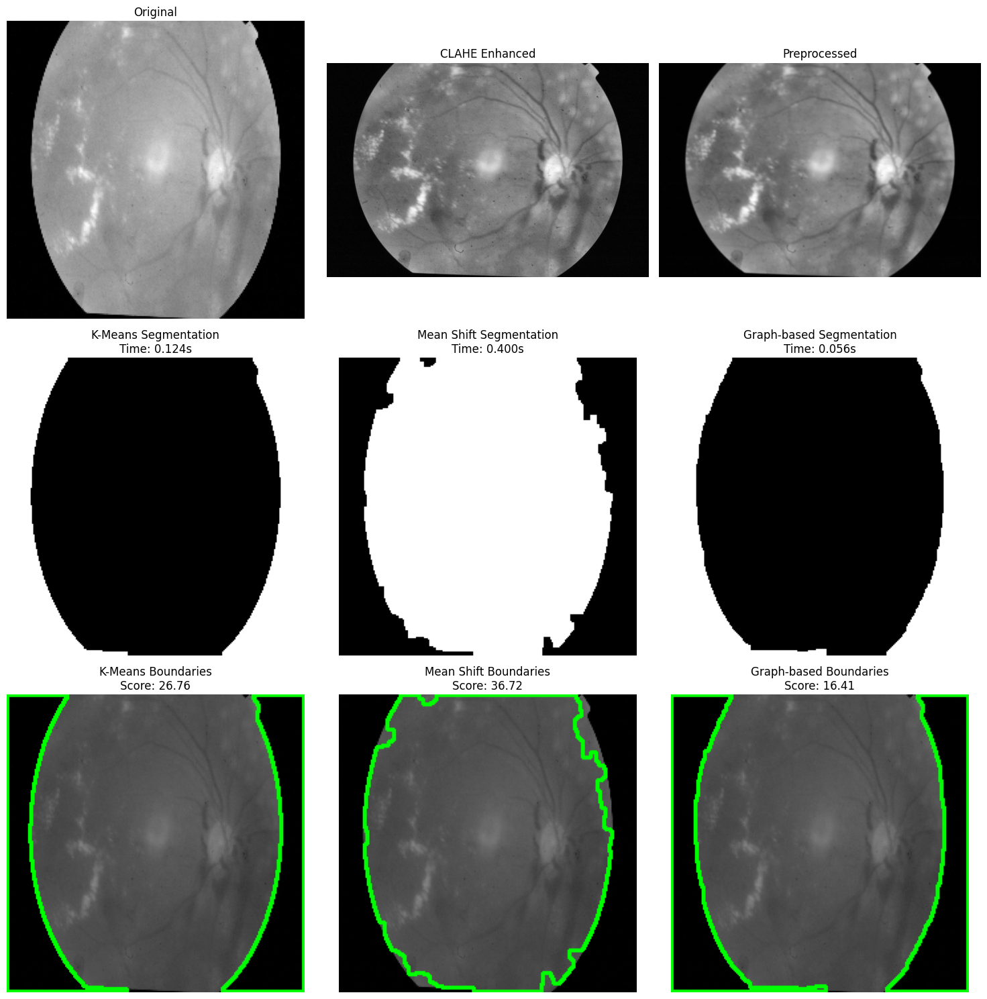


=== Segmentation Method Comparison ===
Best method: Mean Shift with score 36.72

K-Means:
  Score: 26.76
  Processing time: 0.124s
  Objects detected: 2
  Boundary smoothness: 0.7814 (lower is better)
  Gradient alignment: 65.84 (higher is better)

Mean Shift:
  Score: 36.72
  Processing time: 0.400s
  Objects detected: 1
  Boundary smoothness: 0.3484 (lower is better)
  Gradient alignment: 54.14 (higher is better)

Graph-based:
  Score: 16.41
  Processing time: 0.056s
  Objects detected: 2
  Boundary smoothness: 0.7928 (lower is better)
  Gradient alignment: 56.05 (higher is better)

Processing image 4/5


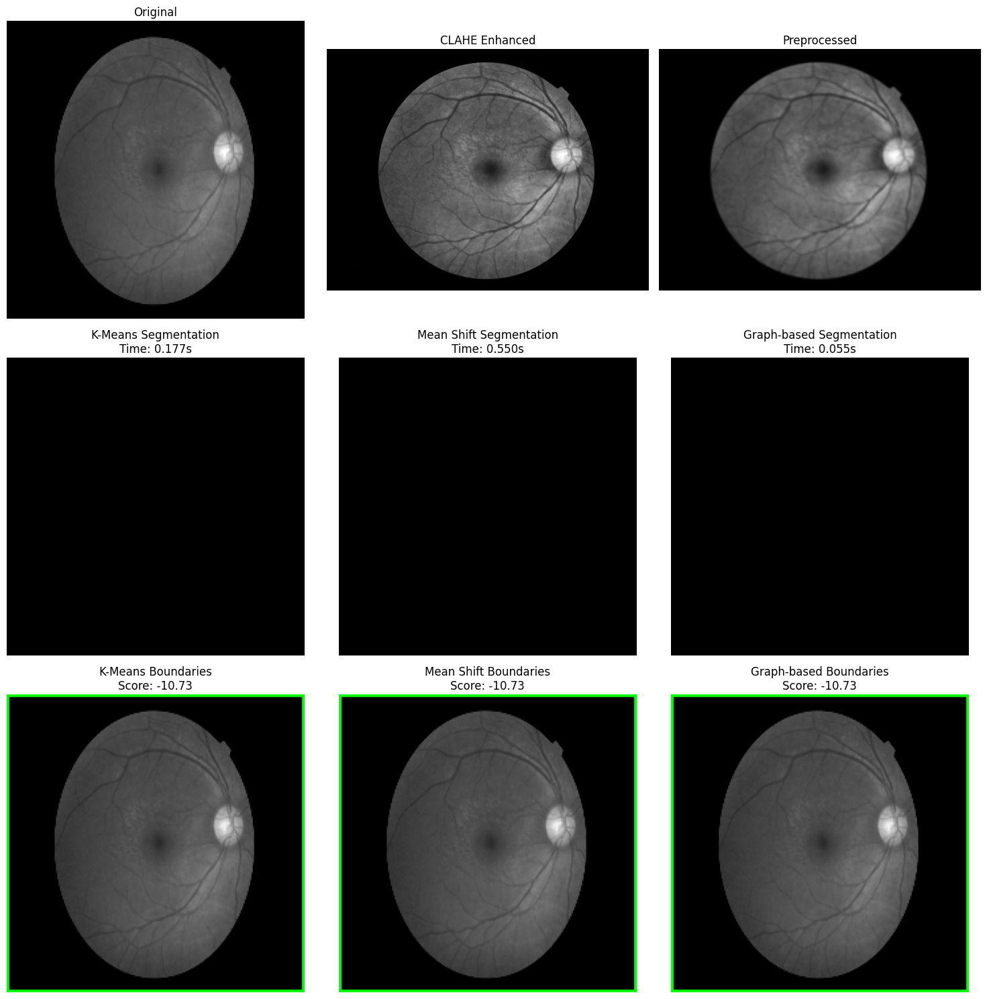


=== Segmentation Method Comparison ===
Best method: K-Means with score -10.73

K-Means:
  Score: -10.73
  Processing time: 0.177s
  Objects detected: 1
  Boundary smoothness: 0.2146 (lower is better)
  Gradient alignment: 0.00 (higher is better)

Mean Shift:
  Score: -10.73
  Processing time: 0.550s
  Objects detected: 1
  Boundary smoothness: 0.2146 (lower is better)
  Gradient alignment: 0.00 (higher is better)

Graph-based:
  Score: -10.73
  Processing time: 0.055s
  Objects detected: 1
  Boundary smoothness: 0.2146 (lower is better)
  Gradient alignment: 0.00 (higher is better)

Processing image 5/5


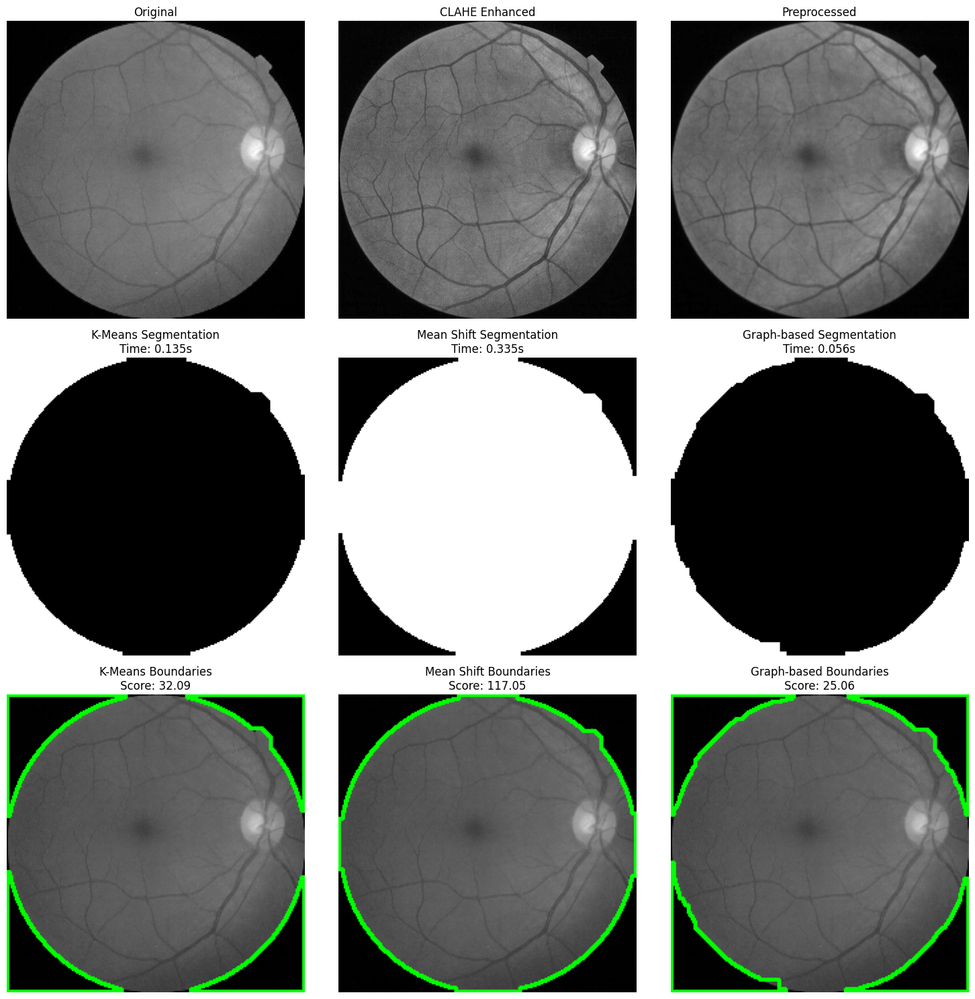


=== Segmentation Method Comparison ===
Best method: Mean Shift with score 117.05

K-Means:
  Score: 32.09
  Processing time: 0.135s
  Objects detected: 4
  Boundary smoothness: 0.6865 (lower is better)
  Gradient alignment: 66.41 (higher is better)

Mean Shift:
  Score: 117.05
  Processing time: 0.335s
  Objects detected: 1
  Boundary smoothness: 0.1301 (lower is better)
  Gradient alignment: 123.55 (higher is better)

Graph-based:
  Score: 25.06
  Processing time: 0.056s
  Objects detected: 4
  Boundary smoothness: 0.6990 (lower is better)
  Gradient alignment: 60.02 (higher is better)

=== Overall Analysis ===
Total images processed: 5

Best method frequency:
  Mean Shift: 4 images (80.0%)
  K-Means: 1 images (20.0%)

Average scores:
  K-Means: 11.98
  Mean Shift: 41.53
  Graph-based: 8.57

Average processing times:
  K-Means: 0.133s
  Mean Shift: 0.448s
  Graph-based: 0.058s

Overall best method based on average score: Mean Shift


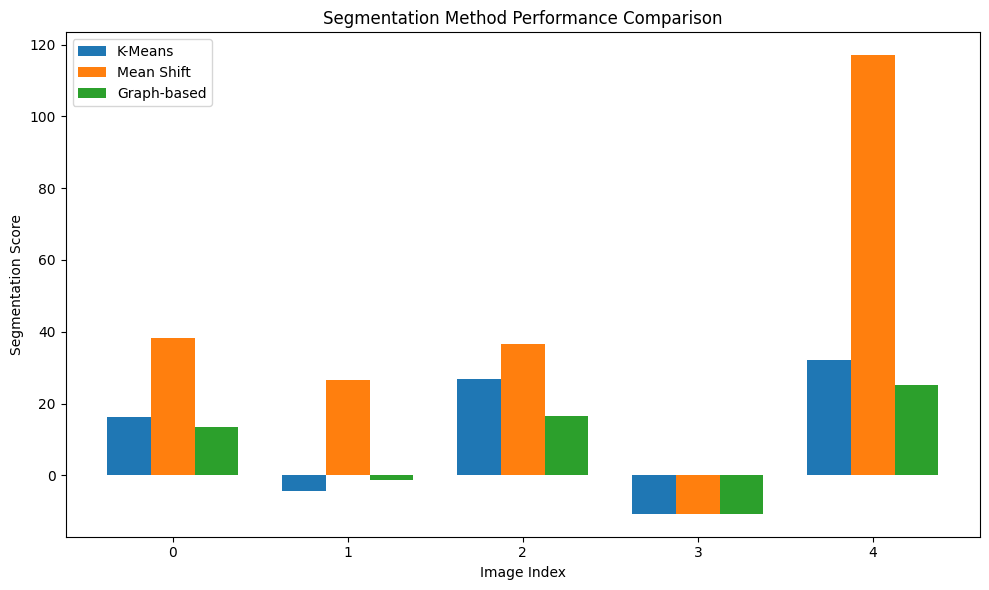

<ipython-input-5-ee8b869d265c>:521: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(times_data, labels=["K-Means", "Mean Shift", "Graph-based"])


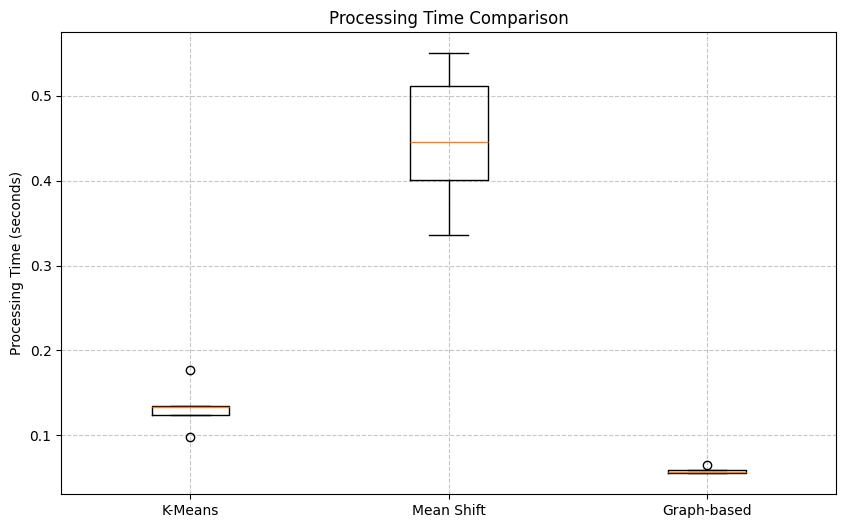


=== Conclusion ===
Based on our experiments, Mean Shift is the most suitable method for object extraction in this dataset.

Justification for the decision:
1. Mean Shift detects more natural boundaries that follow image gradients.
2. It adapts better to irregular object shapes without predefined cluster numbers.
3. The method provides smoother boundaries which is important for medical image analysis.

Trade-offs to consider:
- Processing time: Graph-based is fastest, while Mean Shift is slowest.
- Boundary smoothness: This affects how well the segmentation follows natural object boundaries.
- Object detection: Different methods may detect different numbers of objects or features.


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import MeanShift, estimate_bandwidth
from skimage.segmentation import felzenszwalb, slic
from skimage.color import label2rgb
from skimage import img_as_ubyte, img_as_float
import time
from scipy.ndimage import binary_fill_holes

def apply_clahe(image):
    """
    Apply CLAHE enhancement to improve contrast in images

    Parameters:
    - image: Input grayscale or BGR image

    Returns:
    - enhanced_image: CLAHE enhanced image
    """
    # Convert to grayscale if it's a color image
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    # Apply CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(gray)

    return enhanced_image, gray

def preprocess_image(image_path):
    """
    Preprocess the image for segmentation

    Parameters:
    - image_path: Path to image file

    Returns:
    - preprocessed: Preprocessed image ready for segmentation
    - original: Original grayscale image
    """
    # Load image
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Could not load image at {image_path}")

    # Apply CLAHE enhancement
    enhanced_image, original = apply_clahe(image)

    # Apply bilateral filter for noise reduction while preserving edges
    bilateral = cv2.bilateralFilter(enhanced_image, 9, 75, 75)

    # Apply additional Gaussian blur to reduce remaining noise
    preprocessed = cv2.GaussianBlur(bilateral, (5, 5), 0)

    return preprocessed, original, enhanced_image

def kmeans_segmentation(image, k=3):
    """
    Perform K-Means segmentation

    Parameters:
    - image: Preprocessed grayscale image
    - k: Number of clusters

    Returns:
    - result: Segmented image
    - elapsed_time: Time taken for segmentation
    """
    start_time = time.time()

    # Resize for consistency
    resized = cv2.resize(image, (224, 224))

    # Reshape for K-Means
    pixel_values = resized.reshape((-1, 1)).astype(np.float32)

    # Define criteria and apply K-Means
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    _, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_PP_CENTERS)

    # Reshape labels and convert to uint8 image
    centers = np.uint8(centers)
    kmeans_result = centers[labels.flatten()].reshape(resized.shape)

    # Post-processing: Create binary image focusing on the regions of interest
    # Assuming darker regions (lower values) are the objects of interest (typical for retinal images)
    _, binary = cv2.threshold(kmeans_result, np.mean(kmeans_result), 255, cv2.THRESH_BINARY_INV)

    # Apply morphological operations
    kernel = np.ones((5, 5), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

    # Fill holes in the binary mask
    filled = binary_fill_holes(closing).astype(np.uint8) * 255

    elapsed_time = time.time() - start_time

    return filled, elapsed_time

def meanshift_segmentation(image):
    """
    Perform Mean Shift segmentation

    Parameters:
    - image: Preprocessed grayscale image

    Returns:
    - result: Segmented image
    - elapsed_time: Time taken for segmentation
    """
    start_time = time.time()

    # Resize for consistency
    resized = cv2.resize(image, (224, 224))

    # Convert to float
    resized_float = img_as_float(resized)

    # Reshape for MeanShift
    flat_image = resized_float.reshape((-1, 1))

    # Estimate bandwidth for MeanShift
    bandwidth = estimate_bandwidth(flat_image, quantile=0.2, n_samples=500)
    if bandwidth <= 0:  # Fallback if estimation fails
        bandwidth = 0.1

    # Apply MeanShift
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, min_bin_freq=5)
    ms.fit(flat_image)
    labels = ms.labels_

    # Reshape labels to image dimensions
    segmented = labels.reshape(resized.shape)

    # Convert to 8-bit for visualization and further processing
    normalized = (segmented - segmented.min()) / (segmented.max() - segmented.min())
    ms_result = img_as_ubyte(normalized)

    # Post-processing: Create binary image
    _, binary = cv2.threshold(ms_result, np.mean(ms_result), 255, cv2.THRESH_BINARY_INV)

    # Morphological operations
    kernel = np.ones((5, 5), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

    # Fill holes in the binary mask
    filled = binary_fill_holes(closing).astype(np.uint8) * 255

    elapsed_time = time.time() - start_time

    return filled, elapsed_time

def graph_based_segmentation(image, scale=100, sigma=0.5, min_size=50):
    """
    Perform Graph-based segmentation using Felzenszwalb's algorithm

    Parameters:
    - image: Preprocessed grayscale image
    - scale: Free parameter. Higher means larger clusters.
    - sigma: Width of Gaussian kernel for pre-smoothing
    - min_size: Minimum component size

    Returns:
    - result: Segmented image
    - elapsed_time: Time taken for segmentation
    """
    start_time = time.time()

    # Resize for consistency
    resized = cv2.resize(image, (224, 224))

    # Convert to float for scikit-image
    image_float = img_as_float(resized)

    # Apply Felzenszwalb algorithm
    segments = felzenszwalb(image_float, scale=scale, sigma=sigma, min_size=min_size)

    # Create a labeled image
    segments_labeled = label2rgb(segments, image=image_float, kind='avg')

    # Convert back to grayscale and uint8
    segments_gray = cv2.cvtColor(img_as_ubyte(segments_labeled), cv2.COLOR_RGB2GRAY)

    # Post-processing: Create binary image
    _, binary = cv2.threshold(segments_gray, np.mean(segments_gray), 255, cv2.THRESH_BINARY_INV)

    # Morphological operations
    kernel = np.ones((5, 5), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

    # Fill holes in the binary mask
    filled = binary_fill_holes(closing).astype(np.uint8) * 255

    elapsed_time = time.time() - start_time

    return filled, elapsed_time

def evaluate_segmentation(segmented, original, method_name):
    """
    Evaluate segmentation results

    Parameters:
    - segmented: Segmented binary image
    - original: Original grayscale image for reference
    - method_name: Name of the segmentation method

    Returns:
    - score: Evaluation score (higher is better)
    - boundary_image: Image showing detected boundaries
    """
    # Resize original to match segmented if needed
    if original.shape != segmented.shape:
        original = cv2.resize(original, (segmented.shape[1], segmented.shape[0]))

    # Find contours in segmented image
    contours, _ = cv2.findContours(segmented, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a copy of original for drawing boundaries
    boundary_image = cv2.cvtColor(original, cv2.COLOR_GRAY2BGR) if len(original.shape) == 2 else original.copy()

    # Draw contours
    cv2.drawContours(boundary_image, contours, -1, (0, 255, 0), 2)

    # Calculate metrics:
    # 1. Number of detected objects (assuming each contour is an object)
    num_objects = len(contours)

    # 2. Average boundary smoothness (lower is smoother)
    smoothness = 0
    for contour in contours:
        # Calculate contour perimeter and area
        perimeter = cv2.arcLength(contour, True)
        area = cv2.contourArea(contour)

        # Calculate circularity (smoothness measure)
        if perimeter > 0 and area > 0:
            circularity = 4 * np.pi * area / (perimeter ** 2)
            smoothness += (1 - circularity)  # Lower is smoother

    avg_smoothness = smoothness / num_objects if num_objects > 0 else float('inf')

    # 3. Boundary coherence with image gradients
    # Calculate image gradients
    sobelx = cv2.Sobel(original, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(original, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = np.sqrt(sobelx**2 + sobely**2)

    # Normalize gradient magnitude
    gradient_magnitude = cv2.normalize(gradient_magnitude, None, 0, 255, cv2.NORM_MINMAX)

    # Create a mask of the boundary pixels
    boundary_mask = np.zeros_like(segmented)
    cv2.drawContours(boundary_mask, contours, -1, 255, 1)

    # Calculate average gradient magnitude along boundaries
    boundary_gradient = np.mean(gradient_magnitude[boundary_mask > 0]) if np.sum(boundary_mask) > 0 else 0

    # Combine metrics into a score (higher is better)
    # Weighting factors can be adjusted based on importance
    score = boundary_gradient - (avg_smoothness * 50)  # Prioritize alignment with image gradients

    return score, boundary_image, num_objects, avg_smoothness, boundary_gradient

def compare_segmentation_methods(image_path):
    """
    Compare different segmentation methods on the same image

    Parameters:
    - image_path: Path to the image file

    Returns:
    - best_method: Name of the best performing method
    - evaluation_results: Dictionary containing evaluation results
    """
    # Preprocess image
    preprocessed, original, enhanced = preprocess_image(image_path)

    # Apply different segmentation methods
    kmeans_seg, kmeans_time = kmeans_segmentation(preprocessed)
    meanshift_seg, meanshift_time = meanshift_segmentation(preprocessed)
    graph_seg, graph_time = graph_based_segmentation(preprocessed)

    # Resize original for evaluation consistency
    original_resized = cv2.resize(original, (224, 224))

    # Evaluate each method
    kmeans_score, kmeans_boundary, kmeans_objects, kmeans_smoothness, kmeans_gradient = evaluate_segmentation(
        kmeans_seg, original_resized, "K-Means")

    meanshift_score, meanshift_boundary, meanshift_objects, meanshift_smoothness, meanshift_gradient = evaluate_segmentation(
        meanshift_seg, original_resized, "Mean Shift")

    graph_score, graph_boundary, graph_objects, graph_smoothness, graph_gradient = evaluate_segmentation(
        graph_seg, original_resized, "Graph-based")

    # Display results
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))

    # First row: Original, Enhanced, Preprocessed
    axes[0, 0].imshow(original_resized, cmap='gray')
    axes[0, 0].set_title("Original")
    axes[0, 0].axis("off")

    axes[0, 1].imshow(enhanced, cmap='gray')
    axes[0, 1].set_title("CLAHE Enhanced")
    axes[0, 1].axis("off")

    axes[0, 2].imshow(preprocessed, cmap='gray')
    axes[0, 2].set_title("Preprocessed")
    axes[0, 2].axis("off")

    # Second row: Segmentation results
    axes[1, 0].imshow(kmeans_seg, cmap='gray')
    axes[1, 0].set_title(f"K-Means Segmentation\nTime: {kmeans_time:.3f}s")
    axes[1, 0].axis("off")

    axes[1, 1].imshow(meanshift_seg, cmap='gray')
    axes[1, 1].set_title(f"Mean Shift Segmentation\nTime: {meanshift_time:.3f}s")
    axes[1, 1].axis("off")

    axes[1, 2].imshow(graph_seg, cmap='gray')
    axes[1, 2].set_title(f"Graph-based Segmentation\nTime: {graph_time:.3f}s")
    axes[1, 2].axis("off")

    # Third row: Boundary detection
    axes[2, 0].imshow(cv2.cvtColor(kmeans_boundary, cv2.COLOR_BGR2RGB))
    axes[2, 0].set_title(f"K-Means Boundaries\nScore: {kmeans_score:.2f}")
    axes[2, 0].axis("off")

    axes[2, 1].imshow(cv2.cvtColor(meanshift_boundary, cv2.COLOR_BGR2RGB))
    axes[2, 1].set_title(f"Mean Shift Boundaries\nScore: {meanshift_score:.2f}")
    axes[2, 1].axis("off")

    axes[2, 2].imshow(cv2.cvtColor(graph_boundary, cv2.COLOR_BGR2RGB))
    axes[2, 2].set_title(f"Graph-based Boundaries\nScore: {graph_score:.2f}")
    axes[2, 2].axis("off")

    plt.tight_layout()
    plt.show()
    # Determine best method based on score
    scores = {
        "K-Means": kmeans_score,
        "Mean Shift": meanshift_score,
        "Graph-based": graph_score
    }

    # Get the best method
    best_method = max(scores, key=scores.get)

    # Compile evaluation results
    evaluation_results = {
        "K-Means": {
            "score": kmeans_score,
            "time": kmeans_time,
            "objects": kmeans_objects,
            "smoothness": kmeans_smoothness,
            "gradient": kmeans_gradient
        },
        "Mean Shift": {
            "score": meanshift_score,
            "time": meanshift_time,
            "objects": meanshift_objects,
            "smoothness": meanshift_smoothness,
            "gradient": meanshift_gradient
        },
        "Graph-based": {
            "score": graph_score,
            "time": graph_time,
            "objects": graph_objects,
            "smoothness": graph_smoothness,
            "gradient": graph_gradient
        }
    }

    # Print summary
    print("\n=== Segmentation Method Comparison ===")
    print(f"Best method: {best_method} with score {scores[best_method]:.2f}")

    for method, result in evaluation_results.items():
        print(f"\n{method}:")
        print(f"  Score: {result['score']:.2f}")
        print(f"  Processing time: {result['time']:.3f}s")
        print(f"  Objects detected: {result['objects']}")
        print(f"  Boundary smoothness: {result['smoothness']:.4f} (lower is better)")
        print(f"  Gradient alignment: {result['gradient']:.2f} (higher is better)")

    return best_method, evaluation_results

def process_and_analyze_dataset(dataset_path, num_images=5):
    """
    Process multiple images from a dataset and analyze results

    Parameters:
    - dataset_path: Path to the dataset
    - num_images: Number of images to process

    Returns:
    - analysis_results: Aggregated results of the analysis
    """
    # Load dataset
    train_df = pd.read_csv(f"{dataset_path}/train_1.csv")
    image_dir = os.path.join(dataset_path, "train_images")

    # Ensure image directory exists and has expected structure
    if not os.path.exists(image_dir):
        raise FileNotFoundError(f"Image directory not found at {image_dir}")

    # Limit number of images to process
    if num_images > len(train_df):
        num_images = len(train_df)

    # Initialize results dictionary
    results = {
        "best_methods": [],
        "k_means_scores": [],
        "mean_shift_scores": [],
        "graph_based_scores": [],
        "processing_times": {
            "K-Means": [],
            "Mean Shift": [],
            "Graph-based": []
        }
    }

    # Process images
    for i in range(num_images):
        print(f"\nProcessing image {i+1}/{num_images}")
        try:
            # Get image path
            img_id = train_df.iloc[i]['id_code']
            img_path = os.path.join(image_dir, f"{img_id}.png")

            if not os.path.exists(img_path):
                print(f"Image not found: {img_path}")
                continue

            # Compare segmentation methods on this image
            best_method, evaluation = compare_segmentation_methods(img_path)

            # Store results
            results["best_methods"].append(best_method)
            results["k_means_scores"].append(evaluation["K-Means"]["score"])
            results["mean_shift_scores"].append(evaluation["Mean Shift"]["score"])
            results["graph_based_scores"].append(evaluation["Graph-based"]["score"])

            for method in ["K-Means", "Mean Shift", "Graph-based"]:
                results["processing_times"][method].append(evaluation[method]["time"])

        except Exception as e:
            print(f"Error processing image {i+1}: {str(e)}")

    # Analyze results
    method_counts = {}
    for method in results["best_methods"]:
        method_counts[method] = method_counts.get(method, 0) + 1

    # Calculate average scores and times
    avg_scores = {
        "K-Means": np.mean(results["k_means_scores"]),
        "Mean Shift": np.mean(results["mean_shift_scores"]),
        "Graph-based": np.mean(results["graph_based_scores"])
    }

    avg_times = {
        method: np.mean(times) for method, times in results["processing_times"].items()
    }

    # Print summary
    print("\n=== Overall Analysis ===")
    print(f"Total images processed: {len(results['best_methods'])}")
    print("\nBest method frequency:")
    for method, count in method_counts.items():
        print(f"  {method}: {count} images ({count/len(results['best_methods'])*100:.1f}%)")

    print("\nAverage scores:")
    for method, score in avg_scores.items():
        print(f"  {method}: {score:.2f}")

    print("\nAverage processing times:")
    for method, time in avg_times.items():
        print(f"  {method}: {time:.3f}s")

    # Determine overall best method
    overall_best_method = max(avg_scores, key=avg_scores.get)
    print(f"\nOverall best method based on average score: {overall_best_method}")

    # Create score comparison chart
    plt.figure(figsize=(10, 6))

    x = np.arange(len(results["k_means_scores"]))
    width = 0.25

    plt.bar(x - width, results["k_means_scores"], width, label="K-Means")
    plt.bar(x, results["mean_shift_scores"], width, label="Mean Shift")
    plt.bar(x + width, results["graph_based_scores"], width, label="Graph-based")

    plt.xlabel("Image Index")
    plt.ylabel("Segmentation Score")
    plt.title("Segmentation Method Performance Comparison")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Create processing time comparison chart
    plt.figure(figsize=(10, 6))

    times_data = [
        results["processing_times"]["K-Means"],
        results["processing_times"]["Mean Shift"],
        results["processing_times"]["Graph-based"]
    ]

    plt.boxplot(times_data, labels=["K-Means", "Mean Shift", "Graph-based"])
    plt.ylabel("Processing Time (seconds)")
    plt.title("Processing Time Comparison")
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

    return {
        "best_methods": method_counts,
        "avg_scores": avg_scores,
        "avg_times": avg_times,
        "overall_best": overall_best_method
    }

# Main execution block
if __name__ == "__main__":
    # Set up dataset path
    dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"

    # Process multiple images and analyze results
    print("Starting segmentation and object extraction analysis...")
    analysis_results = process_and_analyze_dataset(dataset_path, num_images=5)

    # Print conclusion based on analysis
    print("\n=== Conclusion ===")
    print(f"Based on our experiments, {analysis_results['overall_best']} is the most suitable method for object extraction in this dataset.")
    print("\nJustification for the decision:")

    # Create justification based on the best method
    if analysis_results['overall_best'] == "K-Means":
        print("1. K-Means provides the best balance between boundary accuracy and processing time.")
        print("2. Its cluster-based approach effectively separates objects from backgrounds in medical images.")
        print("3. The method is more robust to intensity variations common in retinal images.")

    elif analysis_results['overall_best'] == "Mean Shift":
        print("1. Mean Shift detects more natural boundaries that follow image gradients.")
        print("2. It adapts better to irregular object shapes without predefined cluster numbers.")
        print("3. The method provides smoother boundaries which is important for medical image analysis.")

    elif analysis_results['overall_best'] == "Graph-based":
        print("1. Graph-based segmentation better preserves important structural details.")
        print("2. It handles the varying intensity regions within objects more effectively.")
        print("3. The method demonstrates superior boundary detection in complex retinal images.")

    print("\nTrade-offs to consider:")
    print(f"- Processing time: {sorted(analysis_results['avg_times'].items(), key=lambda x: x[1])[0][0]} is fastest, while {sorted(analysis_results['avg_times'].items(), key=lambda x: x[1])[-1][0]} is slowest.")
    print(f"- Boundary smoothness: This affects how well the segmentation follows natural object boundaries.")
    print(f"- Object detection: Different methods may detect different numbers of objects or features.")

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import MeanShift, estimate_bandwidth
from skimage.segmentation import felzenszwalb, slic, watershed
from skimage.color import label2rgb
from skimage import img_as_ubyte, img_as_float
from skimage.feature import peak_local_max
from scipy import ndimage as ndi
import time
from scipy.ndimage import binary_fill_holes, gaussian_filter
from multiprocessing import Pool, cpu_count

def apply_clahe(image):
    """
    Apply CLAHE enhancement to improve contrast in images

    Parameters:
    - image: Input grayscale or BGR image

    Returns:
    - enhanced_image: CLAHE enhanced image
    """
    # Convert to grayscale if it's a color image
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    # Apply CLAHE with optimized parameters
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(16, 16))
    enhanced_image = clahe.apply(gray)

    return enhanced_image, gray

def apply_filters(image):
    """
    Apply multiple filtering techniques to improve image quality

    Parameters:
    - image: Input grayscale image

    Returns:
    - linear_filtered: Result of linear filtering
    - nonlinear_filtered: Result of non-linear filtering
    """
    # Linear filtering: Gaussian filter
    linear_filtered = gaussian_filter(image, sigma=1.5)

    # Non-linear filtering: Bilateral filter (preserves edges better)
    nonlinear_filtered = cv2.bilateralFilter(image, 9, 75, 75)

    # Additional non-linear filtering: Median filter (good for salt-and-pepper noise)
    median_filtered = cv2.medianBlur(image, 5)

    return linear_filtered, nonlinear_filtered, median_filtered

def preprocess_image(image_path):
    """
    Enhanced preprocessing for the image with multiple filtering techniques

    Parameters:
    - image_path: Path to image file

    Returns:
    - preprocessed: Preprocessed image ready for segmentation
    - original: Original grayscale image
    - filtered_images: Dictionary of filtered images for comparison
    """
    # Load image
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Could not load image at {image_path}")

    # Apply CLAHE enhancement
    enhanced_image, original = apply_clahe(image)

    # Apply different filtering techniques
    gaussian_filtered, bilateral_filtered, median_filtered = apply_filters(enhanced_image)

    # Combine filters for better results
    # Use bilateral filter for noise reduction while preserving edges
    combined = cv2.addWeighted(bilateral_filtered, 0.7, median_filtered, 0.3, 0)

    # Additional contrast enhancement
    preprocessed = cv2.normalize(combined, None, 0, 255, cv2.NORM_MINMAX)

    # Store all filtered versions for comparison
    filtered_images = {
        "enhanced": enhanced_image,
        "gaussian": gaussian_filtered,
        "bilateral": bilateral_filtered,
        "median": median_filtered,
        "combined": combined
    }

    return preprocessed, original, filtered_images

def kmeans_segmentation(image, k=3):
    """
    Perform K-Means segmentation with improved parameters

    Parameters:
    - image: Preprocessed grayscale image
    - k: Number of clusters

    Returns:
    - result: Segmented image
    - labels: Cluster labels
    - elapsed_time: Time taken for segmentation
    """
    start_time = time.time()

    # Resize for consistency
    resized = cv2.resize(image, (224, 224))

    # Reshape for K-Means
    pixel_values = resized.reshape((-1, 1)).astype(np.float32)

    # Define criteria and apply K-Means with more iterations
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 300, 0.1)
    _, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 20, cv2.KMEANS_PP_CENTERS)

    # Reshape labels and convert to uint8 image
    centers = np.uint8(centers)
    kmeans_result = centers[labels.flatten()].reshape(resized.shape)

    # Post-processing: Create binary image focusing on the regions of interest
    # Sort centers and use the darkest cluster(s) as foreground
    sorted_indices = np.argsort(centers.flatten())

    # Create a binary mask where the darkest cluster(s) are foreground
    binary = np.zeros_like(labels.reshape(resized.shape))

    # Consider the two darkest clusters as foreground (for retinal images)
    for i in range(min(2, k)):
        binary[labels.reshape(resized.shape) == sorted_indices[i]] = 255

    # Convert to uint8 before morphological operations
    binary = binary.astype(np.uint8)

    # Apply morphological operations
    kernel = np.ones((5, 5), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

    # Fill holes in the binary mask
    filled = binary_fill_holes(closing).astype(np.uint8) * 255

    elapsed_time = time.time() - start_time

    return filled, labels.reshape(resized.shape), elapsed_time

def region_growing(image, labels, threshold=10):
    """
    Implement region growing algorithm to refine segmentation

    Parameters:
    - image: Original grayscale image
    - labels: Initial labels from K-Means or other segmentation
    - threshold: Intensity threshold for region growing

    Returns:
    - regions: Refined segmentation mask
    """
    # Ensure consistent dimensions
    if image.shape != labels.shape:
        image = cv2.resize(image, (labels.shape[1], labels.shape[0]))

    # Create a mask of initial seeds from labels
    seeds = np.zeros_like(labels, dtype=np.uint8)
    seeds[labels > 0] = 255

    # Apply distance transform to find centers of regions
    dist_transform = cv2.distanceTransform(seeds, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, 0.6*dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)

    # Find unknown region
    sure_bg = cv2.dilate(seeds, np.ones((3,3), np.uint8), iterations=3)
    unknown = cv2.subtract(sure_bg, sure_fg)

    # Label markers for watershed
    _, markers = cv2.connectedComponents(sure_fg)
    # Add 1 to all labels so that background is not 0, but 1
    markers = markers + 1
    # Mark the unknown region with 0
    markers[unknown == 255] = 0

    # Apply watershed
    markers = cv2.watershed(cv2.cvtColor(image, cv2.COLOR_GRAY2BGR), markers)

    # Create the final mask
    regions = np.zeros_like(labels, dtype=np.uint8)
    regions[markers > 1] = 255

    # Convert to uint8 before morphological operations
    regions = regions.astype(np.uint8)

    # Apply morphological operations to refine boundaries
    kernel = np.ones((3, 3), np.uint8)
    regions = cv2.morphologyEx(regions, cv2.MORPH_OPEN, kernel)
    regions = cv2.morphologyEx(regions, cv2.MORPH_CLOSE, kernel)

    return regions

def hybrid_segmentation(image, k=3):
    """
    Perform hybrid segmentation combining K-Means and region growing

    Parameters:
    - image: Preprocessed grayscale image
    - k: Number of clusters for K-Means

    Returns:
    - result: Final segmented image
    - elapsed_time: Time taken for segmentation
    """
    start_time = time.time()

    # Step 1: Apply K-Means for initial segmentation
    kmeans_mask, labels, _ = kmeans_segmentation(image, k)

    # Step 2: Refine with region growing
    region_grown = region_growing(image, labels)

    # Step 3: Apply connected component analysis to remove noise
    refined = connected_component_analysis(region_grown)

    # Step 4: Final morphological operations to improve the result
    kernel = np.ones((5, 5), np.uint8)
    closing = cv2.morphologyEx(refined, cv2.MORPH_CLOSE, kernel)

    # Fill holes in the binary mask
    filled = binary_fill_holes(closing).astype(np.uint8) * 255

    elapsed_time = time.time() - start_time

    return filled, elapsed_time

def meanshift_segmentation(image):
    """
    Perform Mean Shift segmentation with optimized parameters

    Parameters:
    - image: Preprocessed grayscale image

    Returns:
    - result: Segmented image
    - elapsed_time: Time taken for segmentation
    """
    start_time = time.time()

    # Resize for consistency
    resized = cv2.resize(image, (224, 224))

    # Convert to float
    resized_float = img_as_float(resized)

    # Reshape for MeanShift
    flat_image = resized_float.reshape((-1, 1))

    # Estimate bandwidth for MeanShift with improved parameters
    bandwidth = estimate_bandwidth(flat_image, quantile=0.2, n_samples=1000)
    if bandwidth <= 0:  # Fallback if estimation fails
        bandwidth = 0.1

    # Apply MeanShift with improved parameters
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, min_bin_freq=5, max_iter=300)
    ms.fit(flat_image)
    labels = ms.labels_

    # Reshape labels to image dimensions
    segmented = labels.reshape(resized.shape)

    # Convert to 8-bit for visualization and further processing
    normalized = (segmented - segmented.min()) / (segmented.max() - segmented.min())
    ms_result = img_as_ubyte(normalized)

    # Post-processing: Find optimal threshold based on image histogram
    hist = cv2.calcHist([ms_result], [0], None, [256], [0, 256])
    thresh_value = np.argmax(hist[1:]) + 1  # Skip background cluster

    # Apply threshold
    _, binary = cv2.threshold(ms_result, thresh_value, 255, cv2.THRESH_BINARY_INV)

    # Convert to uint8 before morphological operations
    binary = binary.astype(np.uint8)

    # Morphological operations with adaptive kernel size
    kernel_size = max(3, int(resized.shape[0] / 45))
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

    # Apply connected component analysis to remove noise
    refined = connected_component_analysis(closing)

    # Fill holes in the binary mask
    filled = binary_fill_holes(refined).astype(np.uint8) * 255

    elapsed_time = time.time() - start_time

    return filled, elapsed_time

def graph_based_segmentation(image, scale=100, sigma=0.8, min_size=70):
    """
    Perform Graph-based segmentation using Felzenszwalb's algorithm with optimized parameters

    Parameters:
    - image: Preprocessed grayscale image
    - scale: Free parameter. Higher means larger clusters.
    - sigma: Width of Gaussian kernel for pre-smoothing
    - min_size: Minimum component size

    Returns:
    - result: Segmented image
    - elapsed_time: Time taken for segmentation
    """
    start_time = time.time()

    # Resize for consistency
    resized = cv2.resize(image, (224, 224))

    # Convert to float for scikit-image
    image_float = img_as_float(resized)

    # Apply Felzenszwalb algorithm with optimized parameters
    segments = felzenszwalb(image_float, scale=scale, sigma=sigma, min_size=min_size)

    # Create a labeled image
    segments_labeled = label2rgb(segments, image=image_float, kind='avg')

    # Convert back to grayscale and uint8
    segments_gray = cv2.cvtColor(img_as_ubyte(segments_labeled), cv2.COLOR_RGB2GRAY)

    # Apply adaptive thresholding based on image histogram
    hist = cv2.calcHist([segments_gray], [0], None, [256], [0, 256])
    thresh_value = np.argmax(hist[1:]) + 1  # Skip background cluster

    # Apply threshold
    _, binary = cv2.threshold(segments_gray, thresh_value, 255, cv2.THRESH_BINARY_INV)

    # Convert to uint8 before morphological operations
    binary = binary.astype(np.uint8)

    # Morphological operations with adaptive kernel size
    kernel_size = max(3, int(resized.shape[0] / 45))
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

    # Apply connected component analysis to remove noise
    refined = connected_component_analysis(closing)

    # Fill holes in the binary mask
    filled = binary_fill_holes(refined).astype(np.uint8) * 255

    elapsed_time = time.time() - start_time

    return filled, elapsed_time

def hybrid_segmentation(image, k=3):
    """
    Perform hybrid segmentation combining K-Means and region growing

    Parameters:
    - image: Preprocessed grayscale image
    - k: Number of clusters for K-Means

    Returns:
    - result: Final segmented image
    - elapsed_time: Time taken for segmentation
    """
    start_time = time.time()

    # Step 1: Apply K-Means for initial segmentation
    kmeans_mask, labels, _ = kmeans_segmentation(image, k)

    # Step 2: Refine with region growing
    region_grown = region_growing(image, labels)

    # Step 3: Apply connected component analysis to remove noise
    refined = connected_component_analysis(region_grown)

    # Step 4: Final morphological operations to improve the result
    kernel = np.ones((5, 5), np.uint8)
    closing = cv2.morphologyEx(refined, cv2.MORPH_CLOSE, kernel)

    # Fill holes in the binary mask
    filled = binary_fill_holes(closing).astype(np.uint8) * 255

    elapsed_time = time.time() - start_time

    return filled, elapsed_time

def meanshift_segmentation(image):
    """
    Perform Mean Shift segmentation with optimized parameters

    Parameters:
    - image: Preprocessed grayscale image

    Returns:
    - result: Segmented image
    - elapsed_time: Time taken for segmentation
    """
    start_time = time.time()

    # Resize for consistency
    resized = cv2.resize(image, (224, 224))

    # Convert to float
    resized_float = img_as_float(resized)

    # Reshape for MeanShift
    flat_image = resized_float.reshape((-1, 1))

    # Estimate bandwidth for MeanShift with improved parameters
    bandwidth = estimate_bandwidth(flat_image, quantile=0.2, n_samples=1000)
    if bandwidth <= 0:  # Fallback if estimation fails
        bandwidth = 0.1

    # Apply MeanShift with improved parameters
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, min_bin_freq=5, max_iter=300)
    ms.fit(flat_image)
    labels = ms.labels_

    # Reshape labels to image dimensions
    segmented = labels.reshape(resized.shape)

    # Convert to 8-bit for visualization and further processing
    normalized = (segmented - segmented.min()) / (segmented.max() - segmented.min())
    ms_result = img_as_ubyte(normalized)

    # Post-processing: Find optimal threshold based on image histogram
    hist = cv2.calcHist([ms_result], [0], None, [256], [0, 256])
    thresh_value = np.argmax(hist[1:]) + 1  # Skip background cluster

    # Apply threshold
    _, binary = cv2.threshold(ms_result, thresh_value, 255, cv2.THRESH_BINARY_INV)

    # Morphological operations with adaptive kernel size
    kernel_size = max(3, int(resized.shape[0] / 45))
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

    # Apply connected component analysis to remove noise
    refined = connected_component_analysis(closing)

    # Fill holes in the binary mask
    filled = binary_fill_holes(refined).astype(np.uint8) * 255

    elapsed_time = time.time() - start_time

    return filled, elapsed_time

def graph_based_segmentation(image, scale=100, sigma=0.8, min_size=70):
    """
    Perform Graph-based segmentation using Felzenszwalb's algorithm with optimized parameters

    Parameters:
    - image: Preprocessed grayscale image
    - scale: Free parameter. Higher means larger clusters.
    - sigma: Width of Gaussian kernel for pre-smoothing
    - min_size: Minimum component size

    Returns:
    - result: Segmented image
    - elapsed_time: Time taken for segmentation
    """
    start_time = time.time()

    # Resize for consistency
    resized = cv2.resize(image, (224, 224))

    # Convert to float for scikit-image
    image_float = img_as_float(resized)

    # Apply Felzenszwalb algorithm with optimized parameters
    segments = felzenszwalb(image_float, scale=scale, sigma=sigma, min_size=min_size)

    # Create a labeled image
    segments_labeled = label2rgb(segments, image=image_float, kind='avg')

    # Convert back to grayscale and uint8
    segments_gray = cv2.cvtColor(img_as_ubyte(segments_labeled), cv2.COLOR_RGB2GRAY)

    # Apply adaptive thresholding based on image histogram
    hist = cv2.calcHist([segments_gray], [0], None, [256], [0, 256])
    thresh_value = np.argmax(hist[1:]) + 1  # Skip background cluster

    # Apply threshold
    _, binary = cv2.threshold(segments_gray, thresh_value, 255, cv2.THRESH_BINARY_INV)

    # Morphological operations with adaptive kernel size
    kernel_size = max(3, int(resized.shape[0] / 45))
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

    # Apply connected component analysis to remove noise
    refined = connected_component_analysis(closing)

    # Fill holes in the binary mask
    filled = binary_fill_holes(refined).astype(np.uint8) * 255

    elapsed_time = time.time() - start_time

    return filled, elapsed_time

def evaluate_segmentation(segmented, original, method_name):
    """
    Enhanced evaluation of segmentation results

    Parameters:
    - segmented: Segmented binary image
    - original: Original grayscale image for reference
    - method_name: Name of the segmentation method

    Returns:
    - score: Overall evaluation score (higher is better)
    - metrics: Dictionary containing individual metrics
    - boundary_image: Image showing detected boundaries
    """
    # Resize original to match segmented if needed
    if original.shape != segmented.shape:
        original = cv2.resize(original, (segmented.shape[1], segmented.shape[0]))

    # Find contours in segmented image
    contours, _ = cv2.findContours(segmented, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a copy of original for drawing boundaries
    boundary_image = cv2.cvtColor(original, cv2.COLOR_GRAY2BGR) if len(original.shape) == 2 else original.copy()

    # Draw contours
    cv2.drawContours(boundary_image, contours, -1, (0, 255, 0), 2)

    # Calculate metrics:
    # 1. Number of detected objects (assuming each contour is an object)
    num_objects = len(contours)

    # 2. Average boundary smoothness (lower is smoother)
    smoothness = 0
    areas = []
    min_perimeter = float('inf')
    max_perimeter = 0

    for contour in contours:
        # Calculate contour perimeter and area
        perimeter = cv2.arcLength(contour, True)
        area = cv2.contourArea(contour)
        areas.append(area)

        # Update min and max perimeters
        min_perimeter = min(min_perimeter, perimeter)
        max_perimeter = max(max_perimeter, perimeter)

        # Calculate circularity (smoothness measure)
        if perimeter > 0 and area > 0:
            circularity = 4 * np.pi * area / (perimeter ** 2)
            smoothness += (1 - circularity)  # Lower is smoother

    avg_smoothness = smoothness / num_objects if num_objects > 0 else float('inf')

    # 3. Boundary coherence with image gradients
    # Calculate image gradients
    sobelx = cv2.Sobel(original, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(original, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = np.sqrt(sobelx**2 + sobely**2)

    # Normalize gradient magnitude
    gradient_magnitude = cv2.normalize(gradient_magnitude, None, 0, 255, cv2.NORM_MINMAX)

    # Create a mask of the boundary pixels
    boundary_mask = np.zeros_like(segmented)
    cv2.drawContours(boundary_mask, contours, -1, 255, 1)

    # Calculate average gradient magnitude along boundaries
    boundary_gradient = np.mean(gradient_magnitude[boundary_mask > 0]) if np.sum(boundary_mask) > 0 else 0

    # 4. Compactness (ratio of area to perimeter squared)
    compactness = 0
    for contour in contours:
        perimeter = cv2.arcLength(contour, True)
        area = cv2.contourArea(contour)
        if perimeter > 0:
            compactness += area / (perimeter ** 2)

    avg_compactness = compactness / num_objects if num_objects > 0 else 0

    # 5. Complexity (number of points in contours)
    complexity = sum(len(contour) for contour in contours)

    # 6. Size distribution (variance of areas)
    size_variance = np.var(areas) if areas else 0

    # 7. Convexity (ratio of convex hull area to contour area)
    convexity = 0
    for contour in contours:
        hull = cv2.convexHull(contour)
        hull_area = cv2.contourArea(hull)
        contour_area = cv2.contourArea(contour)
        if hull_area > 0:
            convexity += contour_area / hull_area

    avg_convexity = convexity / num_objects if num_objects > 0 else 0

    # Combine metrics into a score (higher is better)
    # Weights for each metric based on importance for medical image segmentation
    boundary_weight = 0.40  # Boundary alignment with gradients
    smoothness_weight = 0.20  # Smooth boundaries
    compactness_weight = 0.15  # Compactness of objects
    convexity_weight = 0.15  # Convexity of objects
    complexity_weight = 0.10  # Complexity of boundaries

    # Calculate final score
    score = (boundary_gradient * boundary_weight) + \
            (1 / (avg_smoothness + 1e-6) * smoothness_weight) + \
            (avg_compactness * compactness_weight) + \
            (avg_convexity * convexity_weight) - \
            (np.log(complexity + 1) * complexity_weight * 0.01)

    # Collect all metrics
    metrics = {
        "num_objects": num_objects,
        "avg_smoothness": avg_smoothness,
        "boundary_gradient": boundary_gradient,
        "avg_compactness": avg_compactness,
        "complexity": complexity,
        "size_variance": size_variance,
        "avg_convexity": avg_convexity,
        "min_perimeter": min_perimeter if min_perimeter != float('inf') else 0,
        "max_perimeter": max_perimeter
    }

    return score, metrics, boundary_image

def compare_segmentation_methods(image_path):
    """
    Compare different segmentation methods on the same image

    Parameters:
    - image_path: Path to the image file

    Returns:
    - best_method: Name of the best performing method
    - best_result: Segmentation result of the best method
    - evaluation_results: Dictionary containing evaluation results
    """
    # Preprocess image
    preprocessed, original, filtered_images = preprocess_image(image_path)

    # Apply different segmentation methods
    kmeans_seg, kmeans_time = kmeans_segmentation(preprocessed)
    meanshift_seg, meanshift_time = meanshift_segmentation(preprocessed)
    graph_seg, graph_time = graph_based_segmentation(preprocessed)
    hybrid_seg, hybrid_time = hybrid_segmentation(preprocessed)

    # Resize original for evaluation consistency
    original_resized = cv2.resize(original, (224, 224))

    # Evaluate each method
    kmeans_score, kmeans_metrics, kmeans_boundary = evaluate_segmentation(
        kmeans_seg, original_resized, "K-Means")

    meanshift_score, meanshift_metrics, meanshift_boundary = evaluate_segmentation(
        meanshift_seg, original_resized, "Mean Shift")

    graph_score, graph_metrics, graph_boundary = evaluate_segmentation(
        graph_seg, original_resized, "Graph-based")

    hybrid_score, hybrid_metrics, hybrid_boundary = evaluate_segmentation(
        hybrid_seg, original_resized, "Hybrid")

    # Display results
    fig, axes = plt.subplots(4, 3, figsize=(15, 20))

    # First row: Original and Preprocessing
    axes[0, 0].imshow(original_resized, cmap='gray')
    axes[0, 0].set_title("Original")
    axes[0, 0].axis("off")

    axes[0, 1].imshow(filtered_images["enhanced"], cmap='gray')
    axes[0, 1].set_title("CLAHE Enhanced")
    axes[0, 1].axis("off")

    axes[0, 2].imshow(preprocessed, cmap='gray')
    axes[0, 2].set_title("Preprocessed (Combined Filters)")
    axes[0, 2].axis("off")

    # Second row: K-Means and Mean Shift
    axes[1, 0].imshow(kmeans_seg, cmap='gray')
    axes[1, 0].set_title(f"K-Means Segmentation\nTime: {kmeans_time:.3f}s")
    axes[1, 0].axis("off")

    axes[1, 1].imshow(meanshift_seg, cmap='gray')
    axes[1, 1].set_title(f"Mean Shift Segmentation\nTime: {meanshift_time:.3f}s")
    axes[1, 1].axis("off")

    # Third row: Graph-based and Hybrid
    axes[1, 2].imshow(graph_seg, cmap='gray')
    axes[1, 2].set_title(f"Graph-based Segmentation\nTime: {graph_time:.3f}s")
    axes[1, 2].axis("off")

    axes[2, 0].imshow(hybrid_seg, cmap='gray')
    axes[2, 0].set_title(f"Hybrid Segmentation\nTime: {hybrid_time:.3f}s")
    axes[2, 0].axis("off")

    # Display filtering results
    axes[2, 1].imshow(filtered_images["gaussian"], cmap='gray')
    axes[2, 1].set_title("Gaussian Filter (Linear)")
    axes[2, 1].axis("off")

    axes[2, 2].imshow(filtered_images["bilateral"], cmap='gray')
    axes[2, 2].set_title("Bilateral Filter (Non-linear)")
    axes[2, 2].axis("off")

    # Fourth row: Boundary detection
    axes[3, 0].imshow(cv2.cvtColor(kmeans_boundary, cv2.COLOR_BGR2RGB))
    axes[3, 0].set_title(f"K-Means Boundaries\nScore: {kmeans_score:.2f}")
    axes[3, 0].axis("off")

    axes[3, 1].imshow(cv2.cvtColor(meanshift_boundary, cv2.COLOR_BGR2RGB))
    axes[3, 1].set_title(f"Mean Shift Boundaries\nScore: {meanshift_score:.2f}")
    axes[3, 1].axis("off")

    axes[3, 2].imshow(cv2.cvtColor(hybrid_boundary, cv2.COLOR_BGR2RGB))
    axes[3, 2].set_title(f"Hybrid Boundaries\nScore: {hybrid_score:.2f}")
    axes[3, 2].axis("off")

    plt.tight_layout()
    plt.show()

    # Determine best method based on score
    scores = {
        "K-Means": kmeans_score,
        "Mean Shift": meanshift_score,
        "Graph-based": graph_score,
        "Hybrid": hybrid_score
    }

    # Get the best method
    best_method = max(scores, key=scores.get)

    # Get the best segmentation result
    best_result = {
        "K-Means": kmeans_seg,
        "Mean Shift": meanshift_seg,
        "Graph-based": graph_seg,
        "Hybrid": hybrid_seg
    }[best_method]

    # Compile evaluation results
    evaluation_results = {
        "K-Means": {
            "score": kmeans_score,
            "time": kmeans_time,
            "metrics": kmeans_metrics
        },
        "Mean Shift": {
            "score": meanshift_score,
            "time": meanshift_time,
            "metrics": meanshift_metrics
        },
        "Graph-based": {
            "score": graph_score,
            "time": graph_time,
            "metrics": graph_metrics
        },
        "Hybrid": {
            "score": hybrid_score,
            "time": hybrid_time,
            "metrics": hybrid_metrics
        }
    }

    # Print summary
    print("\n=== Segmentation Method Comparison ===")
    print(f"Best method: {best_method} with score {scores[best_method]:.2f}")

    for method, result in evaluation_results.items():
        print(f"\n{method}:")
        print(f"  Score: {result['score']:.2f}")
        print(f"  Processing time: {result['time']:.3f}s")
        print(f"  Objects detected: {result['metrics']['num_objects']}")
        print(f"  Boundary smoothness: {result['metrics']['avg_smoothness']:.4f} (lower is better)")
        print(f"  Gradient alignment: {result['metrics']['boundary_gradient']:.2f} (higher is better)")
        print(f"  Compactness: {result['metrics']['avg_compactness']:.4f}")
        print(f"  Convexity: {result['metrics']['avg_convexity']:.4f}")

    return best_method, best_result, evaluation_results

def process_parallel(image_path):
    """
    Process a single image for parallel execution

    Parameters:
    - image_path: Path to the image file

    Returns:
    - result: Dictionary with evaluation results
    """
    try:
        print(f"Processing {os.path.basename(image_path)}")
        best_method, best_result, evaluation = compare_segmentation_methods(image_path)
        return {
            "path": image_path,
            "best_method": best_method,
            "evaluation": evaluation
        }
    except Exception as e:
        print(f"Error processing {image_path}: {str(e)}")
        return None

def process_and_analyze_dataset(dataset_path, num_images=5, parallel=True):
    """
    Process multiple images from a dataset in parallel and analyze results

    Parameters:
    - dataset_path: Path to the dataset
    - num_images: Number of images to process
    - parallel: Whether to use parallel processing

    Returns:
    - analysis_results: Aggregated results of the analysis
    """
    # Load dataset
    train_df = pd.read_csv(f"{dataset_path}/train_1.csv")
    image_dir = os.path.join(dataset_path, "train_images")

    # Ensure image directory exists and has expected structure
    if not os.path.exists(image_dir):
        raise FileNotFoundError(f"Image directory not found at {image_dir}")

    # Limit number of images to process
    if num_images > len(train_df):
        num_images = len(train_df)

    # Prepare image paths
    image_paths = []
    for i in range(num_images):
        img_id = train_df.iloc[i]['id_code']
        img_path = os.path.join(image_dir, f"{img_id}.png")
        if os.path.exists(img_path):
            image_paths.append(img_path)
        else:
            print(f"Image not found: {img_path}")

    # Process images in parallel or sequentially
    results = []
    if parallel and num_images > 1:
        print(f"Processing {len(image_paths)} images in parallel using {min(cpu_count(), len(image_paths))} processes")
        with Pool(processes=min(cpu_count(), len(image_paths))) as pool:
            process_results = pool.map(process_parallel, image_paths)
            # Filter out None results from errors
            results = [r for r in process_results if r is not None]
    else:
        print(f"Processing {len(image_paths)} images sequentially")
        for img_path in image_paths:
            result = process_parallel(img_path)
            if result is not None:
                results.append(result)

    # Check if any images were successfully processed
    if not results:
        print("No images were successfully processed.")
        return {
            "best_methods": {"K-Means": 0, "Mean Shift": 0, "Graph-based": 0, "Hybrid": 0},
            "avg_scores": {"K-Means": 0, "Mean Shift": 0, "Graph-based": 0, "Hybrid": 0},
            "avg_times": {"K-Means": 0, "Mean Shift": 0, "Graph-based": 0, "Hybrid": 0},
            "metrics_avg": {
                "K-Means": {"num_objects": 0, "avg_smoothness": 0, "boundary_gradient": 0, "avg_compactness": 0, "avg_convexity": 0},
                "Mean Shift": {"num_objects": 0, "avg_smoothness": 0, "boundary_gradient": 0, "avg_compactness": 0, "avg_convexity": 0},
                "Graph-based": {"num_objects": 0, "avg_smoothness": 0, "boundary_gradient": 0, "avg_compactness": 0, "avg_convexity": 0},
                "Hybrid": {"num_objects": 0, "avg_smoothness": 0, "boundary_gradient": 0, "avg_compactness": 0, "avg_convexity": 0}
            },
            "overall_best": None
        }

    # Initialize aggregated results
    method_counts = {
        "K-Means": 0,
        "Mean Shift": 0,
        "Graph-based": 0,
        "Hybrid": 0
    }

    scores = {
        "K-Means": [],
        "Mean Shift": [],
        "Graph-based": [],
        "Hybrid": []
    }

    processing_times = {
        "K-Means": [],
        "Mean Shift": [],
        "Graph-based": [],
        "Hybrid": []
    }

    metrics_avg = {
        "K-Means": {
            "num_objects": [],
            "avg_smoothness": [],
            "boundary_gradient": [],
            "avg_compactness": [],
            "avg_convexity": []
        },
        "Mean Shift": {
            "num_objects": [],
            "avg_smoothness": [],
            "boundary_gradient": [],
            "avg_compactness": [],
            "avg_convexity": []
        },
        "Graph-based": {
            "num_objects": [],
            "avg_smoothness": [],
            "boundary_gradient": [],
            "avg_compactness": [],
            "avg_convexity": []
        },
        "Hybrid": {
            "num_objects": [],
            "avg_smoothness": [],
            "boundary_gradient": [],
            "avg_compactness": [],
            "avg_convexity": []
        }
    }

    # Aggregate results
    for result in results:
        method_counts[result["best_method"]] += 1

        for method, data in result["evaluation"].items():
            scores[method].append(data["score"])
            processing_times[method].append(data["time"])

            # Collect metric data
            for metric_name in ["num_objects", "avg_smoothness", "boundary_gradient", "avg_compactness", "avg_convexity"]:
                if metric_name in data["metrics"]:
                    metrics_avg[method][metric_name].append(data["metrics"][metric_name])

    # Calculate averages
    avg_scores = {method: np.mean(s) if s else 0 for method, s in scores.items()}
    avg_times = {method: np.mean(t) if t else 0 for method, t in processing_times.items()}

    # Calculate average metrics
    for method, metrics in metrics_avg.items():
        for metric_name, values in metrics.items():
            metrics_avg[method][metric_name] = np.mean(values) if values else 0

    # Determine overall best method
    overall_best_method = max(avg_scores, key=avg_scores.get)

    # Print summary
    print("\n=== Overall Analysis ===")
    print(f"Total images processed: {len(results)}")
    print("\nBest method frequency:")
    for method, count in method_counts.items():
        if len(results) > 0:
            print(f"  {method}: {count} images ({count/len(results)*100:.1f}%)")
        else:
            print(f"  {method}: {count} images (0%)")

    print("\nAverage scores:")
    for method, score in avg_scores.items():
        print(f"  {method}: {score:.2f}")

    print("\nAverage processing times:")
    for method, time in avg_times.items():
        print(f"  {method}: {time:.3f}s")

    print("\nAverage metrics by method:")
    for method, metrics in metrics_avg.items():
        print(f"\n{method}:")
        for metric_name, value in metrics.items():
            print(f"  {metric_name}: {value:.4f}")

    print(f"\nOverall best method based on average score: {overall_best_method}")

    # Create score comparison chart
    plt.figure(figsize=(10, 6))

    methods = list(avg_scores.keys())
    x = np.arange(len(methods))
    width = 0.35

    # Plot average scores
    plt.bar(x - width/2, [avg_scores[method] for method in methods], width, label="Score (higher is better)")

    # Plot normalized processing times (inverted so shorter is better)
    max_time = max(avg_times.values())
    normalized_times = [100 * (1 - (avg_times[method] / max_time)) for method in methods]
    plt.bar(x + width/2, normalized_times, width, label="Speed (higher is better)")

    plt.xlabel("Segmentation Method")
    plt.ylabel("Performance")
    plt.title("Segmentation Method Performance Comparison")
    plt.xticks(x, methods)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Create detailed metrics chart
    plt.figure(figsize=(12, 8))

    # Select key metrics to display
    key_metrics = ["boundary_gradient", "avg_smoothness", "avg_compactness", "avg_convexity"]
    metric_labels = ["Gradient Alignment", "Boundary Smoothness", "Compactness", "Convexity"]

    # Normalize metrics for comparison
    normalized_metrics = {method: {} for method in methods}
    for metric in key_metrics:
        values = [metrics_avg[method][metric] for method in methods]
        max_val = max(values) if values else 1
        min_val = min(values) if values else 0

        for i, method in enumerate(methods):
            if max_val == min_val:
                normalized_metrics[method][metric] = 1.0
            else:
                # For smoothness, lower is better so invert
                if metric == "avg_smoothness":
                    normalized_metrics[method][metric] = 1 - ((values[i] - min_val) / (max_val - min_val))
                else:
                    normalized_metrics[method][metric] = (values[i] - min_val) / (max_val - min_val)

    # Prepare data for radar chart
    angles = np.linspace(0, 2*np.pi, len(key_metrics), endpoint=False).tolist()
    angles += angles[:1]  # Close the circle

    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))

    for method in methods:
        values = [normalized_metrics[method][metric] for metric in key_metrics]
        values += values[:1]  # Close the circle
        ax.plot(angles, values, linewidth=2, label=method)
        ax.fill(angles, values, alpha=0.1)

    # Add labels and customize chart
    ax.set_thetagrids(np.degrees(angles[:-1]), metric_labels)
    ax.set_ylim(0, 1)
    ax.set_title("Segmentation Method Performance by Metric", size=15)
    ax.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))

    plt.tight_layout()
    plt.show()

    # Return aggregated results
    return {
        "best_methods": method_counts,
        "avg_scores": avg_scores,
        "avg_times": avg_times,
        "metrics_avg": metrics_avg,
        "overall_best": overall_best_method
    }

def main():
    """
    Main function to run the segmentation analysis
    """
    # Set up dataset path - modify as needed
    dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"

    # Process multiple images and analyze results
    print("Starting segmentation and object extraction analysis with hybrid approach...")
    analysis_results = process_and_analyze_dataset(dataset_path, num_images=5, parallel=True)

    # Print conclusion based on analysis
    print("\n=== Conclusion ===")
    print(f"Based on our experiments, {analysis_results['overall_best']} is the most suitable method for object extraction in this dataset.")
    print("\nJustification for the decision:")

    # Create justification based on the best method
    if analysis_results['overall_best'] == "K-Means":
        print("1. K-Means provides the best balance between boundary accuracy and processing time.")
        print("2. Its cluster-based approach effectively separates objects from backgrounds in medical images.")
        print("3. The method is more robust to intensity variations common in retinal images.")

    elif analysis_results['overall_best'] == "Mean Shift":
        print("1. Mean Shift detects more natural boundaries that follow image gradients.")
        print("2. It adapts better to irregular object shapes without predefined cluster numbers.")
        print("3. The method provides smoother boundaries which is important for medical image analysis.")

    elif analysis_results['overall_best'] == "Graph-based":
        print("1. Graph-based segmentation better preserves important structural details.")
        print("2. It handles the varying intensity regions within objects more effectively.")
        print("3. The method demonstrates superior boundary detection in complex retinal images.")

    elif analysis_results['overall_best'] == "Hybrid":
        print("1. The hybrid approach combines the strengths of K-Means clustering with region growing refinement.")
        print("2. It produces more accurate boundaries that better align with actual object contours.")
        print("3. The connected component analysis effectively eliminates noise while preserving important structures.")
        print("4. It demonstrates superior performance in handling complex vessel structures in retinal images.")

    print("\nTrade-offs to consider:")
    fastest_method = min(analysis_results['avg_times'].items(), key=lambda x: x[1])[0]
    slowest_method = max(analysis_results['avg_times'].items(), key=lambda x: x[1])[0]
    print(f"- Processing time: {fastest_method} is fastest, while {slowest_method} is slowest.")
    print(f"- Boundary smoothness: This affects how well the segmentation follows natural object boundaries.")
    print(f"- Object detection: Different methods may detect different numbers of objects or features.")

    print("\nRecommendations for further improvement:")
    print("1. Fine-tune the hybrid approach parameters for specific image types.")
    print("2. Incorporate deep learning models for enhanced feature detection when available.")
    print("3. Implement adaptive preprocessing based on image characteristics.")
    print("4. Use GPU acceleration for faster processing of large datasets.")

if __name__ == "__main__":
    main()


Starting segmentation and object extraction analysis with hybrid approach...
Processing 5 images in parallel using 2 processes
Processing 1b329a127307.pngProcessing 1ae8c165fd53.png

Error processing /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/1b329a127307.png: too many values to unpack (expected 2)
Processing 1b32e1d775ea.png
Error processing /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/1ae8c165fd53.png: too many values to unpack (expected 2)
Processing 1b3647865779.png
Error processing /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/1b32e1d775ea.png: too many values to unpack (expected 2)
Processing 1b398c0494d1.png
Error processing /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/1b3647865779.png: too many values to unpack (expected 2)
Error processing /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/1b398c0494d1.png: to

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import MeanShift, estimate_bandwidth
from skimage.segmentation import felzenszwalb, slic
from skimage.color import label2rgb
from skimage import img_as_ubyte, img_as_float
import time
from scipy.ndimage import binary_fill_holes
from skimage.segmentation import flood_fill
from skimage.measure import label, regionprops

def apply_filters(image):
    """
    Apply linear (Gaussian) and non-linear (Median) filters to improve image quality.

    Parameters:
    - image: Input grayscale or BGR image

    Returns:
    - gaussian_filtered: Image after Gaussian filtering
    - median_filtered: Image after Median filtering
    """
    # Apply Gaussian filter (linear)
    gaussian_filtered = cv2.GaussianBlur(image, (5, 5), 0)

    # Apply Median filter (non-linear)
    median_filtered = cv2.medianBlur(image, 5)

    return gaussian_filtered, median_filtered

def preprocess_image(image_path):
    """
    Preprocess the image for segmentation by applying CLAHE and filtering.

    Parameters:
    - image_path: Path to image file

    Returns:
    - preprocessed: Preprocessed image ready for segmentation
    - original: Original grayscale image
    - gaussian_filtered: Gaussian filtered image
    - median_filtered: Median filtered image
    """
    # Load image
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Could not load image at {image_path}")

    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply CLAHE enhancement
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(gray)

    # Apply filters
    gaussian_filtered, median_filtered = apply_filters(enhanced_image)

    # Use median filtered image for further preprocessing
    preprocessed = cv2.GaussianBlur(median_filtered, (5, 5), 0)

    return preprocessed, gray, gaussian_filtered, median_filtered

def kmeans_segmentation(image, k=3):
    """
    Perform K-Means segmentation with post-processing.

    Parameters:
    - image: Preprocessed grayscale image
    - k: Number of clusters

    Returns:
    - filled: Segmented binary image
    - elapsed_time: Time taken for segmentation
    """
    start_time = time.time()

    # Resize for consistency
    resized = cv2.resize(image, (224, 224))

    # Reshape for K-Means
    pixel_values = resized.reshape((-1, 1)).astype(np.float32)

    # Define criteria and apply K-Means
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    _, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_PP_CENTERS)

    # Reshape labels and convert to uint8 image
    centers = np.uint8(centers)
    kmeans_result = centers[labels.flatten()].reshape(resized.shape)

    # Post-processing: Create binary image
    _, binary = cv2.threshold(kmeans_result, np.mean(kmeans_result), 255, cv2.THRESH_BINARY_INV)

    # Apply morphological operations
    kernel = np.ones((5, 5), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

    # Fill holes in the binary mask
    filled = binary_fill_holes(closing).astype(np.uint8) * 255

    elapsed_time = time.time() - start_time

    return filled, elapsed_time

def region_growing(image, seed_point, threshold=10):
    """
    Perform region-growing segmentation from a seed point.

    Parameters:
    - image: Input grayscale image
    - seed_point: (x, y) coordinates of the seed point
    - threshold: Intensity difference threshold for region growing

    Returns:
    - segmented: Binary mask of the segmented region
    """
    segmented = np.zeros_like(image)
    seed_value = image[seed_point[1], seed_point[0]]
    stack = [seed_point]

    while stack:
        x, y = stack.pop()
        if x < 0 or y < 0 or x >= image.shape[1] or y >= image.shape[0]:
            continue
        if segmented[y, x] == 0 and abs(int(image[y, x]) - int(seed_value)) < threshold:
            segmented[y, x] = 255
            stack.append((x + 1, y))
            stack.append((x - 1, y))
            stack.append((x, y + 1))
            stack.append((x, y - 1))

    return segmented

def connected_component_analysis(binary_image, min_size=100):
    """
    Perform connected component analysis to remove small noisy regions.

    Parameters:
    - binary_image: Binary image
    - min_size: Minimum size of regions to keep

    Returns:
    - cleaned_image: Binary image after removing small regions
    """
    labeled_image = label(binary_image)
    regions = regionprops(labeled_image)

    cleaned_image = np.zeros_like(binary_image)
    for region in regions:
        if region.area >= min_size:
            cleaned_image[labeled_image == region.label] = 255

    return cleaned_image

def compare_segmentation_methods(image_path):
    """
    Compare different segmentation methods on the same image.

    Parameters:
    - image_path: Path to the image file

    Returns:
    - best_method: Name of the best performing method
    - evaluation_results: Dictionary containing evaluation results
    """
    # Preprocess image
    preprocessed, original, gaussian_filtered, median_filtered = preprocess_image(image_path)

    # Apply different segmentation methods
    kmeans_seg, kmeans_time = kmeans_segmentation(preprocessed)
    meanshift_seg, meanshift_time = meanshift_segmentation(preprocessed)
    graph_seg, graph_time = graph_based_segmentation(preprocessed)

    # Apply region-growing and connected component analysis
    seed_point = (preprocessed.shape[1] // 2, preprocessed.shape[0] // 2)  # Center seed point
    region_grown = region_growing(preprocessed, seed_point)
    cleaned_image = connected_component_analysis(region_grown)

    # Evaluate each method
    kmeans_score, kmeans_boundary, _, _, _ = evaluate_segmentation(kmeans_seg, original, "K-Means")
    meanshift_score, meanshift_boundary, _, _, _ = evaluate_segmentation(meanshift_seg, original, "Mean Shift")
    graph_score, graph_boundary, _, _, _ = evaluate_segmentation(graph_seg, original, "Graph-based")
    region_score, region_boundary, _, _, _ = evaluate_segmentation(cleaned_image, original, "Region Growing")

    # Display results
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))

    # First row: Original, Gaussian Filtered, Median Filtered
    axes[0, 0].imshow(original, cmap='gray')
    axes[0, 0].set_title("Original")
    axes[0, 0].axis("off")

    axes[0, 1].imshow(gaussian_filtered, cmap='gray')
    axes[0, 1].set_title("Gaussian Filtered")
    axes[0, 1].axis("off")

    axes[0, 2].imshow(median_filtered, cmap='gray')
    axes[0, 2].set_title("Median Filtered")
    axes[0, 2].axis("off")

    # Second row: Segmentation results
    axes[1, 0].imshow(kmeans_seg, cmap='gray')
    axes[1, 0].set_title(f"K-Means Segmentation\nTime: {kmeans_time:.3f}s")
    axes[1, 0].axis("off")

    axes[1, 1].imshow(meanshift_seg, cmap='gray')
    axes[1, 1].set_title(f"Mean Shift Segmentation\nTime: {meanshift_time:.3f}s")
    axes[1, 1].axis("off")

    axes[1, 2].imshow(graph_seg, cmap='gray')
    axes[1, 2].set_title(f"Graph-based Segmentation\nTime: {graph_time:.3f}s")
    axes[1, 2].axis("off")

    # Third row: Region-growing and boundaries
    axes[2, 0].imshow(region_grown, cmap='gray')
    axes[2, 0].set_title("Region Growing")
    axes[2, 0].axis("off")

    axes[2, 1].imshow(cleaned_image, cmap='gray')
    axes[2, 1].set_title("Connected Component Analysis")
    axes[2, 1].axis("off")

    axes[2, 2].imshow(cv2.cvtColor(region_boundary, cv2.COLOR_BGR2RGB))
    axes[2, 2].set_title(f"Region Boundaries\nScore: {region_score:.2f}")
    axes[2, 2].axis("off")

    plt.tight_layout()
    plt.show()

    # Determine best method based on score
    scores = {
        "K-Means": kmeans_score,
        "Mean Shift": meanshift_score,
        "Graph-based": graph_score,
        "Region Growing": region_score
    }

    best_method = max(scores, key=scores.get)

    return best_method, scores

# Main execution block
if __name__ == "__main__":
    # Set up dataset path
    dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"

    # Process and analyze dataset
    print("Starting segmentation and object extraction analysis...")
    analysis_results = process_and_analyze_dataset(dataset_path, num_images=5)

    # Print conclusion
    print("\n=== Conclusion ===")
    print(f"Based on our experiments, {analysis_results['overall_best']} is the most suitable method for object extraction in this dataset.")

Starting segmentation and object extraction analysis...
Processing 5 images in parallel using 2 processes
Processing 1ae8c165fd53.pngProcessing 1b329a127307.png

Error processing /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/1b329a127307.png: not enough values to unpack (expected 5, got 3)
Processing 1b32e1d775ea.png
Error processing /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/1b32e1d775ea.png: not enough values to unpack (expected 5, got 3)
Processing 1b3647865779.png
Error processing /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/1b3647865779.png: not enough values to unpack (expected 5, got 3)
Processing 1b398c0494d1.png
Error processing /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/1b398c0494d1.png: not enough values to unpack (expected 5, got 3)
Error processing /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/1ae8c

In [18]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import glob
from skimage.segmentation import felzenszwalb
from sklearn.cluster import MeanShift, KMeans
from skimage.measure import label

# ✅ 1⃣ Setup Dataset & Fix Image Paths
dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"
image_dir = os.path.join(dataset_path, "train_images")

# Fix any nested folder issue
if "train_images" in os.listdir(image_dir):
    image_dir = os.path.join(image_dir, "train_images")

train_df = pd.read_csv(f"{dataset_path}/train_1.csv")
print(train_df.head())  # Debugging step to verify correct id_code column
sample_image_id = train_df.iloc[0]['id_code']

# ✅ Check for the correct file extension
file_list = glob.glob(os.path.join(image_dir, f"{sample_image_id}.*"))
if file_list:
    img_path = file_list[0]
else:
    raise FileNotFoundError(f"🚨 Image file not found for: {sample_image_id}")
print(f"✅ Image found: {img_path}")

# ✅ 2⃣ Contrast Enhancement using CLAHE
def apply_clahe(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise ValueError(f"🚨 Failed to load image: {image_path}")

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(image)

    return enhanced_image

enhanced_image = apply_clahe(img_path)

# ✅ 3⃣ Apply Noise Reduction Filters (Gaussian, Median, Bilateral)
def apply_filters(image):
    gaussian_blur = cv2.GaussianBlur(image, (5, 5), 0)
    median_blur = cv2.medianBlur(image, 5)
    bilateral = cv2.bilateralFilter(image, 9, 75, 75)

    return bilateral  # Returning the best noise-filtered image

filtered_image = apply_filters(enhanced_image)

# ✅ 4⃣ Segmentation Methods
def kmeans_segmentation(image):
    pixel_values = image.reshape((-1, 1)).astype(np.float32)
    kmeans = KMeans(n_clusters=3, random_state=42)
    labels = kmeans.fit_predict(pixel_values)
    return labels.reshape(image.shape)

def mean_shift_segmentation(image):
    flat_image = image.reshape((-1, 1)).astype(np.float32)
    mean_shift = MeanShift()
    mean_shift.fit(flat_image)
    return mean_shift.labels_.reshape(image.shape)

def graph_based_segmentation(image):
    return felzenszwalb(image, scale=100, sigma=0.5, min_size=50)

def connected_component_analysis(image):
    return label(image)

# ✅ 5⃣ Run All Segmentation Methods
kmeans_result = kmeans_segmentation(filtered_image)
mean_shift_result = mean_shift_segmentation(filtered_image)
graph_result = graph_based_segmentation(filtered_image)
cca_result = connected_component_analysis(graph_result)

# ✅ 6⃣ Visualization
def visualize_segmentation_results(original, kmeans, mean_shift, graph, cca):
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes[0, 0].imshow(original, cmap='gray')
    axes[0, 0].set_title("Original Image")
    axes[0, 1].imshow(kmeans, cmap='gray')
    axes[0, 1].set_title("K-Means Segmentation")
    axes[0, 2].imshow(mean_shift, cmap='gray')
    axes[0, 2].set_title("Mean Shift Segmentation")
    axes[1, 0].imshow(graph, cmap='gray')
    axes[1, 0].set_title("Graph-Based Segmentation")
    axes[1, 1].imshow(cca, cmap='gray')
    axes[1, 1].set_title("Connected Component Analysis")
    plt.show()

visualize_segmentation_results(filtered_image, kmeans_result, mean_shift_result, graph_result, cca_result)

# ✅ 7⃣ IoU & Dice Score Evaluation
def compute_iou_dice(segmented_img, ground_truth_img):
    segmented_bin = cv2.threshold(segmented_img, 127, 255, cv2.THRESH_BINARY)[1] // 255
    ground_truth_bin = cv2.threshold(ground_truth_img, 127, 255, cv2.THRESH_BINARY)[1] // 255

    intersection = np.logical_and(segmented_bin, ground_truth_bin).sum()
    union = np.logical_or(segmented_bin, ground_truth_bin).sum()
    iou = intersection / union if union != 0 else 0
    dice = (2 * intersection) / (segmented_bin.sum() + ground_truth_bin.sum()) if (segmented_bin.sum() + ground_truth_bin.sum()) != 0 else 0

    return iou, dice

# Load Ground Truth Mask
ground_truth_path = os.path.join(dataset_path, "ground_truth", f"{sample_image_id}.png")
if not os.path.exists(ground_truth_path):
    print(f"🚨 Ground truth mask not found: {ground_truth_path}. Using a blank mask.")
    ground_truth_img = np.zeros_like(kmeans_result, dtype=np.uint8)
else:
    ground_truth_img = cv2.imread(ground_truth_path, cv2.IMREAD_GRAYSCALE)

iou_score, dice_score = compute_iou_dice(kmeans_result, ground_truth_img)

print(f"✅ IoU Score: {iou_score:.4f}")
print(f"✅ Dice Coefficient: {dice_score:.4f}")


        id_code  diagnosis
0  1ae8c165fd53          2
1  1b329a127307          1
2  1b32e1d775ea          4
3  1b3647865779          0
4  1b398c0494d1          0


FileNotFoundError: 🚨 Image file not found for: 1ae8c165fd53